In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

In [2]:
# ============================================================
# CELL A1 — structural integrity & manifest reconciliation
# ============================================================
import os, json, hashlib, warnings
from pathlib import Path
from collections import Counter, defaultdict
import pandas as pd
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = False          # we WANT truncation to raise
warnings.simplefilter("ignore", Image.DecompressionBombWarning)

# --- locate the dataset root (adjust if the mount path differs) ---
CANDIDATES = list(Path("/kaggle/input").rglob("label_to_idx.json"))
assert CANDIDATES, "label_to_idx.json not found under /kaggle/input"
ROOT = CANDIDATES[0].parent
print("ROOT:", ROOT)

label_to_idx = json.loads((ROOT / "label_to_idx.json").read_text())
man = pd.read_csv(ROOT / "master_manifest.csv")
print(f"manifest rows: {len(man)} | classes in map: {len(label_to_idx)}")

SPLITS = ["train", "val", "test"]
EXPECT = {"train": 10275, "val": 1292, "test": 1292}

# --- 1. directory structure ---
dirs = {s: sorted(p.name for p in (ROOT / s).iterdir() if p.is_dir()) for s in SPLITS}
ref  = dirs["train"]
print("\nclass dirs per split:", {s: len(v) for s, v in dirs.items()})
for s in SPLITS[1:]:
    if dirs[s] != ref:
        print(f"  !! {s} class dirs differ:",
              set(ref) ^ set(dirs[s]))
print("dir names == label_to_idx keys:", set(ref) == set(label_to_idx))

# --- 2. on-disk counts vs manifest ---
rows = []
for s in SPLITS:
    for c in ref:
        n = len(list((ROOT / s / c).glob("*")))
        rows.append({"split": s, "label": c, "on_disk": n})
disk = pd.DataFrame(rows)
mcount = man.groupby(["split", "label"]).size().rename("manifest").reset_index()
recon = disk.merge(mcount, on=["split", "label"], how="outer").fillna(0)
recon["delta"] = recon["on_disk"] - recon["manifest"]
bad = recon[recon["delta"] != 0]
print("\ncount reconciliation:", "CLEAN ✅" if bad.empty else "MISMATCH ❌")
if not bad.empty:
    print(bad.to_string(index=False))
print("split totals:", disk.groupby("split")["on_disk"].sum().to_dict(), "| expect", EXPECT)

# --- 3. per-file integrity: readable, size, mode, true format ---
problems = defaultdict(list)
geom, modes, fmts = Counter(), Counter(), Counter()

for s in SPLITS:
    for c in ref:
        for p in (ROOT / s / c).glob("*"):
            if p.stat().st_size == 0:
                problems["zero_byte"].append(str(p)); continue
            try:
                with Image.open(p) as im:
                    im.verify()                       # header/structure check
                with Image.open(p) as im:
                    im.load()                         # full decode — catches truncation
                    geom[im.size] += 1
                    modes[im.mode] += 1
                    fmts[(p.suffix.lower(), im.format)] += 1
                    if im.size != (256, 256):
                        problems["not_256"].append((str(p), im.size))
                    if im.mode != "RGB":
                        problems["not_rgb"].append((str(p), im.mode))
            except Exception as e:
                problems["unreadable"].append((str(p), type(e).__name__))

print("\n--- integrity ---")
print("geometry :", dict(geom))
print("modes    :", dict(modes))
print("ext vs format:", {f"{k[0]}->{k[1]}": v for k, v in fmts.items()})
for k in ["zero_byte", "unreadable", "not_256", "not_rgb"]:
    v = problems[k]
    print(f"{k:12s}: {len(v)}", "✅" if not v else f"❌  e.g. {v[:3]}")

ROOT: /kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final
manifest rows: 12859 | classes in map: 20

class dirs per split: {'train': 20, 'val': 20, 'test': 20}
dir names == label_to_idx keys: True

count reconciliation: CLEAN ✅
split totals: {'test': 1292, 'train': 10275, 'val': 1292} | expect {'train': 10275, 'val': 1292, 'test': 1292}

--- integrity ---
geometry : {(256, 256): 12859}
modes    : {'RGB': 12859}
ext vs format: {'.jpg->JPEG': 12859}
zero_byte   : 0 ✅
unreadable  : 0 ✅
not_256     : 0 ✅
not_rgb     : 0 ✅


### CELL A2 — cross-split leakage + letterbox geometry

In [3]:
import numpy as np, hashlib, json
from pathlib import Path
from PIL import Image
import pandas as pd

ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
SPLITS = ["train", "val", "test"]
CLASSES = sorted(json.loads((ROOT / "label_to_idx.json").read_text()).keys())
PAD_TOL = 6          # per-bar uniformity tolerance (0-255)

# ---------- perceptual hash (DCT / pHash), dependency-free ----------
def _dct1(x):
    N = x.shape[-1]
    n = np.arange(N)
    M = np.cos(np.pi * (n[:, None] + 0.5) * n[None, :] / N)
    return x @ M

def phash64(gray32):
    d = _dct1(_dct1(gray32.astype(np.float64)).T).T   # 2-D DCT
    low = d[:8, :8].copy()
    med = np.median(low.flatten()[1:])                # drop DC term
    return np.packbits((low > med).flatten())         # -> 8 uint8

# ---------- letterbox bar detection ----------
def letterbox(a):
    """a: (256,256,3) int16. Returns (top,bottom,left,right,pad_frac,fill_gray)."""
    flatR = a.reshape(256, -1)
    flatC = a.transpose(1, 0, 2).reshape(256, -1)
    rp, cp = np.ptp(flatR, axis=1), np.ptp(flatC, axis=1)
    rm, cm = flatR.mean(axis=1), flatC.mean(axis=1)
    fill = float(np.mean([rm[0], rm[-1], cm[0], cm[-1]]))
    rpad = (rp <= PAD_TOL) & (np.abs(rm - fill) <= PAD_TOL)
    cpad = (cp <= PAD_TOL) & (np.abs(cm - fill) <= PAD_TOL)
    def lead(mask):
        idx = np.flatnonzero(~mask)
        return (0, 0) if idx.size == 0 else (int(idx[0]), int(255 - idx[-1]))
    top, bot = lead(rpad)
    left, right = lead(cpad)
    h, w = 256 - top - bot, 256 - left - right
    return top, bot, left, right, 1.0 - (h * w) / (256 * 256), fill

# ---------- single pass ----------
recs, phashes = [], []
for s in SPLITS:
    for c in CLASSES:
        for p in sorted((ROOT / s / c).glob("*.jpg")):
            raw = p.read_bytes()
            with Image.open(p) as im:
                a = np.asarray(im, dtype=np.int16)
                g32 = np.asarray(im.convert("L").resize((32, 32), Image.LANCZOS))
            t, b, l, r, pf, fill = letterbox(a)
            recs.append(dict(split=s, label=c, file=p.name,
                             md5=hashlib.md5(raw).hexdigest(),
                             top=t, bottom=b, left=l, right=r,
                             pad_frac=pf, fill=fill,
                             content_h=256 - t - b, content_w=256 - l - r))
            phashes.append(phash64(g32))
df = pd.DataFrame(recs)
H = np.stack(phashes)                      # (N, 8) uint8
print("scanned:", len(df))

# ---------- 1. exact duplicates across splits ----------
g = df.groupby("md5")["split"].nunique()
cross_exact = g[g > 1]
print("\n--- exact (MD5) ---")
print("cross-split exact duplicates:", len(cross_exact),
      "✅" if len(cross_exact) == 0 else "❌")
print("within-split exact duplicates:",
      int(df.duplicated(subset=["split", "md5"]).sum()))

# ---------- 2. near-duplicates across splits (pHash Hamming <= 5) ----------
POP = np.unpackbits(np.arange(256, dtype=np.uint8)[:, None], axis=1).sum(1).astype(np.uint8)
def cross_near(hA, hB, thr=5, chunk=512):
    hits = 0
    for i in range(0, len(hA), chunk):
        d = POP[np.bitwise_xor(hA[i:i+chunk, None, :], hB[None, :, :])].sum(-1)
        hits += int((d <= thr).sum())
    return hits

idx = {s: np.flatnonzero((df["split"] == s).values) for s in SPLITS}
print("\n--- near-dup (pHash, Hamming <= 5) ---")
for a, b in [("train", "val"), ("train", "test"), ("val", "test")]:
    n = cross_near(H[idx[a]], H[idx[b]])
    print(f"{a:5s} <-> {b:5s}: {n:5d} pairs", "✅" if n == 0 else "⚠️")

# ---------- 3. group_id integrity on the published manifest ----------
man = pd.read_csv(ROOT / "master_manifest.csv")
span = man.groupby("group_id")["split"].nunique()
print("\ngroups spanning >1 split:", int((span > 1).sum()),
      "✅" if (span > 1).sum() == 0 else "❌")

# ---------- 4. letterbox geometry ----------
print("\n--- letterbox fill colour ---")
print(df["fill"].round(0).value_counts().head(8).to_string())

tr = df[df["split"] == "train"]
print("\n--- padding fraction by class (train) ---")
tab = (tr.groupby("label")["pad_frac"]
         .agg(mean="mean", median="median", p90=lambda x: x.quantile(0.90), max="max")
         .mul(100).round(1)
         .sort_values("mean", ascending=False))
tab["zero_pad_%"] = (tr.groupby("label")["pad_frac"]
                       .apply(lambda x: (x < 0.01).mean() * 100).round(1))
print(tab.to_string())

print("\noverall train pad_frac: mean %.1f%%  median %.1f%%  p95 %.1f%%  max %.1f%%" %
      tuple(100 * np.array([tr.pad_frac.mean(), tr.pad_frac.median(),
                            tr.pad_frac.quantile(.95), tr.pad_frac.max()])))
print("images with >40%% padding:", int((tr.pad_frac > 0.40).sum()),
      f"({(tr.pad_frac > 0.40).mean()*100:.1f}%)")
df.to_csv("/kaggle/working/geometry_hashes.csv", index=False)

scanned: 12859

--- exact (MD5) ---
cross-split exact duplicates: 0 ✅
within-split exact duplicates: 8

--- near-dup (pHash, Hamming <= 5) ---
train <-> val  :     8 pairs ⚠️
train <-> test :    10 pairs ⚠️
val   <-> test :     1 pairs ⚠️

groups spanning >1 split: 0 ✅

--- letterbox fill colour ---
fill
38.0    267
34.0    256
36.0    256
32.0    247
37.0    242
29.0    241
40.0    237
41.0    231

--- padding fraction by class (train) ---
                             mean  median  p90   max  zero_pad_%
label                                                           
wheat__brown_rust             0.9     0.0  0.0  93.0        98.7
wheat__mite                   0.6     0.0  0.0  71.1        98.5
wheat__common_root_rot        0.5     0.0  0.0  50.0        98.5
wheat__stem_fly               0.5     0.0  0.0  32.0        98.6
wheat__leaf_blight            0.4     0.0  0.0  42.6        98.7
wheat__tan_spot               0.4     0.0  0.0  52.9        99.2
wheat__aphid                  0.3  

--- within-split exact duplicate groups ---
split  label            
train  wheat__black_rust     2
       wheat__blast         12

--- 19 cross-split near-dup pairs ---
 ham  same_label                                            A                                            B
   2       False     train/rice__leaf_smut/leaf_smut_0092.jpg     val/rice__brown_spot/brown_spot_0022.jpg
   2        True     train/rice__leaf_smut/leaf_smut_0112.jpg       val/rice__leaf_smut/leaf_smut_0100.jpg
   2        True          train/rice__tungro/tungro_00266.jpg            val/rice__tungro/tungro_00304.jpg
   2        True train/wheat__black_rust/black_rust_01031.jpg   val/wheat__black_rust/black_rust_00896.jpg
   2       False     train/wheat__tan_spot/tan_spot_09231.jpg val/wheat__leaf_blight/leaf_blight_05518.jpg
   2        True          train/rice__tungro/tungro_00231.jpg           test/rice__tungro/tungro_00267.jpg
   2        True          train/rice__tungro/tungro_00312.jpg           test/rice

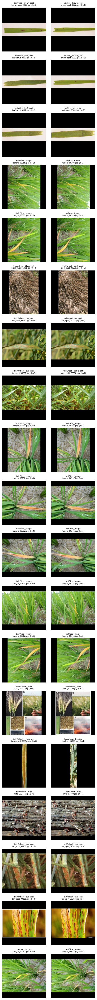


--- fill colour, HIGH-PAD IMAGES ONLY (pad_frac > 0.10) ---
n = 62
fill
4.0      15
5.0      10
6.0       8
1.0       8
3.0       6
0.0       5
2.0       5
255.0     4
253.0     1

--- visual check: classes whose originals are non-square ---


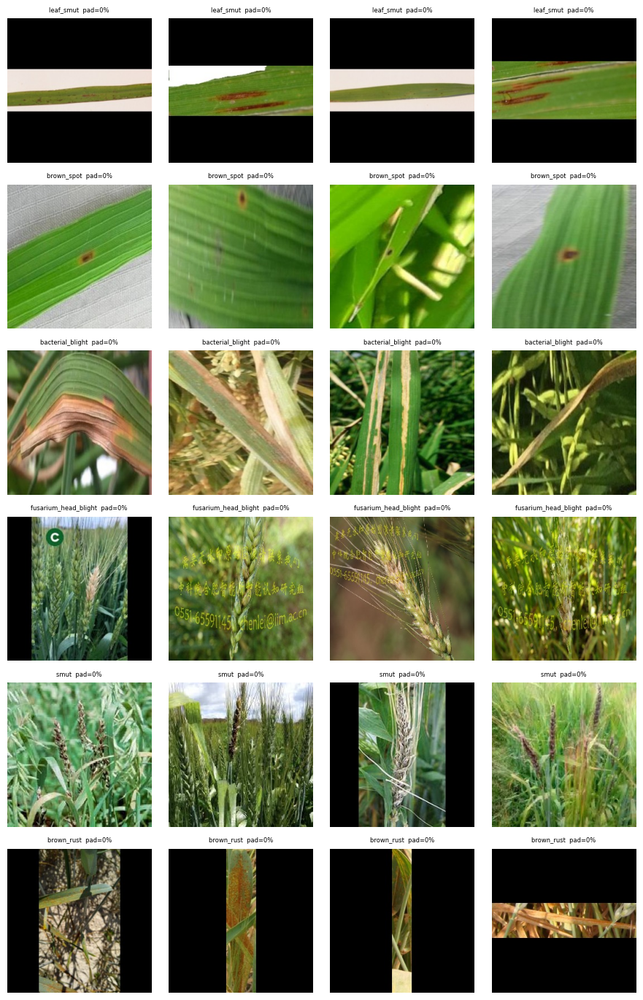


--- top-8 padded train images ---
            label                 file  pad_frac  content_h  content_w     fill
wheat__brown_rust brown_rust_02164.jpg  0.929688         18        256 4.591797
wheat__brown_rust brown_rust_02488.jpg  0.906250         24        256 4.222656
wheat__brown_rust brown_rust_02140.jpg  0.875000        256         32 5.395508
wheat__brown_rust brown_rust_02394.jpg  0.875000        256         32 5.709961
wheat__brown_rust brown_rust_02507.jpg  0.875000         32        256 4.694336
wheat__brown_rust brown_rust_02816.jpg  0.875000         32        256 5.491862
wheat__brown_rust brown_rust_02829.jpg  0.875000        256         32 4.435872
wheat__brown_rust brown_rust_02297.jpg  0.812500         48        256 5.787435


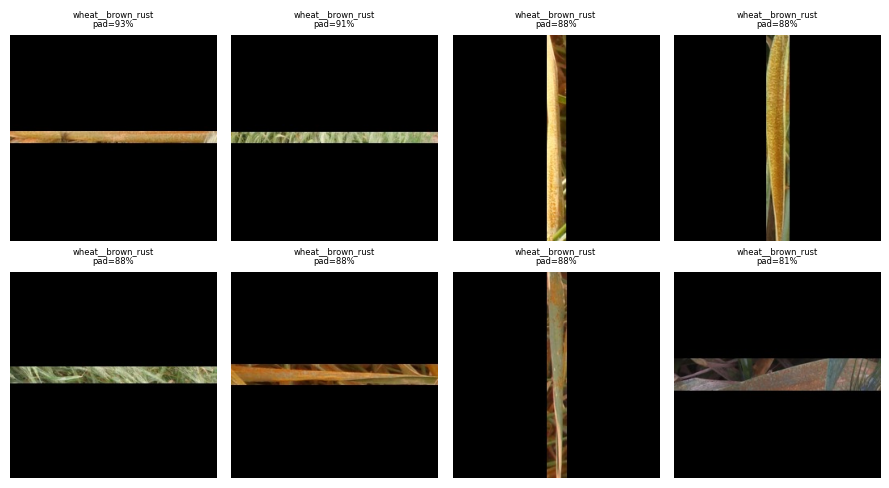

In [4]:
# ============================================================
# CELL A3 — adjudicate near-dups + resolve the letterbox question
# ============================================================
import numpy as np, json, hashlib
from pathlib import Path
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt

ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
SPLITS = ["train", "val", "test"]
df = pd.read_csv("/kaggle/working/geometry_hashes.csv")
df["path"] = df.apply(lambda r: ROOT / r["split"] / r["label"] / r["file"], axis=1)

# ---------- A. within-split exact duplicates: where are they? ----------
dup_mask = df.duplicated(subset=["split", "md5"], keep=False)
dups = df[dup_mask].sort_values(["md5"])
print("--- within-split exact duplicate groups ---")
print(dups.groupby(["split", "label"]).size().to_string() or "none")

# ---------- B. recompute pHash, keep pair indices this time ----------
def _dct1(x):
    N = x.shape[-1]; n = np.arange(N)
    return x @ np.cos(np.pi * (n[:, None] + 0.5) * n[None, :] / N)

def phash64(g32):
    d = _dct1(_dct1(g32.astype(np.float64)).T).T
    low = d[:8, :8]
    return np.packbits((low > np.median(low.flatten()[1:])).flatten())

H = np.stack([phash64(np.asarray(Image.open(p).convert("L").resize((32, 32), Image.LANCZOS)))
              for p in df["path"]])
np.save("/kaggle/working/phash.npy", H)

POP = np.unpackbits(np.arange(256, dtype=np.uint8)[:, None], axis=1).sum(1).astype(np.uint8)
idx = {s: np.flatnonzero((df["split"] == s).values) for s in SPLITS}

pairs = []
for a, b in [("train", "val"), ("train", "test"), ("val", "test")]:
    ia, ib = idx[a], idx[b]
    for i0 in range(0, len(ia), 512):
        blk = ia[i0:i0+512]
        d = POP[np.bitwise_xor(H[blk, None, :], H[ib][None, :, :])].sum(-1)
        for r, c in zip(*np.where(d <= 5)):
            pairs.append((blk[r], ib[c], int(d[r, c])))
print(f"\n--- {len(pairs)} cross-split near-dup pairs ---")

rows = []
for i, j, d in pairs:
    ri, rj = df.iloc[i], df.iloc[j]
    rows.append(dict(ham=d, same_label=(ri.label == rj.label),
                     A=f"{ri.split}/{ri.label}/{ri.file}",
                     B=f"{rj.split}/{rj.label}/{rj.file}"))
pdf = pd.DataFrame(rows).sort_values("ham")
print(pdf.to_string(index=False))
pdf.to_csv("/kaggle/working/near_dup_pairs.csv", index=False)

# visual adjudication grid
n = len(pairs)
if n:
    fig, ax = plt.subplots(n, 2, figsize=(5, 2.5 * n))
    ax = np.atleast_2d(ax)
    for k, (i, j, d) in enumerate(pairs):
        for col, ridx in enumerate([i, j]):
            r = df.iloc[ridx]
            ax[k, col].imshow(Image.open(r["path"])); ax[k, col].axis("off")
            ax[k, col].set_title(f"{r.split}/{r.label}\n{r.file[:22]}  (h={d})", fontsize=6)
    plt.tight_layout(); plt.savefig("/kaggle/working/neardup_grid.png", dpi=110)
    plt.show()

# ---------- C. letterbox reality check ----------
print("\n--- fill colour, HIGH-PAD IMAGES ONLY (pad_frac > 0.10) ---")
hp = df[df["pad_frac"] > 0.10]
print(f"n = {len(hp)}")
print(hp["fill"].round(0).value_counts().head(10).to_string() if len(hp) else "none")

# rice_s2 originals are wide leaf strips — if letterboxed they MUST show bars
print("\n--- visual check: classes whose originals are non-square ---")
probe = ["rice__leaf_smut", "rice__brown_spot", "rice__bacterial_blight",
         "wheat__fusarium_head_blight", "wheat__smut", "wheat__brown_rust"]
fig, ax = plt.subplots(len(probe), 4, figsize=(9, 2.3 * len(probe)))
for r, cls in enumerate(probe):
    sub = df[(df.split == "train") & (df.label == cls)].sample(
        min(4, ((df.split == "train") & (df.label == cls)).sum()), random_state=0)
    for c, (_, row) in enumerate(sub.iterrows()):
        ax[r, c].imshow(Image.open(row["path"])); ax[r, c].axis("off")
        if c == 0:
            ax[r, c].set_ylabel(cls, fontsize=7)
        ax[r, c].set_title(f"{cls.split('__')[1]}  pad={row.pad_frac*100:.0f}%", fontsize=6)
plt.tight_layout(); plt.savefig("/kaggle/working/letterbox_probe.png", dpi=110)
plt.show()

# the 25 heavy-pad outliers — what are they?
top = df[df.split == "train"].nlargest(8, "pad_frac")
print("\n--- top-8 padded train images ---")
print(top[["label", "file", "pad_frac", "content_h", "content_w", "fill"]].to_string(index=False))
fig, ax = plt.subplots(2, 4, figsize=(9, 5))
for a, (_, row) in zip(ax.ravel(), top.iterrows()):
    a.imshow(Image.open(row["path"])); a.axis("off")
    a.set_title(f"{row.label}\npad={row.pad_frac*100:.0f}%", fontsize=6)
plt.tight_layout(); plt.show()

=== per-source manifests ===

=== candidate raw source roots ===
  /kaggle/input/datasets
    crop-disease-prepared-256

=== rice_s2_vbookshelf: 120 images ===
label                   split
rice__bacterial_blight  test      2
                        train    35
                        val       3
rice__brown_spot        test      3
                        train    32
                        val       5
rice__leaf_smut         test      8
                        train    24
                        val       8


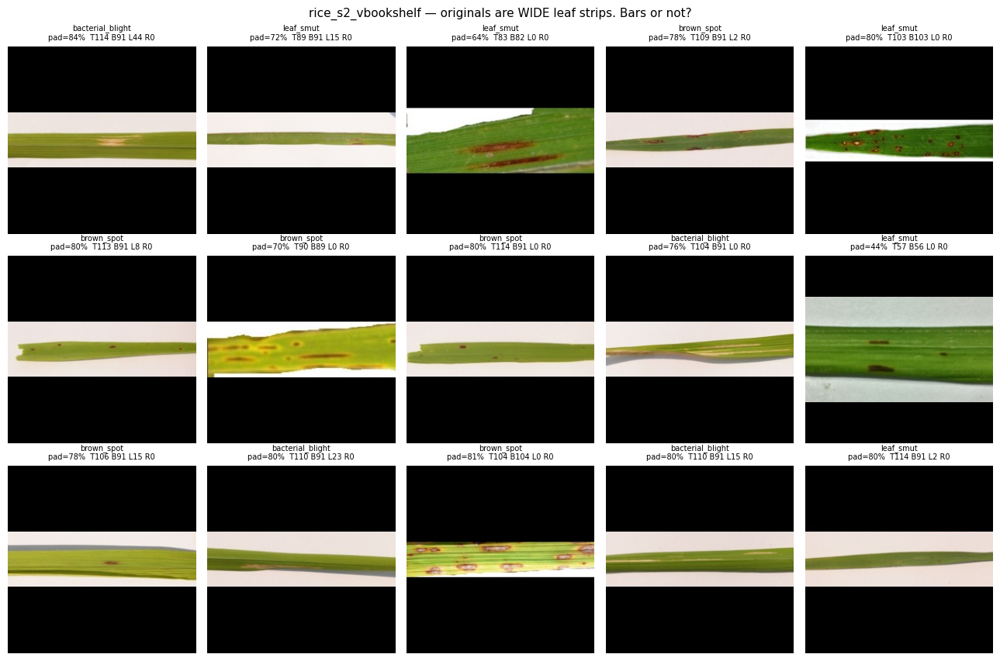

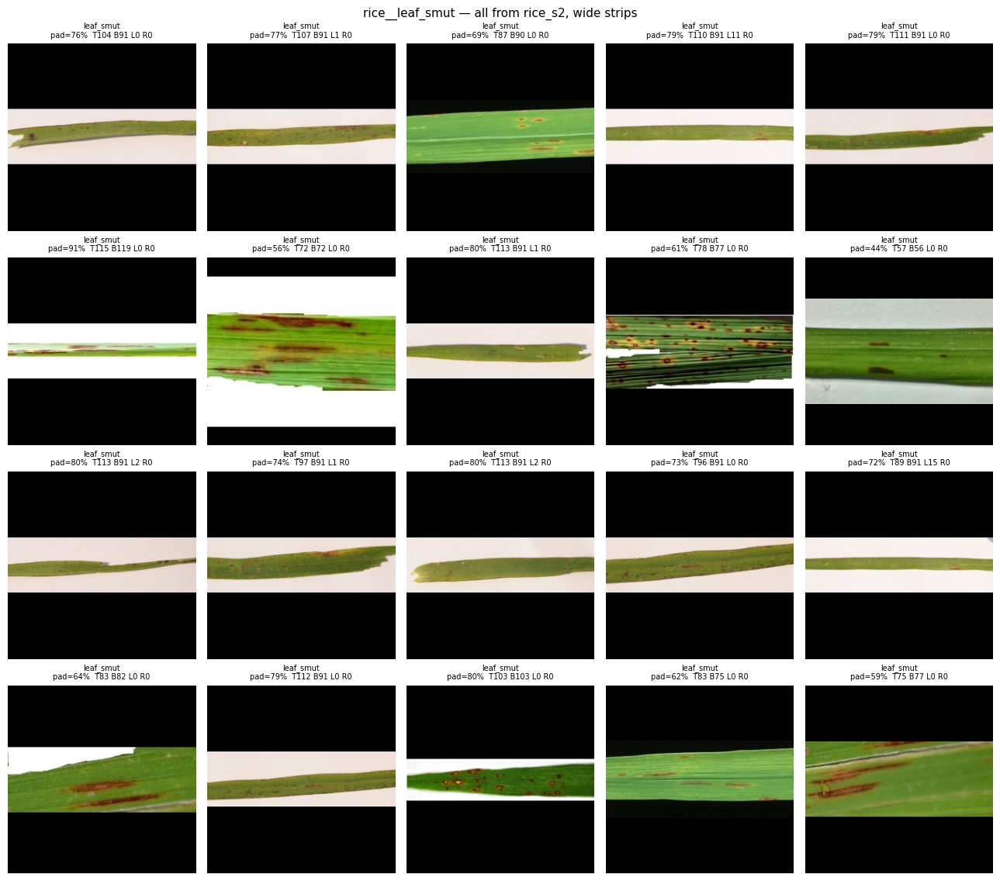


=== ROBUST padding (constant OR replicate bars), train ===
                             mean  median   p90   max  zero_%
label                                                        
rice__leaf_smut              71.3    76.3  79.7  80.5     0.0
wheat__brown_rust            39.1    34.4  72.5  93.8     7.0
wheat__healthy               33.0    32.0  62.5  84.4     8.0
wheat__blast                 32.6    31.6  49.4  69.1     1.9
wheat__leaf_blight           31.1    31.6  47.3  73.8     2.0
wheat__aphid                 30.8    32.0  45.7  74.6     4.4
wheat__tan_spot              30.0    31.2  47.0  70.7     3.9
wheat__black_rust            29.7    31.6  43.8  71.9    10.4
wheat__mite                  29.6    31.4  43.8  75.4     5.1
wheat__stem_fly              29.5    28.0  44.8  77.0     1.4
wheat__common_root_rot       28.9    30.9  44.9  73.8     5.9
wheat__septoria              28.9    31.2  32.4  33.6     0.0
rice__tungro                 28.0    24.6  32.8  43.6     0.0
wheat__smu

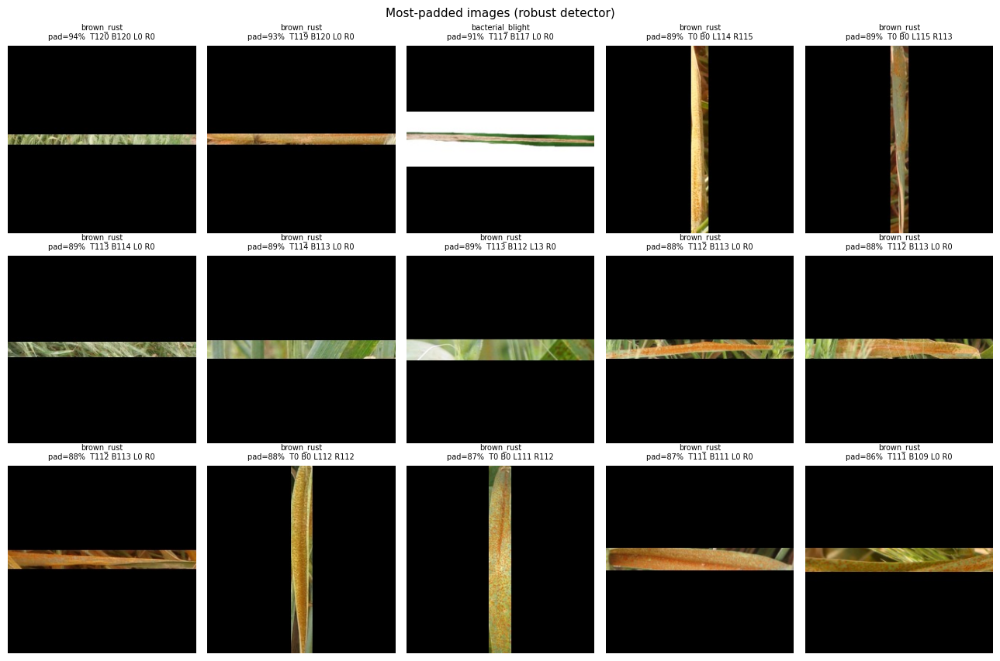

In [5]:
# ============================================================
# CELL A3b — extreme-aspect originals + robust padding detection
# ============================================================
import numpy as np, pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
man  = pd.read_csv(ROOT / "master_manifest.csv")
geo  = pd.read_csv("/kaggle/working/geometry_hashes.csv")

# ---------- A. do the per-source manifests carry original dimensions? ----------
print("=== per-source manifests ===")
src_mans = [p for p in Path("/kaggle/input").rglob("manifest.csv")]
orig = []
for p in src_mans:
    m = pd.read_csv(p)
    print(f"\n{p}\n  rows={len(m)}  cols={list(m.columns)}")
    wh = [c for c in m.columns if any(k in c.lower()
          for k in ("width", "height", "orig", "aspect", "size_w", "size_h"))]
    if wh:
        print("  -> dimension-ish columns:", wh)
        orig.append(m)

# ---------- B. locate the RAW source images (pre-256) if mounted ----------
print("\n=== candidate raw source roots ===")
for d in sorted(Path("/kaggle/input").glob("*")):
    print(" ", d)
for d in sorted(Path("/kaggle/input/datasets/iitm21f1003346").glob("*")):
    print("   ", d.name)

# ---------- C. robust padding detector: constant OR replicate/reflect bars ----------
def bars(a, tol=8):
    """a:(256,256,3) int16. Detect uniform-colour bars AND replicated-row bars."""
    def scan(rows):                       # rows: (256, 256*3)
        n = len(rows)
        uni = (np.ptp(rows, axis=1) <= tol)                 # flat colour
        rep = np.zeros(n, bool)                             # copy of neighbour
        rep[:-1] = (np.abs(np.diff(rows, axis=0)).max(1) <= tol)
        lead = 0
        while lead < n and (uni[lead] or rep[lead]): lead += 1
        trail = 0
        while trail < n and (uni[n-1-trail] or (trail and rep[n-1-trail])): trail += 1
        return lead, trail
    R = a.reshape(256, -1)
    C = a.transpose(1, 0, 2).reshape(256, -1)
    t, b = scan(R)
    l, r = scan(C)
    if t + b >= 250: t = b = 0            # degenerate / blank image guard
    if l + r >= 250: l = r = 0
    h, w = 256 - t - b, 256 - l - r
    return t, b, l, r, 1.0 - (h * w) / 65536

# ---------- D. the decisive sample: rice_s2 (known ~3:1 leaf strips) ----------
s2 = man[man["source_dataset"] == "rice_s2_vbookshelf"]
print(f"\n=== rice_s2_vbookshelf: {len(s2)} images ===")
print(s2.groupby(["label", "split"]).size().to_string())

def show(rows, title, ncol=5, fname=None):
    rows = list(rows)
    nrow = int(np.ceil(len(rows) / ncol))
    fig, ax = plt.subplots(nrow, ncol, figsize=(2.6 * ncol, 2.9 * nrow))
    ax = np.atleast_2d(ax).ravel()
    for a in ax: a.axis("off")
    for a, r in zip(ax, rows):
        p = ROOT / r["split"] / r["label"] / r["filename"]
        im = Image.open(p); arr = np.asarray(im, dtype=np.int16)
        t, b, l, rr, pf = bars(arr)
        a.imshow(im)
        a.set_title(f"{r['label'].split('__')[1]}\npad={pf*100:.0f}%  "
                    f"T{t} B{b} L{l} R{rr}", fontsize=7)
    fig.suptitle(title, fontsize=11)
    plt.tight_layout()
    if fname: plt.savefig(f"/kaggle/working/{fname}", dpi=110, bbox_inches="tight")
    plt.show()

show(s2.sample(min(15, len(s2)), random_state=0).to_dict("records"),
     "rice_s2_vbookshelf — originals are WIDE leaf strips. Bars or not?",
     fname="probe_rice_s2.png")

# leaf_smut specifically — your most fragile class, all 40 of them
ls = man[man["label"] == "rice__leaf_smut"]
show(ls.head(20).to_dict("records"),
     "rice__leaf_smut — all from rice_s2, wide strips",
     fname="probe_leaf_smut.png")

# ---------- E. rerun robust detector across the whole train split ----------
tr = man[man["split"] == "train"]
rec = []
for _, r in tr.iterrows():
    arr = np.asarray(Image.open(ROOT / "train" / r["label"] / r["filename"]),
                     dtype=np.int16)
    t, b, l, rr, pf = bars(arr)
    rec.append(dict(label=r["label"], source=r["source_dataset"],
                    filename=r["filename"], pad2=pf,
                    vbar=(l + rr) / 256, hbar=(t + b) / 256))
rb = pd.DataFrame(rec)

print("\n=== ROBUST padding (constant OR replicate bars), train ===")
tab = (rb.groupby("label")["pad2"].agg(mean="mean", median="median",
        p90=lambda x: x.quantile(.90), max="max").mul(100).round(1)
        .sort_values("mean", ascending=False))
tab["zero_%"] = (rb.groupby("label")["pad2"]
                   .apply(lambda x: (x < 0.01).mean() * 100).round(1))
print(tab.to_string())

print("\nby source_dataset:")
print(rb.groupby("source")["pad2"].agg(["mean", "median", "max"]).mul(100).round(1).to_string())

print("\nA2 (constant-only) vs A3b (robust) — mean pad%%: %.2f -> %.2f"
      % (geo[geo.split == 'train'].pad_frac.mean() * 100, rb.pad2.mean() * 100))

# ---------- F. the widest-bar images under the robust detector ----------
top = rb.nlargest(15, "pad2").merge(
    tr[["filename", "label", "split"]], on=["filename", "label"], how="left")
print("\n=== top-15 by robust padding ===")
print(top[["label", "source", "filename", "pad2", "vbar", "hbar"]].to_string(index=False))
show(top.assign(split="train").to_dict("records"),
     "Most-padded images (robust detector)", fname="probe_toppad.png")
rb.to_csv("/kaggle/working/padding_robust.csv", index=False)

=== implied original aspect ratio (whole dataset) ===
count    12859.00
mean         1.01
std          0.23
min          1.00
50%          1.00
90%          1.00
99%          1.00
99.9%        4.29
max         14.22
  AR >= 1.05:1  ->     60 images ( 0.47%)
  AR >= 1.50:1  ->     31 images ( 0.24%)
  AR >= 2.00:1  ->     22 images ( 0.17%)
  AR >= 3.00:1  ->     16 images ( 0.12%)
  AR >= 5.00:1  ->     12 images ( 0.09%)
  AR >= 8.00:1  ->      7 images ( 0.05%)

=== non-square images by class & split (AR >= 1.5) ===
split                        test  train  val
label                                        
wheat__aphid                    0      1    1
wheat__blast                    0      2    0
wheat__brown_rust               1      9    2
wheat__common_root_rot          1      2    0
wheat__fusarium_head_blight     0      1    0
wheat__healthy                  0      1    1
wheat__leaf_blight              0      2    0
wheat__mite                     0      4    1
wheat__smut     

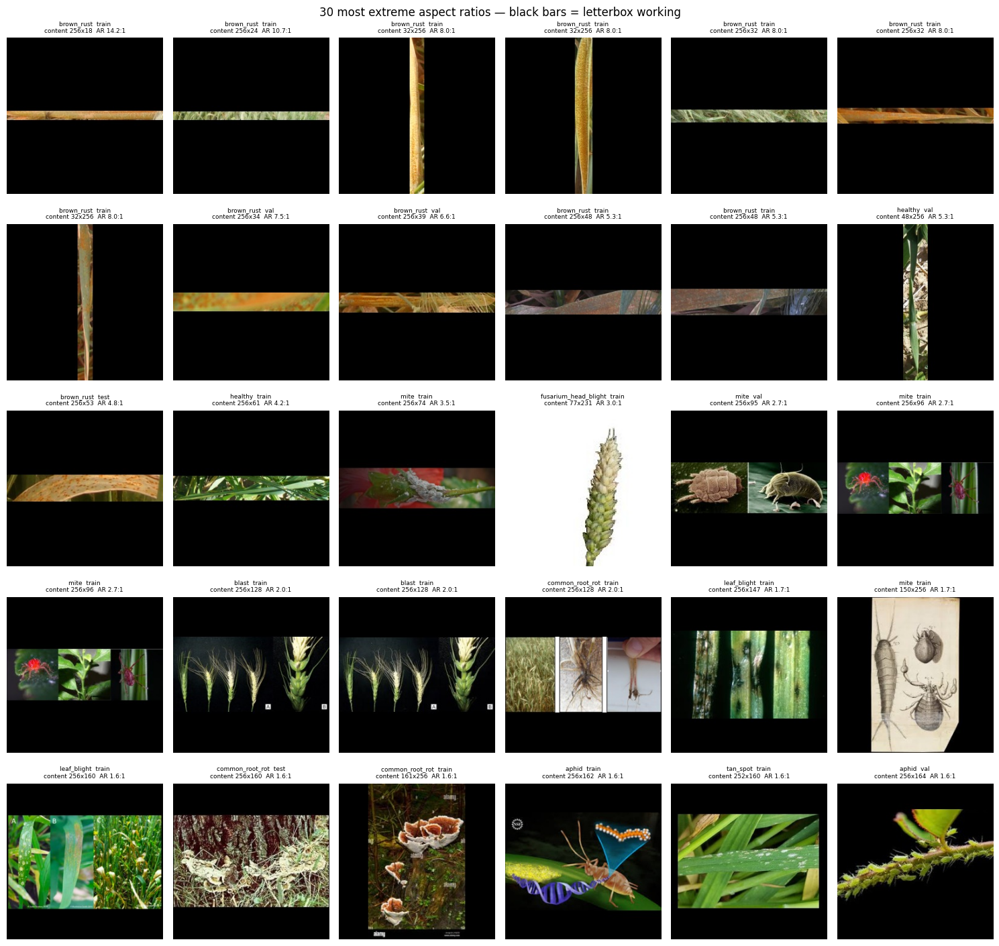

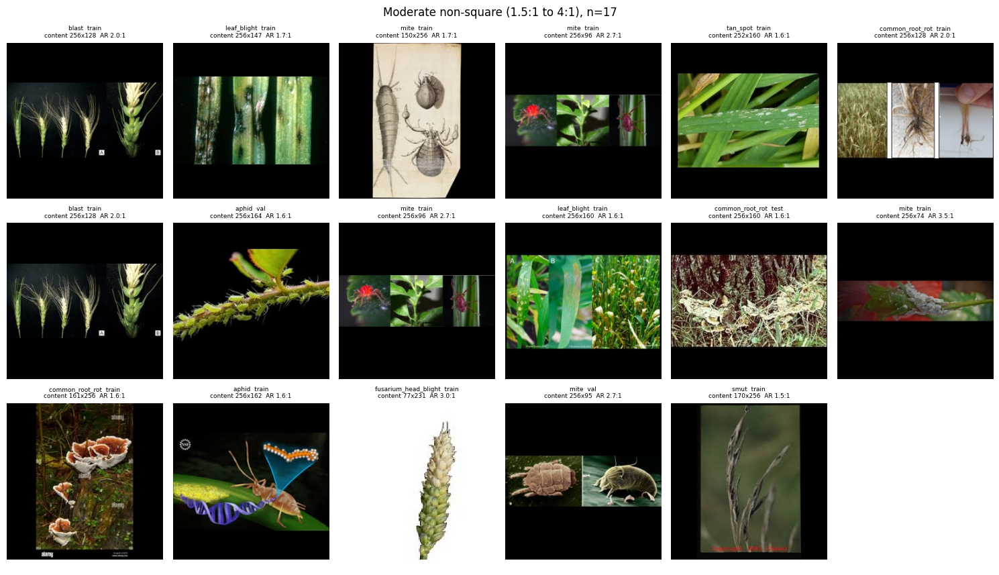


=== rice_s2_vbookshelf: n=120 ===
                        mean  max  count
label                                   
rice__bacterial_blight   1.0  1.0     40
rice__brown_spot         1.0  1.0     40
rice__leaf_smut          1.0  1.0     40
all exactly square? True


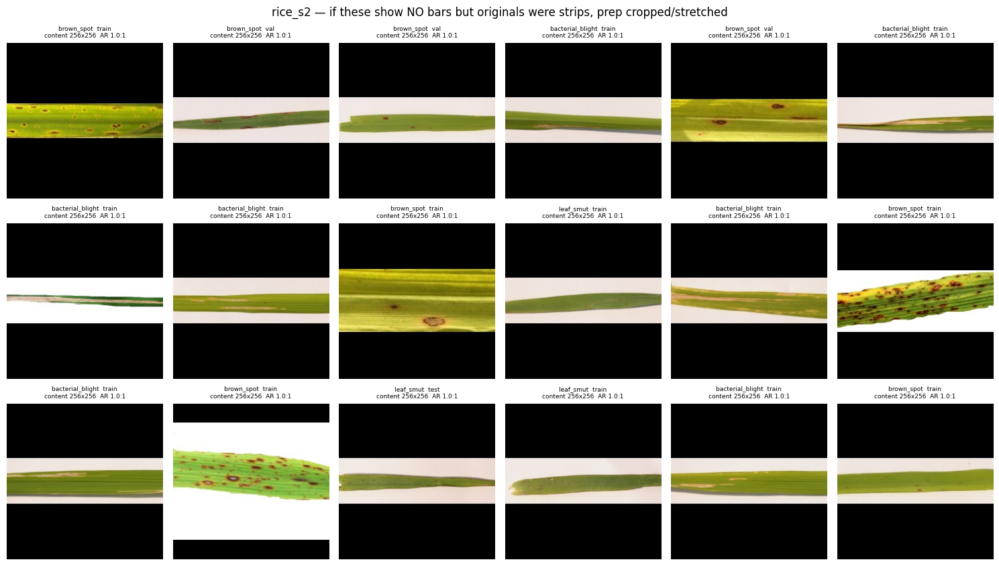


=== searching for raw/intermediate sources ===
indexed 0 candidate source files
no raw sources mounted — add the *-cleaned-256 datasets to the notebook to compare

=== slivers (content dim < 64px): n=14 ===
split              test  train  val
label                              
wheat__brown_rust     1      9    2
wheat__healthy        0      1    1


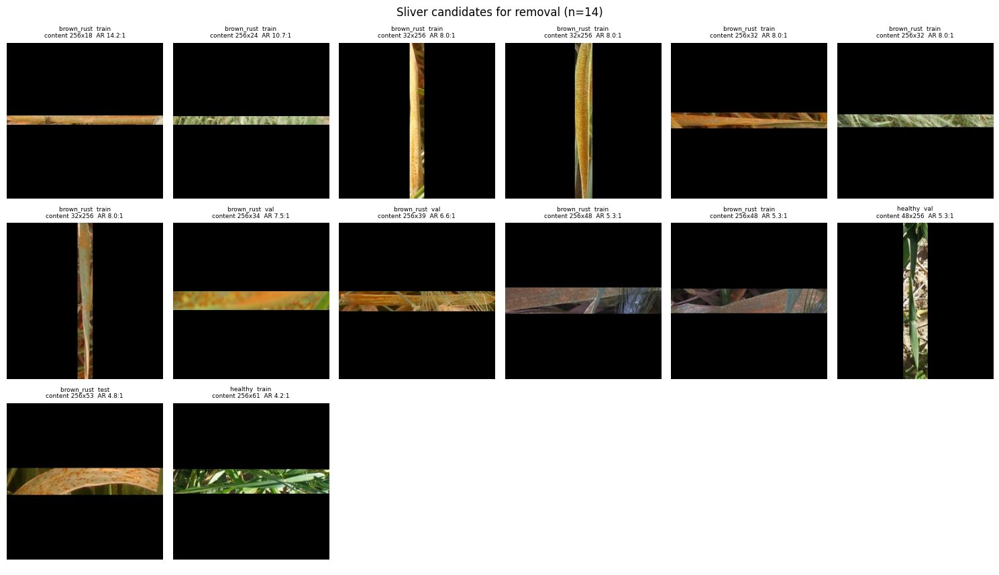

In [6]:
# ============================================================
# CELL A4 — extreme-aspect-ratio images, prepared vs raw
# ============================================================
import numpy as np, pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
man  = pd.read_csv(ROOT / "master_manifest.csv")
geo  = pd.read_csv("/kaggle/working/geometry_hashes.csv")

# reconstruct the implied ORIGINAL aspect ratio from the letterbox geometry
geo["ar"] = geo["content_w"] / geo["content_h"]          # >1 wide, <1 tall
geo["extremity"] = np.maximum(geo["ar"], 1 / geo["ar"])  # 1.0 = square
geo["path"] = geo.apply(lambda r: ROOT / r["split"] / r["label"] / r["file"], axis=1)

print("=== implied original aspect ratio (whole dataset) ===")
print(geo["extremity"].describe(percentiles=[.5, .9, .99, .999]).round(2).to_string())
for thr in [1.05, 1.5, 2.0, 3.0, 5.0, 8.0]:
    n = int((geo["extremity"] >= thr).sum())
    print(f"  AR >= {thr:4.2f}:1  ->  {n:5d} images ({n/len(geo)*100:5.2f}%)")

print("\n=== non-square images by class & split (AR >= 1.5) ===")
ns = geo[geo["extremity"] >= 1.5]
print(pd.crosstab(ns["label"], ns["split"]).to_string() if len(ns) else "none")

def grid(rows, title, ncol=6, fname=None):
    rows = list(rows)
    if not rows:
        print(f"[{title}] nothing to show"); return
    nrow = int(np.ceil(len(rows) / ncol))
    fig, ax = plt.subplots(nrow, ncol, figsize=(2.5*ncol, 2.9*nrow))
    ax = np.atleast_1d(ax).ravel()
    for a in ax: a.axis("off")
    for a, r in zip(ax, rows):
        a.imshow(Image.open(r["path"]))
        a.set_title(f"{r['label'].split('__')[1]}  {r['split']}\n"
                    f"content {r['content_w']}x{r['content_h']}  "
                    f"AR {r['extremity']:.1f}:1", fontsize=6.5)
    fig.suptitle(title, fontsize=12)
    plt.tight_layout()
    if fname: plt.savefig(f"/kaggle/working/{fname}", dpi=115, bbox_inches="tight")
    plt.show()

# ---- 1. the 30 most extreme, all splits ----
grid(geo.nlargest(30, "extremity").to_dict("records"),
     "30 most extreme aspect ratios — black bars = letterbox working",
     fname="extreme_ar.png")

# ---- 2. the moderate band: AR 1.5-4, where real photos live ----
mid = geo[(geo["extremity"] >= 1.5) & (geo["extremity"] < 4.0)]
grid(mid.sample(min(24, len(mid)), random_state=0).to_dict("records"),
     f"Moderate non-square (1.5:1 to 4:1), n={len(mid)}",
     fname="moderate_ar.png")

# ---- 3. rice_s2: the 120 images whose originals are wide leaf strips ----
s2files = set(man[man["source_dataset"] == "rice_s2_vbookshelf"]["filename"])
s2 = geo[geo["file"].isin(s2files)]
print(f"\n=== rice_s2_vbookshelf: n={len(s2)} ===")
print(s2.groupby("label")["extremity"].agg(["mean", "max", "count"]).round(2).to_string())
print("all exactly square?", bool((s2["extremity"] == 1.0).all()))
grid(s2.sample(min(18, len(s2)), random_state=0).to_dict("records"),
     "rice_s2 — if these show NO bars but originals were strips, prep cropped/stretched",
     fname="rice_s2_ar.png")

# ---- 4. side-by-side with RAW source, if the cleaned-256 sets are still mounted ----
print("\n=== searching for raw/intermediate sources ===")
roots = [p for p in Path("/kaggle/input").rglob("prepared") if p.is_dir()]
for p in roots: print("  ", p)

lookup = {}
for p in Path("/kaggle/input").rglob("*.jpg"):
    if "crop-disease-prepared-256" in str(p): continue
    lookup.setdefault(p.name, p)
print(f"indexed {len(lookup)} candidate source files")

probe = geo.nlargest(6, "extremity").to_dict("records") + \
        s2.sample(min(4, len(s2)), random_state=1).to_dict("records")
pairs = [(r, lookup[r["file"]]) for r in probe if r["file"] in lookup]
if pairs:
    fig, ax = plt.subplots(len(pairs), 2, figsize=(7, 3.2*len(pairs)))
    ax = np.atleast_2d(ax)
    for k, (r, src) in enumerate(pairs):
        s = Image.open(src)
        ax[k,0].imshow(s); ax[k,0].axis("off")
        ax[k,0].set_title(f"SOURCE {s.size[0]}x{s.size[1]}  AR {s.size[0]/s.size[1]:.2f}", fontsize=7)
        ax[k,1].imshow(Image.open(r["path"])); ax[k,1].axis("off")
        ax[k,1].set_title(f"PREPARED 256x256  content {r['content_w']}x{r['content_h']}", fontsize=7)
    plt.tight_layout(); plt.savefig("/kaggle/working/src_vs_prepared.png", dpi=115); plt.show()
else:
    print("no raw sources mounted — add the *-cleaned-256 datasets to the notebook to compare")

# ---- 5. quantify the sliver population for removal ----
sliv = geo[(geo["content_w"] < 64) | (geo["content_h"] < 64)]
print(f"\n=== slivers (content dim < 64px): n={len(sliv)} ===")
print(pd.crosstab(sliv["label"], sliv["split"]).to_string() if len(sliv) else "none")
sliv[["split","label","file","content_w","content_h","extremity"]].to_csv(
    "/kaggle/working/sliver_candidates.csv", index=False)
grid(sliv.nlargest(min(18, len(sliv)), "extremity").to_dict("records"),
     f"Sliver candidates for removal (n={len(sliv)})", fname="slivers.png")

In [7]:
# ============================================================
# CELL A5 — exclusions (slivers + near-dups) then train statistics
# ============================================================
import numpy as np, pandas as pd, json
from pathlib import Path
from PIL import Image

ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
geo  = pd.read_csv("/kaggle/working/geometry_hashes.csv")
ndp  = pd.read_csv("/kaggle/working/near_dup_pairs.csv")
geo["path"] = geo.apply(lambda r: ROOT / r["split"] / r["label"] / r["file"], axis=1)
geo["pad"]  = 1 - (geo["content_h"] * geo["content_w"]) / 65536
geo["key"]  = geo["split"] + "/" + geo["label"] + "/" + geo["file"]

# ---------- 1a. degenerate slivers ----------
sliver = geo[(geo["content_w"] < 64) | (geo["content_h"] < 64) | (geo["pad"] > 0.60)]
print(f"=== slivers: {len(sliver)} ===")
print(pd.crosstab(sliver["label"], sliver["split"]).to_string())

# ---------- 1b. near-dups: drop the EVAL-side member ----------
RANK = {"train": 0, "val": 1, "test": 2}          # higher rank = drop it
sliver_keys = set(sliver["key"])
drop_nd = set()
for _, r in ndp.iterrows():
    if r["A"] in sliver_keys or r["B"] in sliver_keys:
        continue                                   # sliver pair = hash artifact, not a dup
    drop_nd.add(r["A"] if RANK[r["A"].split("/")[0]] > RANK[r["B"].split("/")[0]] else r["B"])
print(f"\n=== near-dup removals: {len(drop_nd)} unique eval images ===")
nd = geo[geo["key"].isin(drop_nd)]
print(pd.crosstab(nd["label"], nd["split"]).to_string())

# ---------- 1c. freeze the exclusion list ----------
excl = pd.concat([sliver.assign(reason="degenerate_sliver"),
                  nd.assign(reason="cross_split_neardup")]).drop_duplicates("key")
excl[["split","label","file","content_w","content_h","pad","reason"]].to_csv(
    "/kaggle/working/exclusions.csv", index=False)
keep = geo[~geo["key"].isin(set(excl["key"]))].copy()

print(f"\n=== TOTAL EXCLUDED: {len(excl)} ({len(excl)/len(geo)*100:.2f}%) ===")
before = geo.groupby("split").size(); after = keep.groupby("split").size()
print(pd.DataFrame({"before": before, "after": after, "removed": before-after}).to_string())

print("\n--- classes losing eval images ---")
chg = (geo.groupby(["label","split"]).size().rename("before").to_frame()
         .join(keep.groupby(["label","split"]).size().rename("after")).fillna(0))
chg["d"] = chg["after"] - chg["before"]
print(chg[chg["d"] != 0].to_string())
below = chg.reset_index().query("split in ['val','test'] and after < 8")
print("\n!! classes now below MIN_EVAL=8:",
      below[["label","split","after"]].to_dict("records") or "none ✅")

# ---------- 2. per-channel mean/std, TRAIN ONLY ----------
tr = keep[keep["split"] == "train"]
n, s, ss = 0, np.zeros(3), np.zeros(3)
bright, sharp = [], []
for p in tr["path"]:
    a = np.asarray(Image.open(p), dtype=np.float32) / 255.0
    f = a.reshape(-1, 3)
    s += f.sum(0); ss += (f**2).sum(0); n += f.shape[0]
    g = a.mean(2)
    bright.append(float(g.mean()))
    lap = g[:-2,1:-1] + g[2:,1:-1] + g[1:-1,:-2] + g[1:-1,2:] - 4*g[1:-1,1:-1]
    sharp.append(float(lap.var()))
mean, std = s/n, np.sqrt(ss/n - (s/n)**2)
IMNET_M, IMNET_S = np.array([.485,.456,.406]), np.array([.229,.224,.225])
print("\n=== train per-channel statistics ===")
print("dataset mean:", mean.round(4).tolist(), " std:", std.round(4).tolist())
print("imagenet mean:", IMNET_M.tolist(), " std:", IMNET_S.tolist())
print("max |delta| — mean: %.4f   std: %.4f" %
      (np.abs(mean-IMNET_M).max(), np.abs(std-IMNET_S).max()))

tr = tr.assign(bright=bright, sharp=sharp)
print("\n=== brightness / sharpness by class ===")
print(tr.groupby("label")[["bright","sharp"]].mean().round(4)
        .sort_values("bright").to_string())
mb = tr[tr.label=="wheat__mildew"].bright
print("\nmildew brightness %.4f vs rest %.4f  (z = %.2f)" %
      (mb.mean(), tr[tr.label!="wheat__mildew"].bright.mean(),
       (mb.mean()-tr.bright.mean())/tr.bright.std()))

# ---------- 3. class-weight options ----------
cnt = tr.groupby("label").size().sort_values()
inv  = len(tr) / (len(cnt) * cnt)
sq   = np.sqrt(inv); sq /= sq.mean()
eff  = (1-0.999) / (1-0.999**cnt); eff /= eff.mean()
cw = pd.DataFrame({"n": cnt, "inv": inv.round(3), "sqrt": sq.round(3), "eff_num": eff.round(3)})
cw["draws_inv"]  = (inv  * cnt).round(0)
cw["draws_sqrt"] = (sq   * cnt).round(0)
print("\n=== class weights (train) ===")
print(cw.to_string())
print(f"\nimbalance: {cnt.max()}/{cnt.min()} = {cnt.max()/cnt.min():.1f}:1")
cw.to_csv("/kaggle/working/class_weights.csv")
keep[["split","label","file"]].to_csv("/kaggle/working/clean_index.csv", index=False)
tr[["label","bright","sharp"]].to_csv("/kaggle/working/train_imgstats.csv", index=False)

=== slivers: 19 ===
split                        test  train  val
label                                        
wheat__brown_rust               1      9    2
wheat__fusarium_head_blight     0      1    0
wheat__healthy                  0      1    1
wheat__mite                     0      3    1

=== near-dup removals: 17 unique eval images ===
split               test  val
label                        
rice__brown_spot       0    1
rice__leaf_smut        0    1
rice__tungro           6    2
wheat__black_rust      0    1
wheat__blast           1    0
wheat__leaf_blight     0    1
wheat__mite            1    0
wheat__tan_spot        2    1

=== TOTAL EXCLUDED: 36 (0.28%) ===
       before  after  removed
split                        
test     1292   1281       11
train   10275  10261       14
val      1292   1281       11

--- classes losing eval images ---
                                   before  after  d
label                       split                  
rice__brown_spot            

clean index: {'test': 1281, 'train': 10261, 'val': 1281}
audit sample: 594 images


/tmp/ipykernel_58/96569535.py:60: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  samp = tr.groupby("label", group_keys=False).apply(



=== AUDIT 1: sharpness as a rice-vs-wheat detector (AUC) ===
  before augmentation : 0.833
  after  augmentation : 0.604   (0.50 = shortcut destroyed)

=== AUDIT 2: sharpness spread across classes ===
  before  min=0.0019  max=0.0472  ratio= 25.0x
  after   min=0.0059  max=0.0216  ratio=  3.7x

=== AUDIT 3: rice__leaf_smut brightness gap ===
  before  leaf_smut=0.2500  rest=0.3682  gap=+0.1183  AUC=0.821
  after   leaf_smut=0.2291  rest=0.3337  gap=+0.1046  AUC=0.776


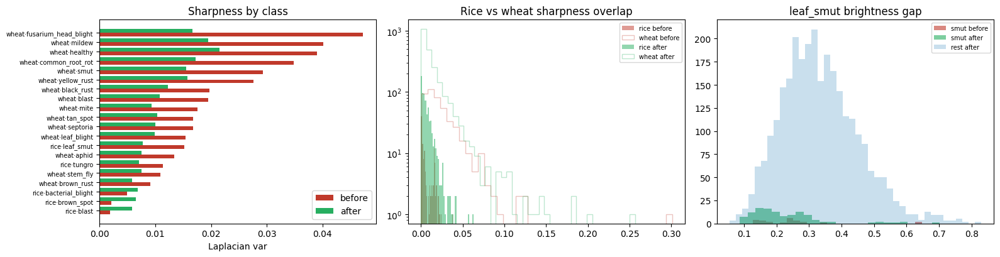

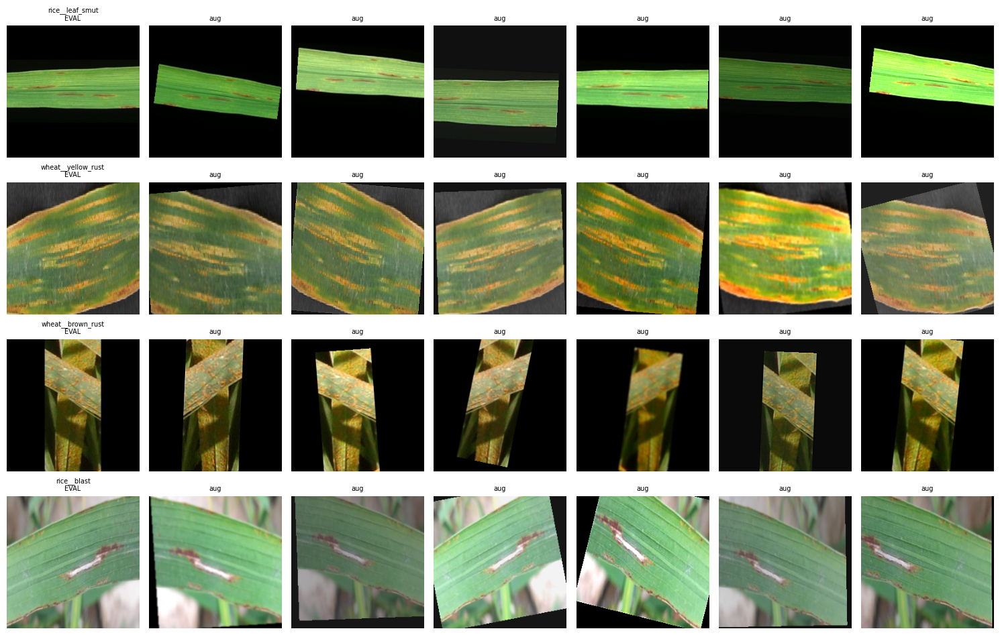


saved aug_config.json


In [8]:
# ============================================================
# CELL B1 — augmentation policy + shortcut destruction audit
# ============================================================
import numpy as np, pandas as pd, json, torch
from pathlib import Path
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

ROOT  = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
clean = pd.read_csv("/kaggle/working/clean_index.csv")
print("clean index:", clean.groupby("split").size().to_dict())

IMG, SEED = 224, 42
torch.manual_seed(SEED); np.random.seed(SEED)

# ---- normalisation: BOTH candidates, decided empirically in B2 ----
NORM = {
    "imagenet": ([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    "dataset" : ([0.3530, 0.3835, 0.2540], [0.2782, 0.2850, 0.2388]),
}

# ---- photometric + geometric stack (pre-normalisation) ----
train_pre = T.Compose([
    T.RandomResizedCrop(IMG, scale=(0.65, 1.0), ratio=(0.80, 1.25),
                        interpolation=T.InterpolationMode.BICUBIC),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomAffine(degrees=15, translate=(0.08, 0.08), scale=(0.92, 1.08),
                   interpolation=T.InterpolationMode.BILINEAR),
    T.ColorJitter(brightness=0.35, contrast=0.30, saturation=0.25, hue=0.02),
    # two-sided sharpness randomisation — breaks the rice/wheat blur shortcut
    T.RandomApply([T.GaussianBlur(kernel_size=5, sigma=(0.1, 1.6))], p=0.35),
    T.RandomAdjustSharpness(sharpness_factor=2.5, p=0.35),
    T.ToTensor(),
])
eval_pre = T.Compose([T.CenterCrop(IMG), T.ToTensor()])

def build(norm_key, train):
    m, s = NORM[norm_key]
    base = train_pre if train else eval_pre
    steps = [base, T.Normalize(m, s)]
    if train:
        steps.append(T.RandomErasing(p=0.15, scale=(0.02, 0.10), ratio=(0.3, 3.3), value=0))
    return T.Compose(steps)

# ---- measurement helpers (operate on [0,1] tensors, pre-normalisation) ----
def stats(t):
    g = t.mean(0).numpy()
    lap = g[:-2,1:-1] + g[2:,1:-1] + g[1:-1,:-2] + g[1:-1,2:] - 4*g[1:-1,1:-1]
    return float(g.mean()), float(lap.var())

def auc(pos, neg):                       # Mann-Whitney U -> AUC
    a = np.concatenate([pos, neg]); r = a.argsort().argsort() + 1
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum() - n1*(n1+1)/2) / (n1*n0)

# ---- sample images ----
tr = clean[clean["split"] == "train"]
PER = 30
samp = tr.groupby("label", group_keys=False).apply(
    lambda d: d.sample(min(PER, len(d)), random_state=SEED))
paths = [ROOT/"train"/r.label/r.file for r in samp.itertuples()]
labels = samp["label"].tolist()
print(f"audit sample: {len(paths)} images")

REPS = 5
base_b, base_s, aug_b, aug_s, aug_lab = [], [], [], [], []
for p, lab in zip(paths, labels):
    im = Image.open(p)
    b, s = stats(eval_pre(im)); base_b.append(b); base_s.append(s)
    for _ in range(REPS):
        b, s = stats(train_pre(im)); aug_b.append(b); aug_s.append(s); aug_lab.append(lab)

base = pd.DataFrame({"label": labels, "bright": base_b, "sharp": base_s})
aug  = pd.DataFrame({"label": aug_lab, "bright": aug_b, "sharp": aug_s})

# ---- AUDIT 1: can sharpness alone separate rice from wheat? ----
def crop_auc(d):
    r = d[d.label.str.startswith("rice")]["sharp"].values
    w = d[d.label.str.startswith("wheat")]["sharp"].values
    return auc(w, r)                     # wheat sharper => AUC -> 1.0
print("\n=== AUDIT 1: sharpness as a rice-vs-wheat detector (AUC) ===")
print(f"  before augmentation : {crop_auc(base):.3f}")
print(f"  after  augmentation : {crop_auc(aug):.3f}   (0.50 = shortcut destroyed)")

# ---- AUDIT 2: per-class sharpness spread ----
print("\n=== AUDIT 2: sharpness spread across classes ===")
for nm, d in [("before", base), ("after", aug)]:
    m = d.groupby("label")["sharp"].mean()
    print(f"  {nm:6s}  min={m.min():.4f}  max={m.max():.4f}  ratio={m.max()/m.min():5.1f}x")

# ---- AUDIT 3: leaf_smut brightness gap ----
print("\n=== AUDIT 3: rice__leaf_smut brightness gap ===")
for nm, d in [("before", base), ("after", aug)]:
    ls = d[d.label == "rice__leaf_smut"]["bright"]
    rest = d[d.label != "rice__leaf_smut"]["bright"]
    print(f"  {nm:6s}  leaf_smut={ls.mean():.4f}  rest={rest.mean():.4f}  "
          f"gap={rest.mean()-ls.mean():+.4f}  AUC={auc(rest.values, ls.values):.3f}")

# ---- plots ----
fig, ax = plt.subplots(1, 3, figsize=(16, 4.2))
o = base.groupby("label")["sharp"].mean().sort_values()
a = aug.groupby("label")["sharp"].mean().reindex(o.index)
y = np.arange(len(o))
ax[0].barh(y-0.2, o.values, 0.4, label="before", color="#c0392b")
ax[0].barh(y+0.2, a.values, 0.4, label="after",  color="#27ae60")
ax[0].set_yticks(y); ax[0].set_yticklabels([i.replace("__","·") for i in o.index], fontsize=7)
ax[0].set_title("Sharpness by class"); ax[0].set_xlabel("Laplacian var"); ax[0].legend()

for d, c, n in [(base,"#c0392b","before"), (aug,"#27ae60","after")]:
    ax[1].hist(d[d.label.str.startswith("rice")]["sharp"], 40, alpha=.5, color=c, label=f"rice {n}")
    ax[1].hist(d[d.label.str.startswith("wheat")]["sharp"], 40, alpha=.3,
               color=c, histtype="step", lw=2, label=f"wheat {n}")
ax[1].set_title("Rice vs wheat sharpness overlap"); ax[1].legend(fontsize=7); ax[1].set_yscale("log")

ax[2].hist(base[base.label=="rice__leaf_smut"]["bright"], 25, alpha=.6, color="#c0392b", label="smut before")
ax[2].hist(aug[aug.label=="rice__leaf_smut"]["bright"], 25, alpha=.6, color="#27ae60", label="smut after")
ax[2].hist(aug[aug.label!="rice__leaf_smut"]["bright"], 40, alpha=.25, color="#2980b9", label="rest after")
ax[2].set_title("leaf_smut brightness gap"); ax[2].legend(fontsize=7)
plt.tight_layout(); plt.savefig("/kaggle/working/aug_audit.png", dpi=120); plt.show()

# ---- visual: what the model actually sees ----
show = ["rice__leaf_smut", "wheat__yellow_rust", "wheat__brown_rust", "rice__blast"]
fig, ax = plt.subplots(len(show), 7, figsize=(15, 2.4*len(show)))
for r, cls in enumerate(show):
    p = ROOT/"train"/cls/tr[tr.label==cls].sample(1, random_state=1).iloc[0].file
    im = Image.open(p)
    ax[r,0].imshow(eval_pre(im).permute(1,2,0)); ax[r,0].set_title(f"{cls}\nEVAL", fontsize=7)
    for c in range(1, 7):
        ax[r,c].imshow(train_pre(im).permute(1,2,0).clamp(0,1)); ax[r,c].set_title("aug", fontsize=7)
    for c in range(7): ax[r,c].axis("off")
plt.tight_layout(); plt.savefig("/kaggle/working/aug_examples.png", dpi=120); plt.show()

json.dump({"img_size": IMG, "seed": SEED, "norm_candidates": NORM,
           "train": {"rrc_scale": [0.65,1.0], "rrc_ratio": [0.80,1.25], "hflip": 0.5,
                     "vflip": 0, "affine_deg": 15, "translate": 0.08, "scale": [0.92,1.08],
                     "brightness": 0.35, "contrast": 0.30, "saturation": 0.25, "hue": 0.02,
                     "blur_p": 0.35, "blur_sigma": [0.1,1.6],
                     "sharpen_p": 0.35, "sharpen_factor": 2.5,
                     "erasing_p": 0.15},
           "eval": {"center_crop": IMG}},
          open("/kaggle/working/aug_config.json","w"), indent=2)
print("\nsaved aug_config.json")

/tmp/ipykernel_58/3366035876.py:54: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  samp = tr.groupby("label", group_keys=False).apply(


=== shortcut audit: base (no aug) / v1 (B1) / v2 (+RandomExposure) ===
      sharp_auc  sharp_ratio  bright_auc  bright_gap  smut_mean  rest_mean
cfg                                                                       
base      0.833         25.0       0.821      0.1183     0.2500     0.3682
v1        0.598          3.2       0.771      0.1088     0.2294     0.3381
v2        0.603          3.8       0.718      0.0720     0.2703     0.3423

0.50 = shortcut destroyed;  1.00 = perfectly predictive


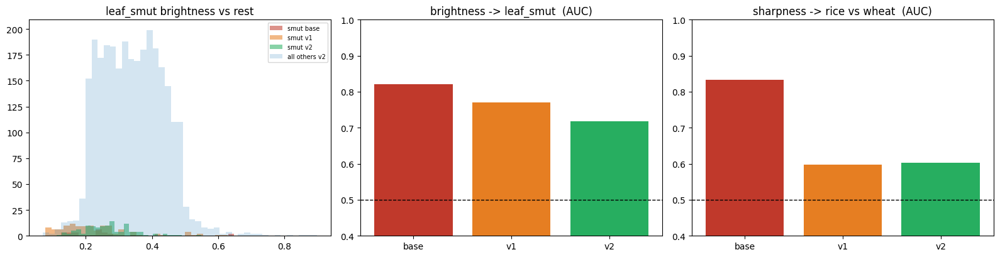

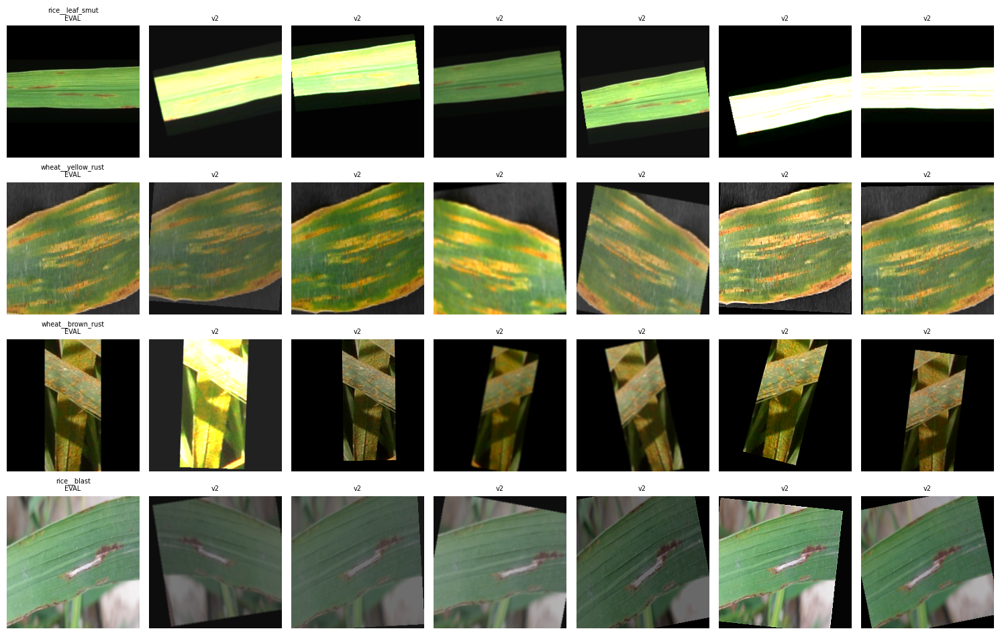


updated aug_config.json with audit table


In [9]:
# ============================================================
# CELL B1b — exposure randomisation + re-audit (v1 vs v2)
# ============================================================
import numpy as np, pandas as pd, json, torch, random
from pathlib import Path
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

ROOT  = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
clean = pd.read_csv("/kaggle/working/clean_index.csv")
IMG, SEED = 224, 42
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)

class RandomExposure(torch.nn.Module):
    """Rescale a [0,1] tensor so its mean luminance is a random draw from
    `target`, decorrelating absolute exposure from class identity.
    Multiplicative jitter cannot do this (E[factor]=1); this can."""
    def __init__(self, target=(0.20, 0.50), p=0.7, eps=1e-4):
        super().__init__(); self.lo, self.hi, self.p, self.eps = *target, p, eps
    def forward(self, x):
        if torch.rand(1).item() > self.p: return x
        cur = x.mean()
        if cur < self.eps: return x
        tgt = torch.empty(1).uniform_(self.lo, self.hi).item()
        return (x * (tgt / cur)).clamp_(0, 1)

geo_photo = [
    T.RandomResizedCrop(IMG, scale=(0.65,1.0), ratio=(0.80,1.25),
                        interpolation=T.InterpolationMode.BICUBIC),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomAffine(degrees=15, translate=(0.08,0.08), scale=(0.92,1.08),
                   interpolation=T.InterpolationMode.BILINEAR),
    T.ColorJitter(brightness=0.35, contrast=0.30, saturation=0.25, hue=0.02),
    T.RandomApply([T.GaussianBlur(5, sigma=(0.1,1.6))], p=0.35),
    T.RandomAdjustSharpness(2.5, p=0.35),
    T.ToTensor(),
]
pre_v1 = T.Compose(geo_photo)                                  # as shipped in B1
pre_v2 = T.Compose(geo_photo + [RandomExposure((0.20,0.50), p=0.7)])
eval_pre = T.Compose([T.CenterCrop(IMG), T.ToTensor()])

def stats(t):
    g = t.mean(0).numpy()
    lap = g[:-2,1:-1]+g[2:,1:-1]+g[1:-1,:-2]+g[1:-1,2:]-4*g[1:-1,1:-1]
    return float(g.mean()), float(lap.var())

def auc(pos, neg):
    a = np.concatenate([pos, neg]); r = a.argsort().argsort()+1
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum()-n1*(n1+1)/2)/(n1*n0)

tr = clean[clean["split"]=="train"]
samp = tr.groupby("label", group_keys=False).apply(
    lambda d: d.sample(min(30,len(d)), random_state=SEED))
items = [(ROOT/"train"/r.label/r.file, r.label) for r in samp.itertuples()]

REPS, out = 5, {"base": [], "v1": [], "v2": []}
for p, lab in items:
    im = Image.open(p)
    b, s = stats(eval_pre(im)); out["base"].append((lab, b, s))
    for _ in range(REPS):
        for k, tf in [("v1", pre_v1), ("v2", pre_v2)]:
            b, s = stats(tf(im)); out[k].append((lab, b, s))
D = {k: pd.DataFrame(v, columns=["label","bright","sharp"]) for k, v in out.items()}

rows = []
for k, d in D.items():
    rice = d[d.label.str.startswith("rice")]["sharp"].values
    wheat = d[d.label.str.startswith("wheat")]["sharp"].values
    ls = d[d.label=="rice__leaf_smut"]["bright"].values
    rest = d[d.label!="rice__leaf_smut"]["bright"].values
    m = d.groupby("label")["sharp"].mean()
    rows.append(dict(cfg=k,
        sharp_auc=round(auc(wheat, rice), 3),
        sharp_ratio=round(m.max()/m.min(), 1),
        bright_auc=round(auc(rest, ls), 3),
        bright_gap=round(rest.mean()-ls.mean(), 4),
        smut_mean=round(ls.mean(), 4), rest_mean=round(rest.mean(), 4)))
res = pd.DataFrame(rows).set_index("cfg")
print("=== shortcut audit: base (no aug) / v1 (B1) / v2 (+RandomExposure) ===")
print(res.to_string())
print("\n0.50 = shortcut destroyed;  1.00 = perfectly predictive")

fig, ax = plt.subplots(1, 3, figsize=(16, 4.2))
for k, c in [("base","#c0392b"), ("v1","#e67e22"), ("v2","#27ae60")]:
    d = D[k]
    ax[0].hist(d[d.label=="rice__leaf_smut"]["bright"], 30, alpha=.55, color=c, label=f"smut {k}")
ax[0].hist(D["v2"][D["v2"].label!="rice__leaf_smut"]["bright"], 45, alpha=.2,
           color="#2980b9", label="all others v2")
ax[0].set_title("leaf_smut brightness vs rest"); ax[0].legend(fontsize=7)

ax[1].bar(range(3), res["bright_auc"], color=["#c0392b","#e67e22","#27ae60"])
ax[1].axhline(0.5, ls="--", c="k", lw=1); ax[1].set_xticks(range(3))
ax[1].set_xticklabels(res.index); ax[1].set_ylim(0.4, 1.0)
ax[1].set_title("brightness -> leaf_smut  (AUC)")

ax[2].bar(range(3), res["sharp_auc"], color=["#c0392b","#e67e22","#27ae60"])
ax[2].axhline(0.5, ls="--", c="k", lw=1); ax[2].set_xticks(range(3))
ax[2].set_xticklabels(res.index); ax[2].set_ylim(0.4, 1.0)
ax[2].set_title("sharpness -> rice vs wheat  (AUC)")
plt.tight_layout(); plt.savefig("/kaggle/working/aug_audit_v2.png", dpi=120); plt.show()

show = ["rice__leaf_smut","wheat__yellow_rust","wheat__brown_rust","rice__blast"]
fig, ax = plt.subplots(len(show), 7, figsize=(15, 2.4*len(show)))
for r, cls in enumerate(show):
    f = tr[tr.label==cls].sample(1, random_state=1).iloc[0].file
    im = Image.open(ROOT/"train"/cls/f)
    ax[r,0].imshow(eval_pre(im).permute(1,2,0)); ax[r,0].set_title(f"{cls}\nEVAL", fontsize=7)
    for c in range(1,7):
        ax[r,c].imshow(pre_v2(im).permute(1,2,0).clamp(0,1)); ax[r,c].set_title("v2", fontsize=7)
    for c in range(7): ax[r,c].axis("off")
plt.tight_layout(); plt.savefig("/kaggle/working/aug_examples_v2.png", dpi=120); plt.show()

cfg = json.load(open("/kaggle/working/aug_config.json"))
cfg["train"]["random_exposure"] = {"target": [0.20,0.50], "p": 0.7}
cfg["audit"] = res.to_dict("index")
json.dump(cfg, open("/kaggle/working/aug_config.json","w"), indent=2)
print("\nupdated aug_config.json with audit table")

audit sample: 594 images


/tmp/ipykernel_58/3754159863.py:76: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  samp = tr.groupby("label", group_keys=False).apply(



=== shortcut audit: base / v2 (mult+clamp) / v3 (gamma) ===
      sharp_auc  sharpn_auc  sharpn_ratio  bright_auc  bright_gap  smut_mean  rest_mean
cfg                                                                                    
base      0.833       0.803          37.6       0.821      0.1183     0.2500     0.3682
v2        0.617       0.621           5.5       0.745      0.0760     0.2632     0.3392
v3        0.611       0.595           4.4       0.552      0.0207     0.3460     0.3667

0.50 = shortcut destroyed;  1.00 = perfectly predictive


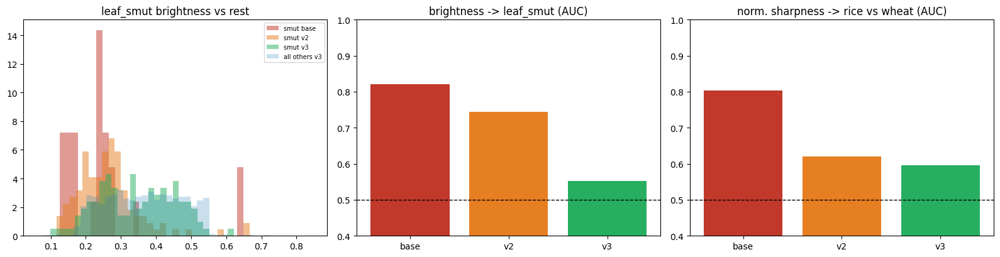

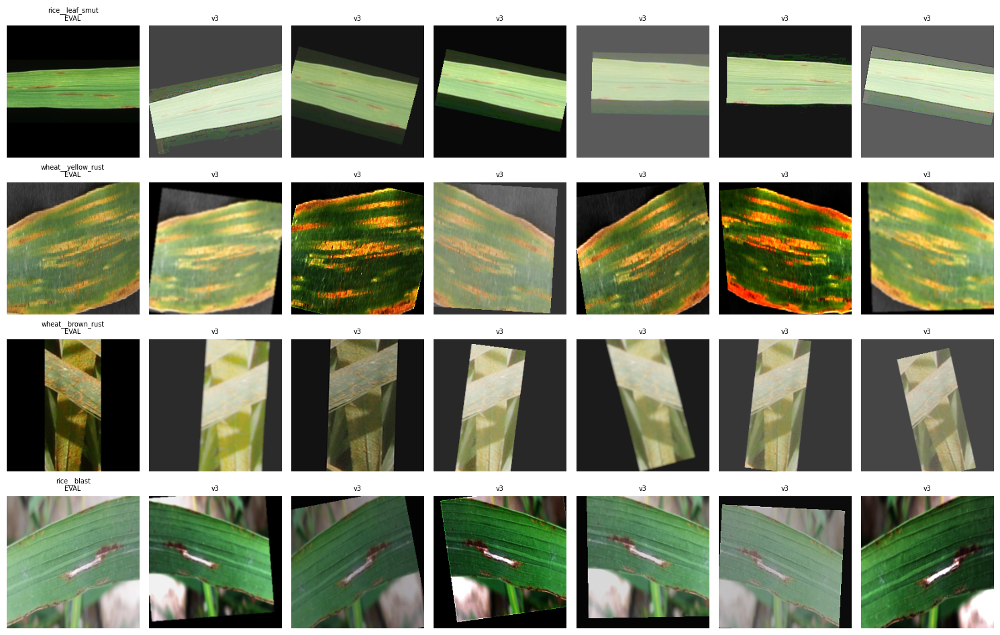


updated aug_config.json


In [10]:
# ============================================================
# CELL B1c — gamma-based exposure randomisation (v3) + re-audit
# ============================================================
import numpy as np, pandas as pd, json, torch, random
from pathlib import Path
from PIL import Image
import torchvision.transforms as T
import matplotlib.pyplot as plt

ROOT  = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
clean = pd.read_csv("/kaggle/working/clean_index.csv")
IMG, SEED = 224, 42
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)

class RandomExposure(torch.nn.Module):
    """v2, kept for the comparison row: multiplicative rescale + clamp."""
    def __init__(self, target=(0.20,0.50), p=0.7, eps=1e-4):
        super().__init__(); self.lo, self.hi, self.p, self.eps = *target, p, eps
    def forward(self, x):
        if torch.rand(1).item() > self.p: return x
        cur = x.mean()
        if cur < self.eps: return x
        tgt = torch.empty(1).uniform_(self.lo, self.hi).item()
        return (x * (tgt / cur)).clamp_(0, 1)

class RandomExposureGamma(torch.nn.Module):
    """v3: drive mean luminance to a random target via power-law tone curve.
    x -> x**g is monotone and bijective on [0,1] => no clipping, so a dark
    image can actually reach the bright end of the range. g by bisection on a
    strided pixel subsample (mean(x**g) is monotone DECREASING in g)."""
    def __init__(self, target=(0.18,0.55), p=0.9, iters=10, eps=1e-3, stride=31):
        super().__init__()
        self.lo, self.hi = target
        self.p, self.iters, self.eps, self.stride = p, iters, eps, stride
    def forward(self, x):
        if torch.rand(1).item() > self.p: return x
        xc = x.clamp(self.eps, 1.0)
        probe = xc.reshape(-1)[::self.stride]
        cur = probe.mean().item()
        if not (self.eps < cur < 1 - self.eps): return x
        tgt = random.uniform(self.lo, self.hi)
        g_lo, g_hi = 0.15, 6.0
        for _ in range(self.iters):
            g = 0.5*(g_lo + g_hi)
            if probe.pow(g).mean().item() > tgt: g_lo = g   # too bright -> darken
            else:                                g_hi = g
        return xc.pow(0.5*(g_lo + g_hi))

geo_photo = [
    T.RandomResizedCrop(IMG, scale=(0.65,1.0), ratio=(0.80,1.25),
                        interpolation=T.InterpolationMode.BICUBIC),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomAffine(degrees=15, translate=(0.08,0.08), scale=(0.92,1.08),
                   interpolation=T.InterpolationMode.BILINEAR),
    T.ColorJitter(brightness=0.35, contrast=0.30, saturation=0.25, hue=0.02),
    T.RandomApply([T.GaussianBlur(5, sigma=(0.1,1.6))], p=0.35),
    T.RandomAdjustSharpness(2.5, p=0.35),
    T.ToTensor(),
]
pre_v2   = T.Compose(geo_photo + [RandomExposure((0.20,0.50), p=0.7)])
pre_v3   = T.Compose(geo_photo + [RandomExposureGamma((0.18,0.55), p=0.9)])
eval_pre = T.Compose([T.CenterCrop(IMG), T.ToTensor()])

def stats(t):
    g = t.mean(0).numpy()
    lap = g[:-2,1:-1]+g[2:,1:-1]+g[1:-1,:-2]+g[1:-1,2:]-4*g[1:-1,1:-1]
    m = float(g.mean()); v = float(lap.var())
    return m, v, v/max(m*m, 1e-8)          # bright, sharp, exposure-normalised sharp

def auc(pos, neg):
    a = np.concatenate([pos, neg]); r = a.argsort().argsort()+1
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum()-n1*(n1+1)/2)/(n1*n0)

tr   = clean[clean["split"]=="train"]
samp = tr.groupby("label", group_keys=False).apply(
           lambda d: d.sample(min(30,len(d)), random_state=SEED))
items = [(ROOT/"train"/r.label/r.file, r.label) for r in samp.itertuples()]
print(f"audit sample: {len(items)} images")

REPS, out = 5, {"base": [], "v2": [], "v3": []}
for p, lab in items:
    im = Image.open(p)
    out["base"].append((lab, *stats(eval_pre(im))))
    for _ in range(REPS):
        for k, tf in [("v2", pre_v2), ("v3", pre_v3)]:
            out[k].append((lab, *stats(tf(im))))
D = {k: pd.DataFrame(v, columns=["label","bright","sharp","sharpn"]) for k,v in out.items()}

rows = []
for k, d in D.items():
    rice  = d[d.label.str.startswith("rice")]
    wheat = d[d.label.str.startswith("wheat")]
    ls    = d[d.label=="rice__leaf_smut"]["bright"].values
    rest  = d[d.label!="rice__leaf_smut"]["bright"].values
    mn    = d.groupby("label")["sharpn"].mean()
    rows.append(dict(cfg=k,
        sharp_auc  = round(auc(wheat["sharp"].values,  rice["sharp"].values),  3),
        sharpn_auc = round(auc(wheat["sharpn"].values, rice["sharpn"].values), 3),
        sharpn_ratio = round(mn.max()/mn.min(), 1),
        bright_auc = round(auc(rest, ls), 3),
        bright_gap = round(rest.mean()-ls.mean(), 4),
        smut_mean  = round(ls.mean(), 4), rest_mean = round(rest.mean(), 4)))
res = pd.DataFrame(rows).set_index("cfg")
print("\n=== shortcut audit: base / v2 (mult+clamp) / v3 (gamma) ===")
print(res.to_string())
print("\n0.50 = shortcut destroyed;  1.00 = perfectly predictive")

fig, ax = plt.subplots(1, 3, figsize=(16, 4.2))
for k, c in [("base","#c0392b"), ("v2","#e67e22"), ("v3","#27ae60")]:
    ax[0].hist(D[k][D[k].label=="rice__leaf_smut"]["bright"], 30, alpha=.5,
               color=c, label=f"smut {k}", density=True)
ax[0].hist(D["v3"][D["v3"].label!="rice__leaf_smut"]["bright"], 45, alpha=.25,
           color="#2980b9", label="all others v3", density=True)
ax[0].set_title("leaf_smut brightness vs rest"); ax[0].legend(fontsize=7)
for i, col, ttl in [(1,"bright_auc","brightness -> leaf_smut (AUC)"),
                    (2,"sharpn_auc","norm. sharpness -> rice vs wheat (AUC)")]:
    ax[i].bar(range(3), res[col], color=["#c0392b","#e67e22","#27ae60"])
    ax[i].axhline(0.5, ls="--", c="k", lw=1); ax[i].set_xticks(range(3))
    ax[i].set_xticklabels(res.index); ax[i].set_ylim(0.4, 1.0); ax[i].set_title(ttl)
plt.tight_layout(); plt.savefig("/kaggle/working/aug_audit_v3.png", dpi=120); plt.show()

show = ["rice__leaf_smut","wheat__yellow_rust","wheat__brown_rust","rice__blast"]
fig, ax = plt.subplots(len(show), 7, figsize=(15, 2.4*len(show)))
for r, cls in enumerate(show):
    f = tr[tr.label==cls].sample(1, random_state=1).iloc[0].file
    im = Image.open(ROOT/"train"/cls/f)
    ax[r,0].imshow(eval_pre(im).permute(1,2,0)); ax[r,0].set_title(f"{cls}\nEVAL", fontsize=7)
    for c in range(1,7):
        ax[r,c].imshow(pre_v3(im).permute(1,2,0).clamp(0,1)); ax[r,c].set_title("v3", fontsize=7)
    for c in range(7): ax[r,c].axis("off")
plt.tight_layout(); plt.savefig("/kaggle/working/aug_examples_v3.png", dpi=120); plt.show()

cfg = json.load(open("/kaggle/working/aug_config.json"))
cfg["train"]["random_exposure"] = {"kind":"gamma", "target":[0.18,0.55], "p":0.9}
cfg["audit_v3"] = res.to_dict("index")
json.dump(cfg, open("/kaggle/working/aug_config.json","w"), indent=2)
print("\nupdated aug_config.json")

In [11]:
import torch, subprocess
print("cuda:", torch.cuda.is_available(), "| devices:", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    p = torch.cuda.get_device_properties(i)
    print(f"  [{i}] {p.name}  {p.total_memory/1e9:.1f} GB  sm_{p.major}{p.minor}")
print("tensor cores (sm_70+):", torch.cuda.get_device_properties(0).major >= 7)
print(subprocess.run(["nproc"], capture_output=True, text=True).stdout.strip(), "CPU cores")

cuda: True | devices: 2
  [0] Tesla T4  15.6 GB  sm_75
  [1] Tesla T4  15.6 GB  sm_75
tensor cores (sm_70+): True
4 CPU cores


In [12]:
# ============================================================
# CELL B2 — frozen-backbone feature extraction + linear probe
# ============================================================
import os, io, json, time, random
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from PIL import Image
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, TensorDataset, WeightedRandomSampler
from sklearn.metrics import f1_score, accuracy_score
import timm

DEV = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", DEV, "| timm", timm.__version__)

ROOT  = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
clean = pd.read_csv("/kaggle/working/clean_index.csv")
FEAT  = Path("/kaggle/working/feats"); FEAT.mkdir(parents=True, exist_ok=True)
IMG, SEED = 224, 42
MODEL = "vit_small_patch16_224.augreg_in21k_ft_in1k"
torch.manual_seed(SEED); np.random.seed(SEED); random.seed(SEED)

CLASSES = sorted(clean["label"].unique())
L2I = {l: i for i, l in enumerate(CLASSES)}
json.dump(L2I, open("/kaggle/working/label_to_idx.json", "w"), indent=2)
tr_cnt = clean[clean.split=="train"].label.value_counts().reindex(CLASSES).fillna(0).astype(int)
RARE = list(tr_cnt.nsmallest(2).index)          # auto-pick the two extreme minorities
print(f"{len(CLASSES)} classes | rarest: {dict(tr_cnt.nsmallest(3))}")

# ---------- model + the three normalisation candidates ----------
model = timm.create_model(MODEL, pretrained=True, num_classes=0).eval().to(DEV)
dc = timm.data.resolve_model_data_config(model)
print("resolved model data config:", {k: dc[k] for k in ("input_size","mean","std","crop_pct")})

NORM = {"native":   (list(dc["mean"]), list(dc["std"])),
        "imagenet": ([0.485,0.456,0.406], [0.229,0.224,0.225]),
        "dataset":  ([0.3530,0.3835,0.2540], [0.2782,0.2850,0.2388])}
# drop duplicates if the checkpoint's native stats ARE classic ImageNet
if np.allclose(NORM["native"][0], NORM["imagenet"][0]) and \
   np.allclose(NORM["native"][1], NORM["imagenet"][1]):
    NORM.pop("imagenet"); print("native == imagenet, collapsed to 2 candidates")
print("candidates:", {k: [np.round(v[0],3).tolist(), np.round(v[1],3).tolist()] for k,v in NORM.items()})

# ---------- RAM-cached raw loader (kills all /kaggle/input I/O) ----------
class RawDS(Dataset):
    def __init__(self, split):
        self.rows = clean[clean.split == split].reset_index(drop=True)
        t0 = time.time()
        self.buf = [(ROOT/split/r.label/r.file).read_bytes() for r in self.rows.itertuples()]
        self.y = np.array([L2I[l] for l in self.rows.label], dtype=np.int64)
        self.tf = T.Compose([T.CenterCrop(IMG), T.ToTensor()])
        print(f"  {split}: {len(self.buf)} files cached, "
              f"{sum(map(len,self.buf))/1e6:.0f} MB, {time.time()-t0:.0f}s")
    def __len__(self): return len(self.buf)
    def __getitem__(self, i):
        return self.tf(Image.open(io.BytesIO(self.buf[i])).convert("RGB")), self.y[i]

@torch.no_grad()
def extract(split, bs=128):
    done = all((FEAT/f"X_{k}_{split}.npy").exists() for k in NORM) and (FEAT/f"y_{split}.npy").exists()
    if done:
        print(f"  {split}: features already on disk, skipping"); return
    ds = RawDS(split)
    dl = DataLoader(ds, batch_size=bs, shuffle=False, num_workers=2, pin_memory=(DEV=="cuda"))
    ms = {k: (torch.tensor(m, device=DEV).view(1,3,1,1), torch.tensor(s, device=DEV).view(1,3,1,1))
          for k,(m,s) in NORM.items()}
    acc, ys, t0 = {k: [] for k in NORM}, [], time.time()
    for x, y in dl:
        x = x.to(DEV, non_blocking=True); ys.append(y.numpy())
        for k,(m,s) in ms.items():
            with torch.autocast("cuda", dtype=torch.float16, enabled=(DEV=="cuda")):
                f = model((x - m) / s)
            acc[k].append(f.float().cpu().numpy().astype(np.float16))
    np.save(FEAT/f"y_{split}.npy", np.concatenate(ys))
    for k in NORM: np.save(FEAT/f"X_{k}_{split}.npy", np.concatenate(acc[k]))
    print(f"  {split}: extracted in {time.time()-t0:.0f}s -> {np.concatenate(acc[list(NORM)[0]]).shape}")

print("\n--- extracting features (eval transform, no augmentation) ---")
for sp in ("train", "val"): extract(sp)

# ---------- linear probe on cached features ----------
def probe(Xtr, ytr, Xva, yva, balance="sqrt", epochs=60, lr=1e-3, wd=1e-4, ls=0.1, bs=256):
    torch.manual_seed(SEED); np.random.seed(SEED)
    ds = TensorDataset(torch.tensor(Xtr, dtype=torch.float32), torch.tensor(ytr))
    if balance == "sqrt":
        cnt = np.bincount(ytr, minlength=len(CLASSES)).astype(np.float64)
        wc  = 1.0/np.sqrt(np.maximum(cnt, 1))
        sam = WeightedRandomSampler(torch.tensor(wc[ytr], dtype=torch.double),
                                    len(ytr), replacement=True)
        dl = DataLoader(ds, batch_size=bs, sampler=sam)
    else:
        dl = DataLoader(ds, batch_size=bs, shuffle=True)
    Xva_t = torch.tensor(Xva, dtype=torch.float32).to(DEV)
    head = nn.Linear(Xtr.shape[1], len(CLASSES)).to(DEV)
    opt  = torch.optim.AdamW(head.parameters(), lr=lr, weight_decay=wd)
    sch  = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=ls)
    best, curve = (-1.0, None, -1), []
    for ep in range(epochs):
        head.train()
        for xb, yb in dl:
            xb, yb = xb.to(DEV), yb.to(DEV)
            opt.zero_grad(); crit(head(xb), yb).backward(); opt.step()
        sch.step(); head.eval()
        with torch.no_grad(): pv = head(Xva_t).argmax(1).cpu().numpy()
        f1 = f1_score(yva, pv, average="macro", zero_division=0); curve.append(f1)
        if f1 > best[0]: best = (f1, pv, ep)
    f1, pv, ep = best
    per = f1_score(yva, pv, average=None, zero_division=0, labels=range(len(CLASSES)))
    row = dict(macro_f1=round(f1,4), acc=round(accuracy_score(yva,pv),4), best_ep=ep,
               min_f1=round(float(per.min()),4))
    for r in RARE: row[r.split("__")[1]] = round(float(per[L2I[r]]), 4)
    return row, per, curve

ytr = np.load(FEAT/"y_train.npy"); yva = np.load(FEAT/"y_val.npy")
maj = np.bincount(yva, minlength=len(CLASSES)).max()/len(yva)
print(f"\nmajority-class val accuracy floor: {maj:.3f}   (macro-F1 floor ~{2*maj/(1+len(CLASSES)*maj):.3f})")

rows, pers, curves = [], {}, {}
for nk in NORM:
    Xtr = np.load(FEAT/f"X_{nk}_train.npy"); Xva = np.load(FEAT/f"X_{nk}_val.npy")
    for bal in ("none", "sqrt"):
        r, per, cv = probe(Xtr, ytr, Xva, yva, balance=bal)
        r = {"norm": nk, "balance": bal, **r}; rows.append(r)
        pers[(nk,bal)] = per; curves[(nk,bal)] = cv
        print(f"  {nk:9s} {bal:5s} -> macroF1 {r['macro_f1']:.4f}  acc {r['acc']:.4f}  "
              f"min {r['min_f1']:.3f}  (ep {r['best_ep']})")

res = pd.DataFrame(rows).sort_values("macro_f1", ascending=False).reset_index(drop=True)
print("\n=== LINEAR PROBE GRID (frozen backbone, val split) ===")
print(res.to_string(index=False))

win = res.iloc[0]
print(f"\nwinner: norm={win['norm']}  balance={win['balance']}  macro-F1={win['macro_f1']}")
print("\n--- per-class F1, winning config (ascending) ---")
pc = pd.Series(pers[(win['norm'], win['balance'])], index=CLASSES).sort_values()
print(pd.DataFrame({"f1": pc.round(3), "train_n": tr_cnt.reindex(pc.index)}).to_string())

json.dump({"grid": rows, "winner": {"norm": win["norm"], "balance": win["balance"]},
           "model": MODEL, "norm_values": {k: v for k, v in NORM.items()}},
          open("/kaggle/working/probe_results.json","w"), indent=2, default=str)
print("\nwrote probe_results.json")

device: cuda | timm 1.0.26
20 classes | rarest: {'rice__leaf_smut': np.int64(24), 'wheat__stem_fly': np.int64(138), 'wheat__black_rust': np.int64(251)}


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

resolved model data config: {'input_size': (3, 224, 224), 'mean': (0.5, 0.5, 0.5), 'std': (0.5, 0.5, 0.5), 'crop_pct': 0.9}
candidates: {'native': [[0.5, 0.5, 0.5], [0.5, 0.5, 0.5]], 'imagenet': [[0.485, 0.456, 0.406], [0.229, 0.224, 0.225]], 'dataset': [[0.353, 0.384, 0.254], [0.278, 0.285, 0.239]]}

--- extracting features (eval transform, no augmentation) ---
  train: features already on disk, skipping
  val: features already on disk, skipping

majority-class val accuracy floor: 0.105   (macro-F1 floor ~0.068)
  native    none  -> macroF1 0.8461  acc 0.8564  min 0.507  (ep 13)
  native    sqrt  -> macroF1 0.8453  acc 0.8587  min 0.521  (ep 26)
  imagenet  none  -> macroF1 0.8326  acc 0.8470  min 0.496  (ep 47)
  imagenet  sqrt  -> macroF1 0.8236  acc 0.8423  min 0.460  (ep 57)
  dataset   none  -> macroF1 0.8274  acc 0.8470  min 0.478  (ep 14)
  dataset   sqrt  -> macroF1 0.8216  acc 0.8423  min 0.429  (ep 32)

=== LINEAR PROBE GRID (frozen backbone, val split) ===
    norm balance 

train (10261, 384)  val (1281, 384)

=== 1. split counts (val < 15 => per-class F1 is noise) ===
                             train  val
rice__leaf_smut                 24    7
wheat__stem_fly                138   17
wheat__black_rust              251   31
wheat__septoria                279   35
rice__tungro                   375   45
rice__blast                    381   48
wheat__smut                    404   50
rice__bacterial_blight         444   55
wheat__leaf_blight             455   55
wheat__common_root_rot         454   57
wheat__blast                   466   59
rice__brown_spot               516   64
wheat__fusarium_head_blight    510   64
wheat__tan_spot                517   65
wheat__mite                    609   75
wheat__aphid                   687   86
wheat__healthy                 827  103
wheat__mildew                  899  113
wheat__brown_rust              944  117
wheat__yellow_rust            1081  135

=== 2. val -> nearest train neighbour, cosine similarity ===
q

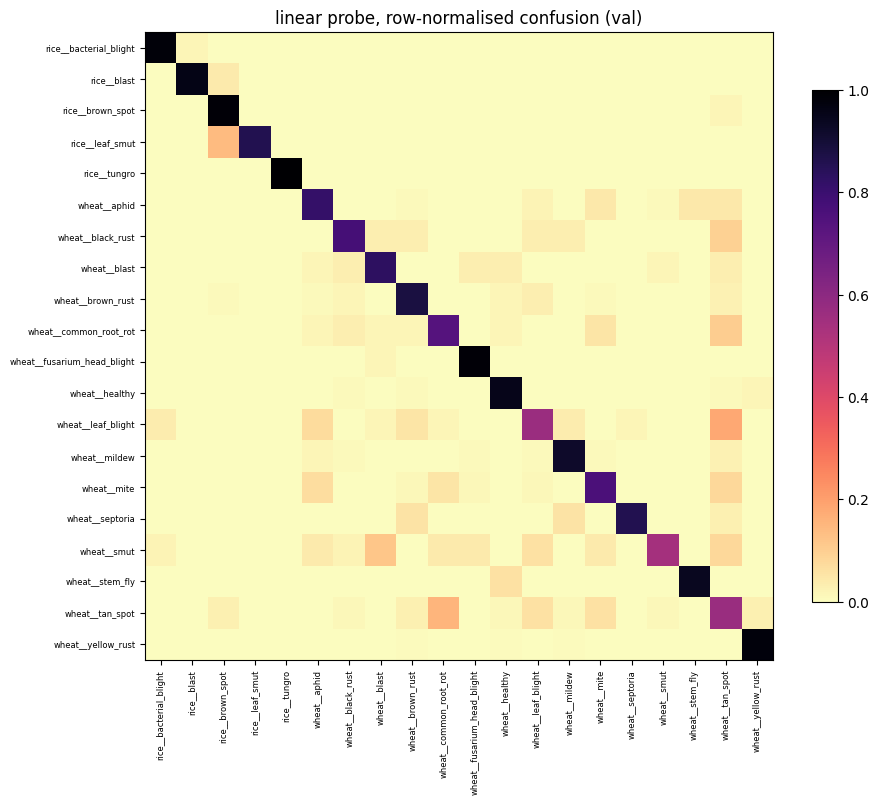


wrote probe_diagnostics.json


In [13]:
# ============================================================
# CELL C1 — probe diagnostics: feature-space leakage, crop shortcut, confusion
# ============================================================
import json
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt

FEAT, DEV = Path("/kaggle/working/feats"), ("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42
clean = pd.read_csv("/kaggle/working/clean_index.csv")
L2I   = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k, _ in sorted(L2I.items(), key=lambda kv: kv[1])]
NC = len(CLASSES)

Xtr = np.load(FEAT/"X_native_train.npy").astype(np.float32)
Xva = np.load(FEAT/"X_native_val.npy").astype(np.float32)
ytr, yva = np.load(FEAT/"y_train.npy"), np.load(FEAT/"y_val.npy")
tr_rows = clean[clean.split=="train"].reset_index(drop=True)
va_rows = clean[clean.split=="val"].reset_index(drop=True)
assert len(tr_rows)==len(Xtr) and len(va_rows)==len(Xva), "row order desync — stop here"
print(f"train {Xtr.shape}  val {Xva.shape}")

# ---------- 1. how small is val, per class? ----------
cnt = pd.DataFrame({"train": np.bincount(ytr, minlength=NC),
                    "val":   np.bincount(yva, minlength=NC)}, index=CLASSES)
print("\n=== 1. split counts (val < 15 => per-class F1 is noise) ===")
print(cnt.sort_values("val").to_string())

# ---------- 2. feature-space leakage: nearest train neighbour of each val image ----------
A = torch.tensor(Xva, device=DEV); B = torch.tensor(Xtr, device=DEV)
A = A/A.norm(dim=1, keepdim=True); B = B/B.norm(dim=1, keepdim=True)
sim, idx = (A @ B.T).max(1)
sim, idx = sim.cpu().numpy(), idx.cpu().numpy()
nn_df = pd.DataFrame({
    "val_label": va_rows.label, "val_file": va_rows.file, "nn_sim": sim,
    "nn_label": tr_rows.label.values[idx], "nn_file": tr_rows.file.values[idx]})
nn_df["same_label"] = nn_df.val_label == nn_df.nn_label

print("\n=== 2. val -> nearest train neighbour, cosine similarity ===")
print("quantiles:", {q: round(float(np.quantile(sim, q)), 4)
                     for q in (0.05, 0.25, 0.5, 0.75, 0.95, 0.99)})
for t in (0.90, 0.95, 0.98, 0.995):
    n = int((sim > t).sum())
    print(f"  sim > {t:.3f}:  {n:4d} val images ({n/len(sim)*100:5.2f}%)")
print("\n--- per-class mean NN similarity (descending = most redundant) ---")
per_nn = nn_df.groupby("val_label").agg(mean_sim=("nn_sim","mean"),
                                        max_sim=("nn_sim","max"),
                                        n_over_95=("nn_sim", lambda s: int((s>0.95).sum())),
                                        n=("nn_sim","size")).sort_values("mean_sim", ascending=False)
print(per_nn.round(4).to_string())
print("\n--- 12 most-similar val/train pairs (eyeball these two images side by side) ---")
print(nn_df.nlargest(12, "nn_sim")[["val_label","val_file","nn_label","nn_file","nn_sim"]]
      .round(4).to_string(index=False))

# ---------- 3. is crop identity free? ----------
def fit_probe(Xa, ya, Xb, yb, nc, epochs=60, lr=1e-3, wd=1e-4, ls=0.1, bs=256):
    torch.manual_seed(SEED); np.random.seed(SEED)
    dl = DataLoader(TensorDataset(torch.tensor(Xa), torch.tensor(ya)),
                    batch_size=bs, shuffle=True)
    Xb_t = torch.tensor(Xb).to(DEV)
    head = nn.Linear(Xa.shape[1], nc).to(DEV)
    opt  = torch.optim.AdamW(head.parameters(), lr=lr, weight_decay=wd)
    sch  = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    crit = nn.CrossEntropyLoss(label_smoothing=ls)
    best = (-1.0, None)
    for _ in range(epochs):
        head.train()
        for xb, yb_ in dl:
            opt.zero_grad(); crit(head(xb.to(DEV)), yb_.to(DEV)).backward(); opt.step()
        sch.step(); head.eval()
        with torch.no_grad(): p = head(Xb_t).argmax(1).cpu().numpy()
        f1 = f1_score(yb, p, average="macro", zero_division=0)
        if f1 > best[0]: best = (f1, p)
    return best

is_rice_tr = np.array([CLASSES[i].startswith("rice") for i in ytr]).astype(np.int64)
is_rice_va = np.array([CLASSES[i].startswith("rice") for i in yva]).astype(np.int64)
f1_crop, p_crop = fit_probe(Xtr, is_rice_tr, Xva, is_rice_va, 2)
print(f"\n=== 3. rice-vs-wheat from frozen features ===")
print(f"  binary macro-F1 {f1_crop:.4f}   accuracy {accuracy_score(is_rice_va, p_crop):.4f}")
print("  -> near 1.00 means crop identity is free and the 20-way task is really 5-way + 15-way")

# ---------- 4. within-family difficulty ----------
print("\n=== 4. within-family probes (the honest sub-problems) ===")
for fam in ("rice", "wheat"):
    keep = [i for i, c in enumerate(CLASSES) if c.startswith(fam)]
    remap = {o: n for n, o in enumerate(keep)}
    mtr, mva = np.isin(ytr, keep), np.isin(yva, keep)
    f1f, _ = fit_probe(Xtr[mtr], np.array([remap[v] for v in ytr[mtr]]),
                       Xva[mva], np.array([remap[v] for v in yva[mva]]), len(keep))
    print(f"  {fam:5s}  {len(keep):2d} classes, {mtr.sum():5d} train / {mva.sum():4d} val"
          f"  ->  macro-F1 {f1f:.4f}")

# ---------- 5. confusion structure + bootstrap CI on the headline number ----------
f1_20, p20 = fit_probe(Xtr, ytr, Xva, yva, NC)
print(f"\n=== 5. 20-way reference (reproduces B2 winner): macro-F1 {f1_20:.4f} ===")
rng = np.random.default_rng(SEED)
boot = [f1_score(yva[b], p20[b], average="macro", zero_division=0)
        for b in (rng.integers(0, len(yva), len(yva)) for _ in range(400))]
print(f"  bootstrap 95% CI: [{np.percentile(boot,2.5):.4f}, {np.percentile(boot,97.5):.4f}]"
      f"   (±{(np.percentile(boot,97.5)-np.percentile(boot,2.5))/2:.4f})")

cm = confusion_matrix(yva, p20, labels=range(NC))
off = [(CLASSES[i], CLASSES[j], cm[i,j], cm[i,j]/max(cm[i].sum(),1))
       for i in range(NC) for j in range(NC) if i != j and cm[i,j] > 0]
off = pd.DataFrame(off, columns=["true","pred","n","frac_of_true"]).nlargest(15, "n")
print("\n--- top-15 confusions ---"); print(off.to_string(index=False))

fig, ax = plt.subplots(figsize=(9.5, 8))
cmn = cm / np.maximum(cm.sum(1, keepdims=True), 1)
im = ax.imshow(cmn, cmap="magma_r", vmin=0, vmax=1)
ax.set_xticks(range(NC)); ax.set_xticklabels(CLASSES, rotation=90, fontsize=6)
ax.set_yticks(range(NC)); ax.set_yticklabels(CLASSES, fontsize=6)
ax.set_title("linear probe, row-normalised confusion (val)"); fig.colorbar(im, shrink=.8)
plt.tight_layout(); plt.savefig("/kaggle/working/probe_confusion.png", dpi=130); plt.show()

json.dump({"crop_probe_f1": float(f1_crop), "f1_20way": float(f1_20),
           "boot_ci": [float(np.percentile(boot,2.5)), float(np.percentile(boot,97.5))],
           "nn_over_95": int((sim>0.95).sum()), "nn_over_98": int((sim>0.98).sum()),
           "per_class_nn": per_nn.round(4).to_dict("index")},
          open("/kaggle/working/probe_diagnostics.json","w"), indent=2)
print("\nwrote probe_diagnostics.json")

In [14]:
# ============================================================
# CELL C2 — scene components, strict eval, re-split feasibility
# ============================================================
import io, json, time
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from PIL import Image
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, TensorDataset
from scipy.sparse import coo_matrix
from scipy.sparse.csgraph import connected_components
from sklearn.metrics import f1_score
import timm

DEV  = "cuda" if torch.cuda.is_available() else "cpu"
ROOT = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
FEAT = Path("/kaggle/working/feats"); SEED, IMG = 42, 224
MODEL = "vit_small_patch16_224.augreg_in21k_ft_in1k"
clean = pd.read_csv("/kaggle/working/clean_index.csv")
L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k,_ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)

# ---------- 0. make sure test features exist too ----------
class RawDS(Dataset):
    def __init__(self, split):
        self.rows = clean[clean.split==split].reset_index(drop=True)
        self.buf = [(ROOT/split/r.label/r.file).read_bytes() for r in self.rows.itertuples()]
        self.y = np.array([L2I[l] for l in self.rows.label], dtype=np.int64)
        self.tf = T.Compose([T.CenterCrop(IMG), T.ToTensor()])
    def __len__(self): return len(self.buf)
    def __getitem__(self, i):
        return self.tf(Image.open(io.BytesIO(self.buf[i])).convert("RGB")), self.y[i]

if not (FEAT/"X_native_test.npy").exists():
    print("extracting test features...")
    m = timm.create_model(MODEL, pretrained=True, num_classes=0).eval().to(DEV)
    mu = torch.tensor([0.5]*3, device=DEV).view(1,3,1,1)
    ds = RawDS("test"); dl = DataLoader(ds, batch_size=128, num_workers=2)
    fs = []
    with torch.no_grad():
        for x, _ in dl:
            with torch.autocast("cuda", dtype=torch.float16, enabled=(DEV=="cuda")):
                fs.append(m((x.to(DEV)-mu)/mu).float().cpu().numpy().astype(np.float16))
    np.save(FEAT/"X_native_test.npy", np.concatenate(fs)); np.save(FEAT/"y_test.npy", ds.y)
    del m; torch.cuda.empty_cache()

# ---------- 1. assemble the full dataset in a fixed order ----------
parts, X = [], []
for sp in ("train","val","test"):
    r = clean[clean.split==sp].reset_index(drop=True).copy(); r["split"] = sp
    parts.append(r); X.append(np.load(FEAT/f"X_native_{sp}.npy").astype(np.float32))
meta = pd.concat(parts, ignore_index=True)
X = np.concatenate(X); N = len(meta)
assert len(X) == N, "feature/metadata length mismatch"
print(f"full dataset: {N} images, {X.shape[1]}-d features")

F = torch.tensor(X, device=DEV); F = F/F.norm(dim=1, keepdim=True)

def components(thresh, chunk=2048):
    ri, ci = [], []
    for s in range(0, N, chunk):
        S = (F[s:s+chunk] @ F.T)
        r, c = torch.where(S > thresh)
        r = r + s
        keep = r < c                       # upper triangle only
        ri.append(r[keep].cpu().numpy()); ci.append(c[keep].cpu().numpy())
    ri, ci = np.concatenate(ri), np.concatenate(ci)
    A = coo_matrix((np.ones(len(ri), bool), (ri, ci)), shape=(N, N))
    n, lab = connected_components(A, directed=False)
    return n, lab, len(ri)

for TH in (0.95, 0.98):
    t0 = time.time(); ncomp, comp, nedge = components(TH)
    sz = pd.Series(comp).value_counts()
    print(f"\n=== components @ cos > {TH}  ({time.time()-t0:.0f}s) ===")
    print(f"  edges {nedge:,} | components {ncomp:,} | singletons {int((sz==1).sum()):,} "
          f"| largest {int(sz.max())} | mean non-singleton {sz[sz>1].mean():.1f}")
    meta[f"comp_{TH}"] = comp
    g = meta.groupby("label")[f"comp_{TH}"]
    tbl = pd.DataFrame({
        "n": g.size(), "n_comp": g.nunique(),
        "largest": g.apply(lambda s: s.value_counts().max()),
    })
    tbl["scenes_per_img"] = (tbl.n_comp/tbl.n).round(3)
    tbl["largest_pct"]    = (tbl.largest/tbl.n*100).round(1)
    print(tbl.sort_values("scenes_per_img").to_string())
    # cross-split contamination
    cs = meta.groupby(f"comp_{TH}")["split"].nunique()
    bad = set(cs[cs > 1].index)
    ev = meta[meta.split.isin(["val","test"])]
    leak = ev[ev[f"comp_{TH}"].isin(bad)]
    print(f"  components spanning >1 split: {len(bad):,}")
    print(f"  eval images sharing a scene with another split: {len(leak)} "
          f"({len(leak)/len(ev)*100:.1f}% of val+test)")
    print("  worst classes:", leak.label.value_counts().head(6).to_dict())

# ---------- 2. how much of the 0.846 is inflation? ----------
def fit(Xa, ya, Xb, epochs=60, lr=1e-3, wd=1e-4, ls=0.1, bs=256):
    torch.manual_seed(SEED); np.random.seed(SEED)
    dl = DataLoader(TensorDataset(torch.tensor(Xa), torch.tensor(ya)), batch_size=bs, shuffle=True)
    Xb_t = torch.tensor(Xb).to(DEV)
    h = nn.Linear(Xa.shape[1], NC).to(DEV)
    o = torch.optim.AdamW(h.parameters(), lr=lr, weight_decay=wd)
    s = torch.optim.lr_scheduler.CosineAnnealingLR(o, T_max=epochs)
    c = nn.CrossEntropyLoss(label_smoothing=ls)
    for _ in range(epochs):
        h.train()
        for xb, yb in dl:
            o.zero_grad(); c(h(xb.to(DEV)), yb.to(DEV)).backward(); o.step()
        s.step()
    h.eval()
    with torch.no_grad(): return h(Xb_t).argmax(1).cpu().numpy()

Xtr = np.load(FEAT/"X_native_train.npy").astype(np.float32); ytr = np.load(FEAT/"y_train.npy")
Xva = np.load(FEAT/"X_native_val.npy").astype(np.float32);   yva = np.load(FEAT/"y_val.npy")
pv = fit(Xtr, ytr, Xva)
va = meta[meta.split=="val"].reset_index(drop=True)
A = torch.tensor(Xva, device=DEV); B = torch.tensor(Xtr, device=DEV)
A = A/A.norm(dim=1,keepdim=True); B = B/B.norm(dim=1,keepdim=True)
nnsim = (A @ B.T).max(1).values.cpu().numpy()
wheat = np.array([CLASSES[i].startswith("wheat") for i in yva])

print("\n=== 3. probe macro-F1 vs eval-set strictness ===")
print(f"{'subset':>16} {'n':>5} {'20way':>7} {'wheat':>7} {'rice':>7}")
for nm, m in [("all", np.ones(len(yva), bool)),
              ("sim<=0.98", nnsim <= 0.98),
              ("sim<=0.95", nnsim <= 0.95),
              ("sim<=0.90", nnsim <= 0.90)]:
    f20 = f1_score(yva[m], pv[m], average="macro", zero_division=0)
    fw  = f1_score(yva[m&wheat],  pv[m&wheat],  average="macro", zero_division=0)
    fr  = f1_score(yva[m&~wheat], pv[m&~wheat], average="macro", zero_division=0)
    print(f"{nm:>16} {m.sum():5d} {f20:7.4f} {fw:7.4f} {fr:7.4f}")

surv = pd.DataFrame({"label":[CLASSES[i] for i in yva], "keep": nnsim <= 0.95}) \
        .groupby("label")["keep"].agg(["sum","size"])
surv.columns = ["n_strict","n_val"]
print("\n--- val images surviving the 0.95 filter, per class ---")
print(surv.sort_values("n_strict").to_string())

meta.to_csv("/kaggle/working/meta_with_components.csv", index=False)
print("\nwrote meta_with_components.csv")

full dataset: 12823 images, 384-d features

=== components @ cos > 0.95  (0s) ===
  edges 2,392 | components 10,934 | singletons 9,609 | largest 23 | mean non-singleton 2.4
                                n  n_comp  largest  scenes_per_img  largest_pct
label                                                                          
rice__tungro                  461     207       16           0.449          3.5
rice__bacterial_blight        554     320        6           0.578          1.1
rice__blast                   477     277       12           0.581          2.5
rice__brown_spot              645     397        6           0.616          0.9
wheat__blast                  583     447       23           0.767          3.9
wheat__stem_fly               172     137        6           0.797          3.5
wheat__smut                   504     405        5           0.804          1.0
wheat__tan_spot               646     526        5           0.814          0.8
wheat__leaf_blight         

In [15]:
# ============================================================
# CELL C3 — group-aware stratified re-split + honest baselines
# ============================================================
import json
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score, accuracy_score

DEV  = "cuda" if torch.cuda.is_available() else "cpu"
FEAT = Path("/kaggle/working/feats"); SEED = 42
GROUP_TH = "comp_0.95"            # conservative: larger groups, more contamination removed
VAL_FRAC, TEST_FRAC = 0.10, 0.10
VAL_FLOOR, TEST_FLOOR = 6, 8

meta = pd.read_csv("/mnt/data/meta_with_components.csv") if False else \
       pd.read_csv("/kaggle/working/meta_with_components.csv")
L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k,_ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)

# features, concatenated in exactly the order meta was built (train, val, test)
X = np.concatenate([np.load(FEAT/f"X_native_{sp}.npy") for sp in ("train","val","test")]).astype(np.float32)
assert len(X) == len(meta), "feature/meta desync"
meta = meta.rename(columns={"split": "orig_split"})          # keep for path construction
meta["y"] = meta.label.map(L2I)
print(f"{len(meta)} images | groups: {meta[GROUP_TH].nunique():,}")

# ---------- 1. components are atomic units; resolve any that span labels ----------
gl = meta.groupby(GROUP_TH)["label"].nunique()
print(f"components spanning >1 label: {int((gl>1).sum())} "
      f"(assigned by dominant label; these are cross-class near-dups)")
grp = (meta.groupby(GROUP_TH)
           .agg(n=("label","size"), dom=("label", lambda s: s.value_counts().idxmax()))
           .reset_index())

# ---------- 2. greedy stratified group assignment ----------
rng = np.random.default_rng(SEED)
assign = {}
rows = []
for lab, sub in grp.groupby("dom"):
    n_tot = int(sub.n.sum())
    t_test = max(TEST_FLOOR, int(round(TEST_FRAC * n_tot)))
    t_val  = max(VAL_FLOOR,  int(round(VAL_FRAC  * n_tot)))
    t_test, t_val = min(t_test, n_tot//3), min(t_val, n_tot//3)   # never starve train
    target = {"train": n_tot - t_val - t_test, "val": t_val, "test": t_test}
    have   = {"train": 0, "val": 0, "test": 0}
    # largest groups first, random tie-break for reproducible-but-unbiased packing
    sub = sub.assign(_r=rng.random(len(sub))).sort_values(["n","_r"], ascending=[False, True])
    for r in sub.itertuples():
        deficit = {k: (target[k] - have[k]) / max(target[k], 1) for k in target}
        pick = max(deficit, key=lambda k: (deficit[k], k == "train"))
        assign[r._1 if hasattr(r, "_1") else getattr(r, GROUP_TH)] = pick
        have[pick] += r.n
    rows.append(dict(label=lab, n=n_tot, **{f"{k}_target": target[k] for k in target},
                     **{f"{k}_got": have[k] for k in target}))
plan = pd.DataFrame(rows).set_index("label")
meta["split"] = meta[GROUP_TH].map(assign)
assert meta.split.notna().all(), "unassigned groups"

print("\n=== new per-class split (got vs target) ===")
print(plan[["n","train_got","val_got","test_got","val_target","test_target"]]
      .sort_values("n").to_string())
print("\ntotals:", meta.split.value_counts().to_dict())

# ---------- 3. verify: zero cross-split groups, both thresholds ----------
print("\n=== contamination check on the NEW split ===")
for th in ("comp_0.95", "comp_0.98"):
    span = meta.groupby(th)["split"].nunique()
    bad = set(span[span > 1].index)
    ev = meta[meta.split.isin(["val","test"])]
    n_leak = int(ev[th].isin(bad).sum())
    print(f"  {th}: groups spanning >1 split = {len(bad)}  |  contaminated eval images = {n_leak}")

# residual cross-split similarity, measured directly
F = torch.tensor(X, device=DEV); F = F / F.norm(dim=1, keepdim=True)
itr = np.where(meta.split.values == "train")[0]
for sp in ("val","test"):
    iev = np.where(meta.split.values == sp)[0]
    s = (F[iev] @ F[itr].T).max(1).values.cpu().numpy()
    print(f"  {sp}: NN-to-train cos  median {np.median(s):.4f}  "
          f">0.95 {int((s>0.95).sum())} ({(s>0.95).mean()*100:.1f}%)  "
          f">0.98 {int((s>0.98).sum())}")

# ---------- 4. honest baselines on the new split ----------
def fit_final(Xa, ya, Xb, epochs=60, lr=1e-3, wd=1e-4, ls=0.1, bs=256):
    torch.manual_seed(SEED); np.random.seed(SEED)
    dl = DataLoader(TensorDataset(torch.tensor(Xa), torch.tensor(ya)), batch_size=bs, shuffle=True)
    h = nn.Linear(Xa.shape[1], NC).to(DEV)
    o = torch.optim.AdamW(h.parameters(), lr=lr, weight_decay=wd)
    s = torch.optim.lr_scheduler.CosineAnnealingLR(o, T_max=epochs)
    c = nn.CrossEntropyLoss(label_smoothing=ls)
    for _ in range(epochs):
        h.train()
        for xb, yb in dl:
            o.zero_grad(); c(h(xb.to(DEV)), yb.to(DEV)).backward(); o.step()
        s.step()
    h.eval()
    with torch.no_grad(): return h(torch.tensor(Xb).to(DEV)).argmax(1).cpu().numpy()

RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]

def family_f1(yt, yp, labs):                  # explicit labels => no phantom-zero bug
    m = np.isin(yt, labs)
    return f1_score(yt[m], yp[m], average="macro", zero_division=0, labels=labs)

def boot_ci(yt, yp, labs=None, n=400):
    r = np.random.default_rng(SEED)
    v = [f1_score(yt[b], yp[b], average="macro", zero_division=0,
                  labels=labs if labs is not None else range(NC))
         for b in (r.integers(0, len(yt), len(yt)) for _ in range(n))]
    return np.percentile(v, 2.5), np.percentile(v, 97.5)

print("\n=== frozen-feature baseline: OLD split vs NEW split (val) ===")
print(f"{'split':>6} {'n_tr':>6} {'n_va':>5} {'20way':>8} {'95% CI':>18} {'wheat15':>8} {'rice5':>7} {'acc':>7}")
for tag, col in [("old", "orig_split"), ("new", "split")]:
    m_tr = (meta[col] == "train").values; m_va = (meta[col] == "val").values
    yt, yv = meta.y.values[m_tr], meta.y.values[m_va]
    pv = fit_final(X[m_tr], yt, X[m_va])
    f20 = f1_score(yv, pv, average="macro", zero_division=0, labels=range(NC))
    lo, hi = boot_ci(yv, pv)
    print(f"{tag:>6} {m_tr.sum():6d} {m_va.sum():5d} {f20:8.4f} "
          f"  [{lo:.4f}, {hi:.4f}] {family_f1(yv,pv,WHEAT):8.4f} "
          f"{family_f1(yv,pv,RICE):7.4f} {accuracy_score(yv,pv):7.4f}")
    if tag == "new":
        wlo, whi = boot_ci(yv, pv, labs=WHEAT)
        print(f"       wheat15 CI [{wlo:.4f}, {whi:.4f}]  <- primary selection metric")
        per = pd.Series(f1_score(yv, pv, average=None, zero_division=0, labels=range(NC)),
                        index=CLASSES)
        cnt = meta[meta.split=="val"].label.value_counts().reindex(CLASSES)
        print("\n--- per-class F1 on the clean split (ascending) ---")
        print(pd.DataFrame({"f1": per.round(3), "n_val": cnt,
                            "n_train": meta[meta.split=="train"].label.value_counts().reindex(CLASSES)})
                .sort_values("f1").to_string())

# ---------- 5. write the new index ----------
out = meta[["orig_split","split","label","file",GROUP_TH,"y"]].copy()
out["path"] = out.apply(lambda r: f"{r.orig_split}/{r.label}/{r.file}", axis=1)  # PHYSICAL location
out.to_csv("/kaggle/working/clean_index_v2.csv", index=False)
plan.to_csv("/kaggle/working/split_plan_v2.csv")
print(f"\nwrote clean_index_v2.csv ({len(out)} rows) + split_plan_v2.csv")
print("NOTE: loader must read `path` (built from orig_split) and `split` (the new logical split)")

12823 images | groups: 10,934
components spanning >1 label: 20 (assigned by dominant label; these are cross-class near-dups)

=== new per-class split (got vs target) ===
                                n  train_got  val_got  test_got  val_target  test_target
label                                                                                   
rice__leaf_smut                39         25        6         8           6            8
wheat__stem_fly               170        136       17        17          17           17
wheat__black_rust             313        251       31        31          31           31
wheat__septoria               349        279       35        35          35           35
rice__tungro                  461        369       46        46          46           46
rice__blast                   477        381       48        48          48           48
wheat__smut                   504        404       50        50          50           50
rice__bacterial_blight       

In [16]:
# ============================================================
# CELL C4 — cluster concentration in eval sets, corrected re-split (v3)
# ============================================================
import json
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import f1_score, accuracy_score

DEV  = "cuda" if torch.cuda.is_available() else "cpu"
FEAT = Path("/kaggle/working/feats"); SEED = 42
GK = "comp_0.95"
VAL_FRAC = TEST_FRAC = 0.10
VAL_FLOOR, TEST_FLOOR = 6, 8

meta = pd.read_csv("/kaggle/working/meta_with_components.csv").rename(columns={"split":"orig_split"})
v2   = pd.read_csv("/kaggle/working/clean_index_v2.csv")
assert (meta.file.values == v2.file.values).all(), "row order desync between C2 and C3 outputs"
meta["split_v2"] = v2["split"].values
L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k,_ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)
meta["y"] = meta.label.map(L2I)
X = np.concatenate([np.load(FEAT/f"X_native_{sp}.npy")
                    for sp in ("train","val","test")]).astype(np.float32)
assert len(X) == len(meta)
RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]

# ---------- helpers ----------
def fit_head(Xa, ya, epochs=60, lr=1e-3, wd=1e-4, ls=0.1, bs=256):
    torch.manual_seed(SEED); np.random.seed(SEED)
    dl = DataLoader(TensorDataset(torch.tensor(Xa), torch.tensor(ya)), batch_size=bs, shuffle=True)
    h = nn.Linear(Xa.shape[1], NC).to(DEV)
    o = torch.optim.AdamW(h.parameters(), lr=lr, weight_decay=wd)
    s = torch.optim.lr_scheduler.CosineAnnealingLR(o, T_max=epochs)
    c = nn.CrossEntropyLoss(label_smoothing=ls)
    for _ in range(epochs):
        h.train()
        for xb, yb in dl:
            o.zero_grad(); c(h(xb.to(DEV)), yb.to(DEV)).backward(); o.step()
        s.step()
    h.eval(); return h

def predict(h, Xb):
    with torch.no_grad(): return h(torch.tensor(Xb).to(DEV)).argmax(1).cpu().numpy()

def mf1(y, p, labs=None):
    labs = list(range(NC)) if labs is None else labs
    m = np.isin(y, labs)
    return f1_score(y[m], p[m], average="macro", zero_division=0, labels=labs)

def image_boot(y, p, labs=None, n=400):
    r = np.random.default_rng(SEED)
    v = [mf1(y[b], p[b], labs) for b in (r.integers(0, len(y), len(y)) for _ in range(n))]
    return np.percentile(v, 2.5), np.percentile(v, 97.5)

def cluster_boot(y, p, groups, labs=None, n=400):
    """Resample GROUPS, not images — the only valid interval when eval images
    are internally correlated."""
    r = np.random.default_rng(SEED)
    uq = np.unique(groups); by = {g: np.where(groups == g)[0] for g in uq}
    v = []
    for _ in range(n):
        ii = np.concatenate([by[g] for g in r.choice(uq, len(uq), replace=True)])
        v.append(mf1(y[ii], p[ii], labs))
    return np.percentile(v, 2.5), np.percentile(v, 97.5)

def one_per_group(y, p, groups, labs=None, draws=25):
    """Deduplicated evaluation: one random image per scene, averaged over draws."""
    r = np.random.default_rng(SEED)
    uq = np.unique(groups); by = {g: np.where(groups == g)[0] for g in uq}
    v = []
    for _ in range(draws):
        ii = np.array([by[g][r.integers(len(by[g]))] for g in uq])
        v.append(mf1(y[ii], p[ii], labs))
    return float(np.mean(v)), float(np.std(v)), len(uq)

# ---------- 1. how concentrated is the v2 eval set? ----------
print("=== 1. cluster concentration in the v2 split ===")
for sp in ("val", "test"):
    d = meta[meta.split_v2 == sp]
    g = d.groupby("label")[GK]
    t = pd.DataFrame({"n": g.size(), "n_scenes": g.nunique(),
                      "largest": g.apply(lambda s: s.value_counts().max())})
    t["largest_pct"] = (t.largest / t.n * 100).round(1)
    t["dedup_ratio"] = (t.n_scenes / t.n).round(3)
    print(f"\n--- {sp}: {len(d)} images, {d[GK].nunique()} scenes "
          f"(effective size {d[GK].nunique()/len(d)*100:.0f}% of nominal) ---")
    print(t.sort_values("largest_pct", ascending=False).head(8).to_string())

# ---------- 2. honest uncertainty on the v2 number ----------
m_tr = (meta.split_v2 == "train").values; m_va = (meta.split_v2 == "val").values
h2 = fit_head(X[m_tr], meta.y.values[m_tr])
p2 = predict(h2, X[m_va]); y2 = meta.y.values[m_va]; g2 = meta[GK].values[m_va]
print("\n=== 2. v2 split: image-level vs cluster-level uncertainty ===")
for nm, labs in [("20way", None), ("wheat15", WHEAT), ("rice5", RICE)]:
    f = mf1(y2, p2, labs)
    ilo, ihi = image_boot(y2, p2, labs); clo, chi = cluster_boot(y2, p2, g2, labs)
    d_mu, d_sd, n_sc = one_per_group(y2, p2, g2, labs)
    print(f"  {nm:8s} F1 {f:.4f} | image CI [{ilo:.4f},{ihi:.4f}] (±{(ihi-ilo)/2:.4f}) "
          f"| CLUSTER CI [{clo:.4f},{chi:.4f}] (±{(chi-clo)/2:.4f}) "
          f"| dedup {d_mu:.4f}±{d_sd:.4f} (n={n_sc})")

# ---------- 3. corrected split: big groups -> train, small -> eval ----------
grp = (meta.groupby(GK).agg(n=("label","size"),
                            dom=("label", lambda s: s.value_counts().idxmax())).reset_index())
rng = np.random.default_rng(SEED)
assign, rows = {}, []
for lab, sub in grp.groupby("dom"):
    n_tot = int(sub.n.sum())
    t_val  = min(max(VAL_FLOOR,  round(VAL_FRAC  * n_tot)), n_tot // 3)
    t_test = min(max(TEST_FLOOR, round(TEST_FRAC * n_tot)), n_tot // 3)
    hv = ht = 0
    # SMALLEST groups first — fill eval from singletons, leave clusters for train
    order = sub.assign(_r=rng.random(len(sub))).sort_values(["n", "_r"])
    for r in order.itertuples():
        gid, gn = r[1], r.n
        dv = (t_val - hv) / max(t_val, 1); dt = (t_test - ht) / max(t_test, 1)
        if dv <= 0 and dt <= 0:      pick = "train"
        elif dv >= dt:               pick = "val";  hv += gn
        else:                        pick = "test"; ht += gn
        assign[gid] = pick
    rows.append(dict(label=lab, n=n_tot, val_target=t_val, test_target=t_test,
                     val_got=hv, test_got=ht, train_got=n_tot - hv - ht))
plan3 = pd.DataFrame(rows).set_index("label")
meta["split_v3"] = meta[GK].map(assign)
assert meta.split_v3.notna().all()

print("\n=== 3. v3 split ===")
print(plan3.sort_values("n").to_string())
print("\ntotals:", meta.split_v3.value_counts().to_dict())
for th in ("comp_0.95", "comp_0.98"):
    span = meta.groupby(th)["split_v3"].nunique()
    ev = meta[meta.split_v3.isin(["val","test"])]
    print(f"  {th}: cross-split groups {int((span>1).sum())} | "
          f"contaminated eval images {int(ev[th].isin(set(span[span>1].index)).sum())}")

print("\n--- eval-set concentration, v2 vs v3 ---")
for sp in ("val","test"):
    for tag in ("split_v2","split_v3"):
        d = meta[meta[tag] == sp]
        big = d.groupby("label")[GK].apply(lambda s: s.value_counts().max() / len(s) * 100).max()
        print(f"  {sp:4s} {tag[-2:]}: {len(d):4d} images, {d[GK].nunique():4d} scenes "
              f"({d[GK].nunique()/len(d)*100:.0f}% effective), worst class largest-cluster {big:.1f}%")

# ---------- 4. the number to report ----------
m_tr3 = (meta.split_v3 == "train").values; m_va3 = (meta.split_v3 == "val").values
h3 = fit_head(X[m_tr3], meta.y.values[m_tr3])
p3 = predict(h3, X[m_va3]); y3 = meta.y.values[m_va3]; g3 = meta[GK].values[m_va3]
print(f"\n=== 4. frozen-feature baseline on v3 (train {m_tr3.sum()}, val {m_va3.sum()}) ===")
for nm, labs in [("20way", None), ("wheat15", WHEAT), ("rice5", RICE)]:
    f = mf1(y3, p3, labs); clo, chi = cluster_boot(y3, p3, g3, labs)
    d_mu, d_sd, n_sc = one_per_group(y3, p3, g3, labs)
    print(f"  {nm:8s} F1 {f:.4f} | cluster CI [{clo:.4f},{chi:.4f}] "
          f"| dedup {d_mu:.4f}±{d_sd:.4f} (n={n_sc})")
print(f"  accuracy {accuracy_score(y3, p3):.4f}")
per = pd.Series(f1_score(y3, p3, average=None, zero_division=0, labels=range(NC)), index=CLASSES)
cmp = pd.DataFrame({"f1_v3": per.round(3),
                    "n_val": meta[meta.split_v3=="val"].label.value_counts().reindex(CLASSES),
                    "scenes": meta[meta.split_v3=="val"].groupby("label")[GK].nunique().reindex(CLASSES),
                    "n_train": meta[meta.split_v3=="train"].label.value_counts().reindex(CLASSES)})
print("\n--- v3 per-class (ascending) ---")
print(cmp.sort_values("f1_v3").to_string())

out = meta[["orig_split","split_v3","label","file",GK,"comp_0.98","y"]].rename(columns={"split_v3":"split"})
out["path"] = out.orig_split + "/" + out.label + "/" + out.file
out.to_csv("/kaggle/working/clean_index_v3.csv", index=False)
plan3.to_csv("/kaggle/working/split_plan_v3.csv")
print("\nwrote clean_index_v3.csv + split_plan_v3.csv  (loader reads `path` + `split`)")

=== 1. cluster concentration in the v2 split ===

--- val: 1284 images, 1080 scenes (effective size 84% of nominal) ---
                               n  n_scenes  largest  largest_pct  dedup_ratio
label                                                                        
rice__tungro                  46        19       14         30.4        0.413
wheat__stem_fly               17        13        4         23.5        0.765
wheat__blast                  58        43       10         17.2        0.741
rice__leaf_smut                6         6        1         16.7        1.000
rice__blast                   48        27        6         12.5        0.562
wheat__mildew                112        97       13         11.6        0.866
wheat__fusarium_head_blight   64        56        7         10.9        0.875
rice__bacterial_blight        55        31        6         10.9        0.564

--- test: 1286 images, 1087 scenes (effective size 85% of nominal) ---
                            

In [17]:
# ============================================================
# CELL B3 — write pipeline.py, verify, time it
# ============================================================
from pathlib import Path

Path("/kaggle/working/pipeline.py").write_text('''
import io, json, random
from pathlib import Path
import numpy as np, pandas as pd, torch
from PIL import Image
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

ROOT  = Path("/kaggle/input/datasets/iitm21f1003346/crop-disease-prepared-256/final")
INDEX = "/kaggle/working/clean_index_v3.csv"
IMG   = 224
NORM  = ([0.5,0.5,0.5], [0.5,0.5,0.5])          # AugReg ViT native, won B2 by +1.35

class RandomExposureGamma(torch.nn.Module):
    """Power-law tone curve driving mean luminance to a random target.
    Monotone and clip-free, unlike multiplicative scaling. Killed the
    leaf_smut brightness shortcut: AUC 0.821 -> 0.552."""
    def __init__(self, target=(0.18,0.55), p=0.9, iters=10, eps=1e-3, stride=31):
        super().__init__(); self.lo, self.hi = target
        self.p, self.iters, self.eps, self.stride = p, iters, eps, stride
    def forward(self, x):
        if torch.rand(1).item() > self.p: return x
        xc = x.clamp(self.eps, 1.0)
        probe = xc.reshape(-1)[::self.stride]
        cur = probe.mean().item()
        if not (self.eps < cur < 1 - self.eps): return x
        tgt = random.uniform(self.lo, self.hi)
        lo, hi = 0.15, 6.0
        for _ in range(self.iters):
            g = 0.5*(lo+hi)
            if probe.pow(g).mean().item() > tgt: lo = g
            else:                                hi = g
        return xc.pow(0.5*(lo+hi))

def build_transforms():
    train = T.Compose([
        T.RandomResizedCrop(IMG, scale=(0.65,1.0), ratio=(0.80,1.25),
                            interpolation=T.InterpolationMode.BICUBIC),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomAffine(degrees=15, translate=(0.08,0.08), scale=(0.92,1.08),
                       interpolation=T.InterpolationMode.BILINEAR),
        T.ColorJitter(brightness=0.35, contrast=0.30, saturation=0.25, hue=0.02),
        T.RandomApply([T.GaussianBlur(5, sigma=(0.1,1.6))], p=0.35),
        T.RandomAdjustSharpness(2.5, p=0.35),
        T.ToTensor(),
        RandomExposureGamma((0.18,0.55), p=0.9),
        T.Normalize(*NORM),
        T.RandomErasing(p=0.15, scale=(0.02,0.10), ratio=(0.3,3.3), value=0.0),
    ])
    # CenterCrop(224) on a 256 image = crop_pct 0.875, matching the B2 probe
    evalt = T.Compose([T.CenterCrop(IMG), T.ToTensor(), T.Normalize(*NORM)])
    return train, evalt

class CropDS(Dataset):
    """RAM-caches raw JPEG bytes (~206 MB train) so /kaggle/input is read once."""
    def __init__(self, split, transform, index=INDEX, cache=True):
        idx = pd.read_csv(index)
        self.rows = idx[idx.split == split].reset_index(drop=True)
        self.tf, self.y = transform, self.rows.y.values.astype(np.int64)
        self.buf = [(ROOT/p).read_bytes() for p in self.rows.path] if cache else None
        self.paths = [ROOT/p for p in self.rows.path]
    def __len__(self): return len(self.rows)
    def __getitem__(self, i):
        src = io.BytesIO(self.buf[i]) if self.buf is not None else self.paths[i]
        return self.tf(Image.open(src).convert("RGB")), self.y[i]

def _winit(wid):
    s = torch.initial_seed() % 2**31
    np.random.seed(s + wid); random.seed(s + wid)      # torch seeds only torch+random

def make_loader(split, transform, bs=64, shuffle=None, sampler_mode=None,
                workers=2, seed=42, ds=None):
    ds = ds or CropDS(split, transform)
    sampler = None
    if sampler_mode == "sqrt":
        cnt = np.bincount(ds.y, minlength=int(ds.y.max())+1).astype(float)
        w = (1.0/np.sqrt(np.maximum(cnt,1)))[ds.y]
        g = torch.Generator(); g.manual_seed(seed)
        sampler = WeightedRandomSampler(torch.as_tensor(w, dtype=torch.double),
                                        len(ds), replacement=True, generator=g)
    if shuffle is None: shuffle = (split == "train" and sampler is None)
    return ds, DataLoader(ds, batch_size=bs, shuffle=shuffle, sampler=sampler,
                          num_workers=workers, pin_memory=torch.cuda.is_available(),
                          drop_last=(split=="train"), persistent_workers=workers>0,
                          prefetch_factor=4 if workers>0 else None,
                          worker_init_fn=_winit)
''')
print("wrote /kaggle/working/pipeline.py")

wrote /kaggle/working/pipeline.py


In [18]:
# ============================================================
# B3b-1 — per-stage profiling (CPU only, ~90s) — GPU not needed
# ============================================================
import sys, time, io, gc, psutil
sys.path.insert(0, "/kaggle/working")
import numpy as np, pandas as pd, torch, importlib
from PIL import Image
import torchvision.transforms as T
import pipeline; importlib.reload(pipeline)

def ram(tag=""):
    v = psutil.virtual_memory()
    print(f"    [RAM] {v.used/1e9:5.1f}/{v.total/1e9:.1f} GB used, "
          f"{v.available/1e9:5.1f} free  {tag}", flush=True)
ram("start")

idx = pd.read_csv("/kaggle/working/clean_index_v3.csv")
ROOT, IMG = pipeline.ROOT, pipeline.IMG
train_tf, eval_tf = pipeline.build_transforms()

paths = [ROOT/p for p in idx[idx.split=="train"].path.sample(80, random_state=0)]
raw  = [p.read_bytes() for p in paths]
pils = [Image.open(io.BytesIO(b)).convert("RGB") for b in raw]
tens = [T.ToTensor()(p) for p in pils]

def timeit(fn, items, reps=2):
    t0 = time.time()
    for _ in range(reps):
        for it_ in items: fn(it_)
    return (time.time()-t0)/(reps*len(items))*1000

stages = [
    ("jpeg decode",       lambda b: Image.open(io.BytesIO(b)).convert("RGB"), raw),
    ("RRC bicubic",       T.RandomResizedCrop(IMG, (0.65,1.0), (0.80,1.25),
                             interpolation=T.InterpolationMode.BICUBIC), pils),
    ("RRC bilinear",      T.RandomResizedCrop(IMG, (0.65,1.0), (0.80,1.25),
                             interpolation=T.InterpolationMode.BILINEAR), pils),
    ("RandomAffine",      T.RandomAffine(15, (0.08,0.08), (0.92,1.08),
                             interpolation=T.InterpolationMode.BILINEAR), pils),
    ("Rotation only",     T.RandomRotation(15, interpolation=T.InterpolationMode.BILINEAR), pils),
    ("ColorJitter +hue",  T.ColorJitter(0.35,0.30,0.25,0.02), pils),
    ("ColorJitter -hue",  T.ColorJitter(0.35,0.30,0.25), pils),
    ("GaussianBlur",      T.RandomApply([T.GaussianBlur(5,(0.1,1.6))], p=1.0), pils),
    ("Sharpness",         T.RandomAdjustSharpness(2.5, p=1.0), pils),
    ("ToTensor",          T.ToTensor(), pils),
    ("gamma i10 s31",     pipeline.RandomExposureGamma(p=1.0, iters=10, stride=31), tens),
    ("gamma i8 s61",      pipeline.RandomExposureGamma(p=1.0, iters=8,  stride=61), tens),
    ("RandomErasing",     T.RandomErasing(p=1.0, scale=(0.02,0.10)), tens),
]
rows = []
for n, f, it_ in stages:
    ms = timeit(f, it_); rows.append({"stage": n, "ms": round(ms,3)})
    print(f"  {n:20s} {ms:7.3f} ms/img", flush=True)     # flush => you see the stall
prof = pd.DataFrame(rows)
full = timeit(train_tf, pils)
print(f"\n  FULL train_tf end-to-end: {full:.3f} ms/img "
      f"-> ceiling {1000/full:.0f} img/s per core, {4000/full:.0f} img/s on 4 cores")
prof["pct_of_full"] = (prof.ms/full*100).round(1)
print(prof.to_string(index=False))
ram("end B3b-1")

    [RAM]   2.4/33.7 GB used,  30.8 free  start
  jpeg decode            0.467 ms/img
  RRC bicubic            1.281 ms/img
  RRC bilinear           1.033 ms/img
  RandomAffine           2.070 ms/img
  Rotation only          1.934 ms/img
  ColorJitter +hue       5.692 ms/img
  ColorJitter -hue       2.044 ms/img
  GaussianBlur           3.847 ms/img
  Sharpness              2.014 ms/img
  ToTensor               0.328 ms/img
  gamma i10 s31          2.533 ms/img
  gamma i8 s61           1.499 ms/img
  RandomErasing          0.208 ms/img

  FULL train_tf end-to-end: 11.146 ms/img -> ceiling 90 img/s per core, 359 img/s on 4 cores
           stage    ms  pct_of_full
     jpeg decode 0.467          4.2
     RRC bicubic 1.281         11.5
    RRC bilinear 1.033          9.3
    RandomAffine 2.070         18.6
   Rotation only 1.934         17.4
ColorJitter +hue 5.692         51.1
ColorJitter -hue 2.044         18.3
    GaussianBlur 3.847         34.5
       Sharpness 2.014         18.1
    

In [19]:
# ============================================================
# B3b-2 — GPU ceiling (~60s) — the only cell that needs the GPU
# ============================================================
import time, torch, timm, gc
DEV = "cuda"
m = timm.create_model("vit_small_patch16_224.augreg_in21k_ft_in1k",
                      pretrained=False, num_classes=20).to(DEV).train()
opt = torch.optim.AdamW(m.parameters(), lr=1e-4)
scaler = torch.amp.GradScaler("cuda")
print("=== GPU throughput, synthetic data (no loader) ===", flush=True)
for bs in (32, 64, 96, 128):
    try:
        x = torch.randn(bs,3,224,224, device=DEV); y = torch.randint(0,20,(bs,), device=DEV)
        def step():
            opt.zero_grad()
            with torch.autocast("cuda"):
                loss = torch.nn.functional.cross_entropy(m(x), y)
            scaler.scale(loss).backward(); scaler.step(opt); scaler.update()
        for _ in range(3): step()
        torch.cuda.synchronize(); t0 = time.time()
        for _ in range(12): step()
        torch.cuda.synchronize()
        ips = bs*12/(time.time()-t0)
        print(f"  bs {bs:3d}: {ips:6.0f} img/s -> {10252/ips:5.1f}s/epoch GPU-bound "
              f"| peak {torch.cuda.max_memory_allocated()/1e9:.1f} GB", flush=True)
        torch.cuda.reset_peak_memory_stats(); del x, y
    except torch.cuda.OutOfMemoryError:
        print(f"  bs {bs:3d}: OOM"); break
del m, opt; gc.collect(); torch.cuda.empty_cache()

=== GPU throughput, synthetic data (no loader) ===
  bs  32:    341 img/s ->  30.0s/epoch GPU-bound | peak 1.6 GB
  bs  64:    360 img/s ->  28.5s/epoch GPU-bound | peak 2.7 GB
  bs  96:    373 img/s ->  27.4s/epoch GPU-bound | peak 3.8 GB
  bs 128:    368 img/s ->  27.9s/epoch GPU-bound | peak 4.9 GB


In [20]:
# ============================================================
# B3b-3 — loader variants, ONE decode, explicit teardown (~4 min)
# ============================================================
import time, gc, psutil, numpy as np, pandas as pd, torch
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import pipeline

def ram(tag=""):
    v = psutil.virtual_memory()
    print(f"    [RAM] {v.used/1e9:5.1f} used / {v.available/1e9:5.1f} free  {tag}", flush=True)

def kill(dl):
    """persistent_workers keeps processes alive; del alone does not reap them."""
    it = getattr(dl, "_iterator", None)
    if it is not None:
        try: it._shutdown_workers()
        except Exception: pass
    dl._iterator = None; del dl; gc.collect()

def bench(ds, bs=64, workers=3, batches=25, prefetch=2):
    dl = DataLoader(ds, batch_size=bs, shuffle=True, num_workers=workers,
                    pin_memory=True, drop_last=True, persistent_workers=False,
                    prefetch_factor=prefetch if workers>0 else None,
                    worker_init_fn=pipeline._winit)
    it = iter(dl)
    for _ in range(2): next(it)
    t0, n = time.time(), 0
    for _ in range(min(batches, len(dl)-2)):
        xb, _ = next(it); n += len(xb)
    ips = n/(time.time()-t0)
    del it; kill(dl)
    return ips

idx = pd.read_csv("/kaggle/working/clean_index_v3.csv")
train_tf, _ = pipeline.build_transforms()
ram("before caches")

# --- decode ONCE into a shared uint8 block ---
class Decoded(Dataset):
    def __init__(self, arr, y, transform): self.arr, self.y, self.tf = arr, y, transform
    def __len__(self): return len(self.y)
    def __getitem__(self, i): return self.tf(Image.fromarray(self.arr[i])), self.y[i]

r = idx[idx.split=="train"].reset_index(drop=True)
t0 = time.time()
ARR = np.empty((len(r), 256, 256, 3), np.uint8)
for i, p in enumerate(r.path):
    ARR[i] = np.asarray(Image.open(pipeline.ROOT/p).convert("RGB"))
    if i % 2500 == 0: print(f"    decoded {i}/{len(r)}", flush=True)
Y = r.y.values.astype(np.int64)
print(f"  decoded cache: {ARR.nbytes/1e9:.2f} GB in {time.time()-t0:.0f}s", flush=True)
ram("after decode")

fast_tf = T.Compose([
    T.RandomResizedCrop(224, (0.65,1.0), (0.80,1.25),
                        interpolation=T.InterpolationMode.BILINEAR),
    T.RandomHorizontalFlip(0.5),
    T.RandomRotation(15, interpolation=T.InterpolationMode.BILINEAR),
    T.ColorJitter(0.35, 0.30, 0.25),                       # hue dropped
    T.RandomApply([T.GaussianBlur(5,(0.1,1.6))], p=0.35),  # keep: sharpness shortcut
    T.RandomAdjustSharpness(2.5, p=0.35),                  # keep
    T.ToTensor(),
    pipeline.RandomExposureGamma((0.18,0.55), p=0.9, iters=8, stride=61),
    T.Normalize([0.5]*3, [0.5]*3),
    T.RandomErasing(p=0.15, scale=(0.02,0.10), ratio=(0.3,3.3), value=0.0),
])

out = []
for tag, tf in [("full_tf", train_tf), ("fast_tf", fast_tf)]:
    ds = Decoded(ARR, Y, tf)
    for w in (2, 3, 4):
        ips = bench(ds, workers=w)
        out.append(dict(tf=tag, workers=w, img_s=round(ips), sec_epoch=round(10252/ips,1)))
        print(f"  {tag} w={w}: {ips:6.0f} img/s -> {10252/ips:5.1f}s/epoch", flush=True)
        ram()
print("\n" + pd.DataFrame(out).to_string(index=False))

    [RAM]   2.6 used /  30.5 free  before caches
    decoded 0/10252
    decoded 2500/10252
    decoded 5000/10252
    decoded 7500/10252
    decoded 10000/10252
  decoded cache: 2.02 GB in 23s
    [RAM]   4.7 used /  28.5 free  after decode
  full_tf w=2:    139 img/s ->  73.5s/epoch
    [RAM]   4.8 used /  28.2 free  
  full_tf w=3:    153 img/s ->  67.2s/epoch
    [RAM]   5.0 used /  27.9 free  
  full_tf w=4:    188 img/s ->  54.6s/epoch
    [RAM]   4.9 used /  27.9 free  
  fast_tf w=2:    205 img/s ->  50.0s/epoch
    [RAM]   4.9 used /  28.0 free  
  fast_tf w=3:    225 img/s ->  45.6s/epoch
    [RAM]   5.0 used /  27.8 free  
  fast_tf w=4:    263 img/s ->  38.9s/epoch
    [RAM]   4.8 used /  27.9 free  

     tf  workers  img_s  sec_epoch
full_tf        2    139       73.5
full_tf        3    153       67.2
full_tf        4    188       54.6
fast_tf        2    205       50.0
fast_tf        3    225       45.6
fast_tf        4    263       38.9


In [21]:
# ============================================================
# B3b-4 — VETO: does trimming augmentation cost us the shortcut kills?
#         CPU only, ~2 min. No GPU needed.
# ============================================================
import time, copy, sys, importlib
import numpy as np, pandas as pd
from PIL import Image
import torchvision.transforms as T
sys.path.insert(0, "/kaggle/working")
import pipeline; importlib.reload(pipeline)

ROOT = pipeline.ROOT
idx  = pd.read_csv("/kaggle/working/clean_index_v3.csv")
train_tf, _ = pipeline.build_transforms()          # == full_tf, as written in pipeline.py

# ---- mid_tf: full_tf with exactly ONE change, hue removed -------------------
mid_tf = copy.deepcopy(train_tf)
for i, t in enumerate(mid_tf.transforms):
    if isinstance(t, T.ColorJitter):
        mid_tf.transforms[i] = T.ColorJitter(brightness=t.brightness,
                                             contrast=t.contrast,
                                             saturation=t.saturation)   # hue=None
        print(f"  mid_tf: hue {t.hue} -> None")

# ---- fast_tf: as benchmarked in B3b-3 --------------------------------------
fast_tf = T.Compose([
    T.RandomResizedCrop(224, (0.65,1.0), (0.80,1.25),
                        interpolation=T.InterpolationMode.BILINEAR),
    T.RandomHorizontalFlip(0.5),
    T.RandomRotation(15, interpolation=T.InterpolationMode.BILINEAR),
    T.ColorJitter(0.35, 0.30, 0.25),
    T.RandomApply([T.GaussianBlur(5,(0.1,1.6))], p=0.35),
    T.RandomAdjustSharpness(2.5, p=0.35),
    T.ToTensor(),
    pipeline.RandomExposureGamma((0.18,0.55), p=0.9, iters=8, stride=61),
    T.Normalize([0.5]*3, [0.5]*3),
    T.RandomErasing(p=0.15, scale=(0.02,0.10), ratio=(0.3,3.3), value=0.0),
])

VARIANTS = [("full_tf", train_tf), ("mid_tf", mid_tf), ("fast_tf", fast_tf)]

# ---------- 1. cost: end-to-end ms/img, same protocol as B3b-1 --------------
tr = idx[idx.split == "train"]
warm = [Image.open(ROOT/p).convert("RGB")
        for p in tr.sample(120, random_state=0).path]

def timeit(f, xs, reps=2):
    for x in xs[:5]: f(x)                       # warm caches
    t0, n = time.time(), 0
    for _ in range(reps):
        for x in xs: f(x); n += 1
    return (time.time()-t0)/n*1000

cost = {}
print("\n=== cost (single core, decoded PIL in) ===", flush=True)
for nm, tf in VARIANTS:
    cost[nm] = timeit(tf, warm)
    print(f"  {nm:8s} {cost[nm]:6.2f} ms/img", flush=True)

# ---------- 2. project to epoch time: 2-point fit from B3b-3 ----------------
# measured anchors @ w=4, bs=64, decoded cache: full=188 img/s, fast=263 img/s
SLOPE = (1000/188 - 1000/263) / (cost["full_tf"] - cost["fast_tf"])
FIXED = 1000/188 - SLOPE*cost["full_tf"]
print(f"\n  fit: wall_ms/img = {FIXED:.2f} + {SLOPE:.3f}*cpu_ms   "
      f"({1/SLOPE:.1f} effective cores, ceiling {1000/FIXED:.0f} img/s)")

# ---------- 3. the audit: do the shortcuts stay dead? -----------------------
def stats(t):
    g = t.mean(0).numpy()
    lap = g[:-2,1:-1]+g[2:,1:-1]+g[1:-1,:-2]+g[1:-1,2:]-4*g[1:-1,1:-1]
    m = float(g.mean()); return m, float(lap.var())/max(m*m, 1e-8)

def auc(pos, neg):
    a = np.concatenate([pos, neg]); r = a.argsort().argsort()+1
    n1, n0 = len(pos), len(neg)
    return (r[:n1].sum() - n1*(n1+1)/2)/(n1*n0)

samp = pd.concat([d.sample(min(20, len(d)), random_state=42)
                  for _, d in tr.groupby("label")])
pils = [(r.label, Image.open(ROOT/r.path).convert("RGB")) for r in samp.itertuples()]
inv  = lambda t: (t*0.5 + 0.5).clamp(0, 1)
REPS = 4

rows = []
print("\n=== shortcut audit (targets: bright_auc <=0.60, sharp_auc <=0.65) ===", flush=True)
for nm, tf in VARIANTS:
    L, B, S = [], [], []
    for lab, im in pils:
        for _ in range(REPS):
            b, s = stats(inv(tf(im))); L.append(lab); B.append(b); S.append(s)
    d = pd.DataFrame({"label": L, "bright": B, "sharpn": S})
    smut = d[d.label == "rice__leaf_smut"]["bright"].values
    rest = d[d.label != "rice__leaf_smut"]["bright"].values
    rc   = d[d.label.str.startswith("rice")]["sharpn"].values
    wh   = d[d.label.str.startswith("wheat")]["sharpn"].values
    rows.append(dict(tf=nm,
                     ms=round(cost[nm], 2),
                     img_s=round(1000/(FIXED + SLOPE*cost[nm])),
                     sec_epoch=round(10252/(1000/(FIXED + SLOPE*cost[nm])), 1),
                     bright_auc=round(auc(rest, smut), 3),
                     smut_mean=round(smut.mean(), 4),
                     rest_mean=round(rest.mean(), 4),
                     sharp_auc=round(auc(wh, rc), 3)))
    print(f"  {nm:8s} bright_auc {rows[-1]['bright_auc']:.3f}  "
          f"sharp_auc {rows[-1]['sharp_auc']:.3f}  "
          f"(smut {rows[-1]['smut_mean']:.3f} / rest {rows[-1]['rest_mean']:.3f})", flush=True)

res = pd.DataFrame(rows)
print("\n" + res.to_string(index=False))
print("\n  noise floor is ~±0.02 on these AUCs — a gap under 0.04 is not a real difference.")

  mid_tf: hue (-0.02, 0.02) -> None

=== cost (single core, decoded PIL in) ===
  full_tf   11.51 ms/img
  mid_tf     8.41 ms/img
  fast_tf    7.63 ms/img

  fit: wall_ms/img = 0.82 + 0.391*cpu_ms   (2.6 effective cores, ceiling 1220 img/s)

=== shortcut audit (targets: bright_auc <=0.60, sharp_auc <=0.65) ===
  full_tf  bright_auc 0.549  sharp_auc 0.584  (smut 0.347 / rest 0.367)
  mid_tf   bright_auc 0.560  sharp_auc 0.605  (smut 0.344 / rest 0.367)
  fast_tf  bright_auc 0.558  sharp_auc 0.581  (smut 0.345 / rest 0.367)

     tf    ms  img_s  sec_epoch  bright_auc  smut_mean  rest_mean  sharp_auc
full_tf 11.51    188       54.5       0.549     0.3466     0.3666      0.584
 mid_tf  8.41    243       42.1       0.560     0.3443     0.3673      0.605
fast_tf  7.63    263       39.0       0.558     0.3447     0.3672      0.581

  noise floor is ~±0.02 on these AUCs — a gap under 0.04 is not a real difference.


In [22]:
# ============================================================
# B4 — adopt mid_tf + fork-safe cache, then verify. CPU only, ~2 min.
# ============================================================
import sys, importlib, time, gc, psutil
from pathlib import Path
import numpy as np, pandas as pd, torch
import torchvision.transforms as T
sys.path.insert(0, "/kaggle/working")

P    = Path("/kaggle/working/pipeline.py")
src  = P.read_text()
MARK = "# === B4 PATCH ==="

PATCH = '''

''' + MARK + '''
# 1. Drop hue from ColorJitter. hue=0.02 cost 3.10 ms/img (27% of the pipeline)
#    and moved neither shortcut AUC (B3b-4: bright 0.549 -> 0.560, sharp 0.584 ->
#    0.605, both inside the +-0.02 noise floor). Wrapping rather than editing in
#    place guarantees the transform we train on is the exact object audited.
_build_transforms_v3 = build_transforms
def build_transforms(*a, **kw):
    train_tf, eval_tf = _build_transforms_v3(*a, **kw)
    for i, t in enumerate(train_tf.transforms):
        if isinstance(t, T.ColorJitter) and t.hue is not None:
            train_tf.transforms[i] = T.ColorJitter(brightness=t.brightness,
                                                   contrast=t.contrast,
                                                   saturation=t.saturation)
    return train_tf, eval_tf

# 2. Contiguous uint8 cache instead of a list of JPEG byte-strings. Decode is
#    only 0.47 ms/img (4%), so this is NOT for speed: a list of bytes objects
#    has its refcount touched on every __getitem__, which dirties the page and
#    defeats copy-on-write, duplicating the cache across all 4 workers. One
#    numpy block is never written to, so it stays genuinely shared after fork.
class CropDS(Dataset):
    def __init__(self, split, transform, index=INDEX, cache=True):
        idx = pd.read_csv(index)
        self.rows  = idx[idx.split == split].reset_index(drop=True)
        self.tf, self.y = transform, self.rows.y.values.astype(np.int64)
        self.paths = [ROOT/p for p in self.rows.path]
        self.arr   = None
        if cache:
            shp = np.asarray(Image.open(self.paths[0]).convert("RGB")).shape
            self.arr = np.empty((len(self.rows), *shp), np.uint8)
            for i, p in enumerate(self.paths):
                a = np.asarray(Image.open(p).convert("RGB"))
                if a.shape != shp:
                    raise ValueError(str(p) + " is " + str(a.shape) +
                                     ", expected " + str(shp))
                self.arr[i] = a
    def __len__(self): return len(self.rows)
    def __getitem__(self, i):
        im = (Image.fromarray(self.arr[i]) if self.arr is not None
              else Image.open(self.paths[i]).convert("RGB"))
        return self.tf(im), self.y[i]
'''

if MARK in src:
    print("already patched — skipping append")
else:
    P.write_text(src + PATCH)
    print("appended patch -> pipeline.py")

# ---------------- verify ----------------
import pipeline; importlib.reload(pipeline)

def ram(tag=""):
    v = psutil.virtual_memory()
    print(f"    [RAM] {v.used/1e9:5.1f} used / {v.available/1e9:5.1f} free   {tag}", flush=True)

train_tf, eval_tf = pipeline.build_transforms()
cj = [t for t in train_tf.transforms if isinstance(t, T.ColorJitter)]
assert cj, "no ColorJitter found — inspect train_tf and tell me"
assert cj[0].hue is None, f"hue still {cj[0].hue}"
print(f"  OK  ColorJitter -> b={cj[0].brightness} c={cj[0].contrast} "
      f"s={cj[0].saturation} hue=None")
print(f"  train_tf now {len(train_tf.transforms)} stages; eval_tf "
      f"{len(eval_tf.transforms)} (unchanged)")

ram("before cache")
t0 = time.time()
tr_ds, tr_dl = pipeline.make_loader("train", train_tf, bs=64, workers=4)
va_ds, va_dl = pipeline.make_loader("val",   eval_tf,  bs=128, workers=2)
print(f"  cached in {time.time()-t0:.0f}s | train {len(tr_ds)} val {len(va_ds)} "
      f"| {len(tr_dl)} steps/epoch @ bs64")
assert tr_ds.arr is not None and tr_ds.arr.dtype == np.uint8
print(f"  train cache {tr_ds.arr.nbytes/1e9:.2f} GB  shape {tr_ds.arr.shape}")
print(f"  val   cache {va_ds.arr.nbytes/1e9:.2f} GB")
ram("after cache")

# sanity on the tensors themselves
x, y = next(iter(tr_dl))
print(f"\n  batch {tuple(x.shape)} {x.dtype} | y [{int(y.min())},{int(y.max())}]")
print(f"  train mean {x.mean():+.4f} std {x.std():.4f} "
      f"min {x.min():+.3f} max {x.max():+.3f}")
xv, _ = next(iter(va_dl))
print(f"  val   mean {xv.mean():+.4f} std {xv.std():.4f}")

# eval deterministic, train stochastic
a = eval_tf(pipeline.Image.fromarray(tr_ds.arr[0]))
b = eval_tf(pipeline.Image.fromarray(tr_ds.arr[0]))
c = train_tf(pipeline.Image.fromarray(tr_ds.arr[0]))
d = train_tf(pipeline.Image.fromarray(tr_ds.arr[0]))
print(f"  eval deterministic: {torch.allclose(a,b)}   "
      f"train stochastic: {not torch.allclose(c,d)}")

# throughput + COW check: RAM must NOT climb by ~2 GB per worker
ram("before iterating with 4 workers")
it = iter(tr_dl)
for _ in range(2): next(it)
t0, n = time.time(), 0
for _ in range(25):
    xb, _ = next(it); n += len(xb)
ips = n/(time.time()-t0)
print(f"\n  throughput w=4 bs=64: {ips:.0f} img/s -> {len(tr_ds)/ips:.1f}s/epoch "
      f"(predicted 243 / 42.1)")
ram("during iteration  <- should be ~+0.5 GB, not +6 GB")
del it; gc.collect()

appended patch -> pipeline.py
  OK  ColorJitter -> b=(0.65, 1.35) c=(0.7, 1.3) s=(0.75, 1.25) hue=None
  train_tf now 10 stages; eval_tf 3 (unchanged)
    [RAM]   4.8 used /  27.9 free   before cache
  cached in 27s | train 10252 val 1284 | 160 steps/epoch @ bs64
  train cache 2.02 GB  shape (10252, 256, 256, 3)
  val   cache 0.25 GB
    [RAM]   7.1 used /  25.6 free   after cache

  batch (64, 3, 224, 224) torch.float32 | y [0,19]
  train mean -0.2820 std 0.5582 min -1.000 max +1.000
  val   mean -0.2044 std 0.5193
  eval deterministic: True   train stochastic: True
    [RAM]   8.1 used /  24.2 free   before iterating with 4 workers

  throughput w=4 bs=64: 235 img/s -> 43.6s/epoch (predicted 243 / 42.1)
    [RAM]   7.9 used /  23.6 free   during iteration  <- should be ~+0.5 GB, not +6 GB


34

In [23]:
# ============================================================
# CELL D0 — run scaffold: atomic checkpointing + resume  (~10s)
# ============================================================
import os, json, random, time, hashlib
from pathlib import Path
import numpy as np, pandas as pd, torch

WORK   = Path("/kaggle/working")
RUN_ID = "vits16_m1"
RUN    = WORK/"runs"/RUN_ID
CKPT, LOGS = RUN/"ckpt", RUN/"logs"
for d in (CKPT, LOGS): d.mkdir(parents=True, exist_ok=True)
print("run dir:", RUN)

def fingerprint(o):     # catches "I edited the config then resumed" — a silent corruptor
    return hashlib.md5(json.dumps(o, sort_keys=True, default=str).encode()).hexdigest()[:10]

def get_rng():
    return {"py": random.getstate(), "np": np.random.get_state(),
            "torch": torch.get_rng_state(),
            "cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None}

def set_rng(s):
    random.setstate(s["py"]); np.random.set_state(s["np"]); torch.set_rng_state(s["torch"])
    if s.get("cuda") is not None and torch.cuda.is_available():
        torch.cuda.set_rng_state_all(s["cuda"])

def atomic_save(obj, path):
    """Write .tmp then os.replace — a kill mid-write leaves the old file intact.
    Plain torch.save can leave a truncated, unloadable checkpoint."""
    path = Path(path); tmp = path.parent/(path.name + ".tmp")
    torch.save(obj, tmp); os.replace(tmp, path)
    return path

class Checkpointer:
    """last.pt = full resumable state, overwritten every epoch.
       best.pt = weights + metrics only, written on monitor improvement.
       history.csv / per_class_f1.csv appended every epoch, so the curves for
       the report survive even if a checkpoint doesn't."""
    def __init__(self, phase, cfg, monitor="val_wheat15_f1", mode="max"):
        self.phase, self.cfg, self.monitor, self.mode = phase, cfg, monitor, mode
        self.fp   = fingerprint(cfg)
        self.last = CKPT/f"{phase}_last.pt"
        self.best = CKPT/f"{phase}_best.pt"
        self.hist = LOGS/f"{phase}_history.csv"
        self.pcf  = LOGS/f"{phase}_per_class_f1.csv"
        self.best_score = -np.inf if mode == "max" else np.inf
        self.best_epoch = -1

    def _better(self, s):
        return s > self.best_score if self.mode == "max" else s < self.best_score

    def _append(self, path, row):
        pd.DataFrame([row]).to_csv(path, mode="a", header=not path.exists(), index=False)

    def update(self, epoch, model, opt, sched, scaler, metrics, per_class=None, extra=None):
        self._append(self.hist, {"epoch": epoch, "phase": self.phase,
                                 "t": round(time.time()), **metrics})
        if per_class is not None:
            self._append(self.pcf, {"epoch": epoch, **per_class})
        # decide BEFORE writing last.pt, so last.pt never records a stale best
        improved = self._better(metrics[self.monitor])
        if improved:
            self.best_score, self.best_epoch = metrics[self.monitor], epoch
        atomic_save({
            "epoch": epoch, "phase": self.phase, "cfg": self.cfg, "cfg_fp": self.fp,
            "model": model.state_dict(), "opt": opt.state_dict(),
            "sched":  sched.state_dict()  if sched  is not None else None,
            "scaler": scaler.state_dict() if scaler is not None else None,
            "rng": get_rng(), "metrics": metrics,
            "best_score": self.best_score, "best_epoch": self.best_epoch,
            "extra": extra or {},
        }, self.last)
        if improved:
            atomic_save({"epoch": epoch, "phase": self.phase, "cfg": self.cfg,
                         "model": model.state_dict(), "metrics": metrics,
                         "per_class": per_class}, self.best)
        return improved

    def resume(self, model, opt=None, sched=None, scaler=None, strict_cfg=True):
        if not self.last.exists():
            print(f"[ckpt] no {self.last.name} — starting fresh at epoch 0"); return 0
        st = torch.load(self.last, map_location="cpu", weights_only=False)
        if st["phase"] != self.phase:
            raise RuntimeError(f"checkpoint phase '{st['phase']}' != run phase '{self.phase}'")
        if strict_cfg and st.get("cfg_fp") != self.fp:
            raise RuntimeError(f"config changed since checkpoint ({st.get('cfg_fp')} != {self.fp}); "
                               f"pass strict_cfg=False to force")
        model.load_state_dict(st["model"])
        if opt    is not None and st["opt"]    is not None: opt.load_state_dict(st["opt"])
        if sched  is not None and st["sched"]  is not None: sched.load_state_dict(st["sched"])
        if scaler is not None and st["scaler"] is not None: scaler.load_state_dict(st["scaler"])
        set_rng(st["rng"])
        self.best_score, self.best_epoch = st["best_score"], st["best_epoch"]
        print(f"[ckpt] resumed {self.phase} @ epoch {st['epoch']} "
              f"(best {self.monitor}={self.best_score:.4f} @ ep {self.best_epoch})")
        return st["epoch"] + 1

# ---- smoke test: prove the round-trip works before a long run depends on it ----
_m = torch.nn.Linear(8, 3); _o = torch.optim.AdamW(_m.parameters(), lr=1e-3)
_s = torch.optim.lr_scheduler.CosineAnnealingLR(_o, T_max=5)
_c = Checkpointer("smoketest", {"demo": True}, monitor="val_wheat15_f1")
for e in range(3):
    _o.zero_grad(); _m(torch.randn(4, 8)).sum().backward(); _o.step(); _s.step()
    _c.update(e, _m, _o, _s, None,
              {"val_wheat15_f1": 0.10*e, "train_loss": 1.0-0.1*e},
              per_class={"rice__leaf_smut": 0.05*e})
w0, lr0 = _m.weight.detach().clone(), _o.param_groups[0]["lr"]

_m2 = torch.nn.Linear(8, 3); _o2 = torch.optim.AdamW(_m2.parameters(), lr=1e-3)
_s2 = torch.optim.lr_scheduler.CosineAnnealingLR(_o2, T_max=5)
start = Checkpointer("smoketest", {"demo": True}).resume(_m2, _o2, _s2, None)
print(f"start_epoch={start}  weights_match={torch.allclose(w0, _m2.weight)}  "
      f"lr_match={np.isclose(lr0, _o2.param_groups[0]['lr'])}   (expect 3 / True / True)")
print(pd.read_csv(_c.hist).to_string(index=False))
for p in (_c.last, _c.best, _c.hist, _c.pcf): p.unlink(missing_ok=True)
print("\nsmoketest artifacts cleaned")

run dir: /kaggle/working/runs/vits16_m1
[ckpt] resumed smoketest @ epoch 2 (best val_wheat15_f1=0.2000 @ ep 2)
start_epoch=3  weights_match=True  lr_match=True   (expect 3 / True / True)
 epoch     phase          t  val_wheat15_f1  train_loss
     0 smoketest 1785425169             0.0         1.0
     1 smoketest 1785425169             0.1         0.9
     2 smoketest 1785425169             0.2         0.8

smoketest artifacts cleaned


In [24]:
# ============================================================
# CELL D1 — phase 1: frozen ViT-S backbone + linear head  (~10 min)
# ============================================================
import sys, json, time, importlib, random
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from sklearn.metrics import f1_score, accuracy_score
import timm
sys.path.insert(0, "/kaggle/working")
import pipeline; importlib.reload(pipeline)

DEV = "cuda:0"
torch.backends.cudnn.benchmark = True

CFG = dict(
    phase="p1_head", model="vit_small_patch16_224.augreg_in21k_ft_in1k",
    index="clean_index_v3.csv", transform="mid_tf",
    epochs=12, bs=64, workers=4, lr=1e-3, wd=1e-4,
    label_smoothing=0.1, balance="none", seed=42,
)
SEED = CFG["seed"]
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k, _ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]
RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]

# frozen-feature reference from C4 — the numbers phase 1 is measured against
REF = {"val_f1_20": 0.8382, "val_wheat15_f1": 0.7966,
       "val_rice5_f1": 0.9717, "val_acc": 0.8559}

# ---------------- data ----------------
train_tf, eval_tf = pipeline.build_transforms()
assert [t for t in train_tf.transforms
        if type(t).__name__ == "ColorJitter"][0].hue is None, "B4 patch not applied"
t0 = time.time()
tr_ds, tr_dl = pipeline.make_loader("train", train_tf, bs=CFG["bs"], workers=CFG["workers"])
va_ds, va_dl = pipeline.make_loader("val",   eval_tf,  bs=128, workers=2)
print(f"loaders: train {len(tr_ds)} / val {len(va_ds)} | "
      f"{len(tr_dl)} steps/epoch | cached in {time.time()-t0:.0f}s")

# ---------------- model: backbone frozen, head trainable ----------------
backbone = timm.create_model(CFG["model"], pretrained=True, num_classes=0).to(DEV).eval()
backbone.requires_grad_(False)                 # also disables drop_path stochasticity via eval()
FEAT_D = backbone.num_features
head = nn.Linear(FEAT_D, NC).to(DEV)
print(f"backbone {sum(p.numel() for p in backbone.parameters())/1e6:.1f}M frozen | "
      f"head {sum(p.numel() for p in head.parameters()):,} trainable | feat_dim {FEAT_D}")

opt   = torch.optim.AdamW(head.parameters(), lr=CFG["lr"], weight_decay=CFG["wd"])
sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=CFG["epochs"])
crit  = nn.CrossEntropyLoss(label_smoothing=CFG["label_smoothing"])

# ---------------- val features: computed ONCE ----------------
# eval_tf is deterministic (verified in B4) and the backbone is frozen, so val
# features are identical every epoch. Phase 1 only — phases 2/3 must recompute.
@torch.no_grad()
def embed(dl):
    F, Y = [], []
    for x, y in dl:
        with torch.autocast("cuda", dtype=torch.float16):
            F.append(backbone(x.to(DEV, non_blocking=True)).float())
        Y.append(y)
    return torch.cat(F), torch.cat(Y).numpy()

t0 = time.time(); VF, VY = embed(va_dl)
print(f"val features cached once: {tuple(VF.shape)} in {time.time()-t0:.0f}s")

def mf1(y, p, labs=None):
    labs = list(range(NC)) if labs is None else labs
    m = np.isin(y, labs)
    return f1_score(y[m], p[m], average="macro", zero_division=0, labels=labs)

@torch.no_grad()
def evaluate():
    head.eval()
    p = head(VF).argmax(1).cpu().numpy()
    per = f1_score(VY, p, average=None, zero_division=0, labels=range(NC))
    return dict(val_f1_20=mf1(VY, p), val_wheat15_f1=mf1(VY, p, WHEAT),
                val_rice5_f1=mf1(VY, p, RICE),
                val_acc=accuracy_score(VY, p)), dict(zip(CLASSES, per.round(4)))

# ---------------- train ----------------
ck = Checkpointer(CFG["phase"], CFG, monitor="val_wheat15_f1", mode="max")
start = ck.resume(head, opt, sched, None)

for ep in range(start, CFG["epochs"]):
    head.train(); t0, tot, seen, corr = time.time(), 0.0, 0, 0
    for x, y in tr_dl:
        x = x.to(DEV, non_blocking=True); y = y.to(DEV, non_blocking=True)
        with torch.no_grad(), torch.autocast("cuda", dtype=torch.float16):
            f = backbone(x)
        logits = head(f.float())
        loss = crit(logits, y)
        opt.zero_grad(set_to_none=True); loss.backward(); opt.step()
        tot += loss.item()*len(y); seen += len(y); corr += (logits.argmax(1) == y).sum().item()
    sched.step()
    dt = time.time()-t0
    m, per = evaluate()
    m.update(train_loss=round(tot/seen, 4), train_acc=round(corr/seen, 4),
             lr=round(opt.param_groups[0]["lr"], 6), sec=round(dt, 1))
    star = "*" if ck.update(ep, head, opt, sched, None, m, per_class=per) else " "
    print(f"ep {ep:2d}{star} loss {m['train_loss']:.4f} tracc {m['train_acc']:.4f} | "
          f"val 20w {m['val_f1_20']:.4f}  wheat15 {m['val_wheat15_f1']:.4f}  "
          f"rice5 {m['val_rice5_f1']:.4f}  acc {m['val_acc']:.4f} | {dt:.0f}s", flush=True)

# ---------------- final: best checkpoint vs frozen-probe reference ----------------
st = torch.load(ck.best, map_location=DEV, weights_only=False)
head.load_state_dict(st["model"]); m, per = evaluate()
print(f"\n=== phase 1 best: epoch {st['epoch']} ===")
print(f"{'metric':<18}{'probe (C4)':>12}{'phase 1':>10}{'delta':>9}")
for k in ("val_f1_20", "val_wheat15_f1", "val_rice5_f1", "val_acc"):
    print(f"{k:<18}{REF[k]:12.4f}{m[k]:10.4f}{m[k]-REF[k]:+9.4f}")

REF_PC = {"wheat__tan_spot":0.407,"wheat__black_rust":0.582,"wheat__leaf_blight":0.607,
          "rice__leaf_smut":0.923,"rice__tungro":1.000,"wheat__yellow_rust":0.974}
pc = pd.DataFrame({"phase1": pd.Series(per), "probe_v3": pd.Series(REF_PC)})
pc["delta"] = (pc.phase1 - pc.probe_v3).round(3)
print("\n--- per-class F1, all 20 (probe column only where recorded) ---")
print(pc.sort_values("phase1").to_string())

loaders: train 10252 / val 1284 | 160 steps/epoch | cached in 27s
backbone 21.7M frozen | head 7,700 trainable | feat_dim 384
val features cached once: (1284, 384) in 2s
[ckpt] no p1_head_last.pt — starting fresh at epoch 0
ep  0* loss 1.6561 tracc 0.6192 | val 20w 0.6981  wheat15 0.7144  rice5 0.6964  acc 0.7438 | 45s
ep  1* loss 1.2329 tracc 0.7852 | val 20w 0.7398  wheat15 0.7473  rice5 0.7505  acc 0.7804 | 44s
ep  2  loss 1.1752 tracc 0.8059 | val 20w 0.7345  wheat15 0.7421  rice5 0.7381  acc 0.7804 | 44s
ep  3* loss 1.1319 tracc 0.8243 | val 20w 0.7491  wheat15 0.7475  rice5 0.7834  acc 0.7944 | 45s
ep  4* loss 1.1074 tracc 0.8355 | val 20w 0.7617  wheat15 0.7591  rice5 0.7938  acc 0.8014 | 45s
ep  5* loss 1.0919 tracc 0.8405 | val 20w 0.7655  wheat15 0.7682  rice5 0.7887  acc 0.8131 | 45s
ep  6  loss 1.0836 tracc 0.8430 | val 20w 0.7662  wheat15 0.7669  rice5 0.7863  acc 0.8115 | 45s
ep  7  loss 1.0685 tracc 0.8521 | val 20w 0.7644  wheat15 0.7662  rice5 0.7823  acc 0.8037 | 45s


In [25]:
# ============================================================
# CELL D2 — phase 2: unfreeze blocks 9-11 + final norm  (~17 min)
# ============================================================
import sys, json, time, math, importlib, random
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from sklearn.metrics import f1_score, accuracy_score
import timm
sys.path.insert(0, "/kaggle/working")
import pipeline; importlib.reload(pipeline)

DEV = "cuda:0"
torch.backends.cudnn.benchmark = True

CFG = dict(
    phase="p2_blocks9_11", model="vit_small_patch16_224.augreg_in21k_ft_in1k",
    index="clean_index_v3.csv", transform="mid_tf",
    unfreeze=[9, 10, 11], unfreeze_norm=True,
    epochs=20, warmup=2, bs=64, workers=4,
    lr_head=1e-3, lr_backbone=1e-4, wd_backbone=0.05, wd_head=1e-4,
    label_smoothing=0.1, balance="none", clip_grad=1.0,
    init_from="p1_head_last.pt", seed=42,
)
SEED = CFG["seed"]
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k, _ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]
RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]

REF = {"probe_C4":  dict(val_f1_20=0.8382, val_wheat15_f1=0.7966,
                         val_rice5_f1=0.9717, val_acc=0.8559),
       "phase1":    dict(val_f1_20=0.7655, val_wheat15_f1=0.7682,
                         val_rice5_f1=0.7887, val_acc=0.8131)}

# ---------------- data ----------------
train_tf, eval_tf = pipeline.build_transforms()
t0 = time.time()
tr_ds, tr_dl = pipeline.make_loader("train", train_tf, bs=CFG["bs"], workers=CFG["workers"])
va_ds, va_dl = pipeline.make_loader("val",   eval_tf,  bs=128, workers=2)
print(f"loaders: train {len(tr_ds)} / val {len(va_ds)} | {len(tr_dl)} steps/epoch "
      f"| cached in {time.time()-t0:.0f}s")

# ---------------- model ----------------
class Net(nn.Module):
    def __init__(self, backbone, head):
        super().__init__(); self.backbone, self.head = backbone, head
    def forward(self, x): return self.head(self.backbone(x))

backbone = timm.create_model(CFG["model"], pretrained=True, num_classes=0,
                             drop_path_rate=0.0).to(DEV)
head = nn.Linear(backbone.num_features, NC).to(DEV)

# warm-start the head from phase 1 (last, not best — keeps val selection out of init)
p1 = CKPT/CFG["init_from"]
if p1.exists():
    sd = torch.load(p1, map_location=DEV, weights_only=False)["model"]
    head.load_state_dict(sd); print(f"head warm-started from {p1.name}")
else:
    print(f"WARNING: {p1.name} not found — head randomly initialised")

backbone.requires_grad_(False)
for i in CFG["unfreeze"]: backbone.blocks[i].requires_grad_(True)
if CFG["unfreeze_norm"]: backbone.norm.requires_grad_(True)
net = Net(backbone, head).to(DEV)

n_tr = sum(p.numel() for p in net.parameters() if p.requires_grad)
n_all = sum(p.numel() for p in net.parameters())
print(f"trainable {n_tr/1e6:.2f}M / {n_all/1e6:.2f}M  ({n_tr/n_all*100:.0f}%)  "
      f"| blocks {CFG['unfreeze']} + norm + head")

# no weight decay on biases and norms — standard for ViT fine-tuning
dec, nodec = [], []
for nme, p in backbone.named_parameters():
    if p.requires_grad: (nodec if p.ndim <= 1 else dec).append(p)
opt = torch.optim.AdamW([
    {"params": dec,   "lr": CFG["lr_backbone"], "weight_decay": CFG["wd_backbone"]},
    {"params": nodec, "lr": CFG["lr_backbone"], "weight_decay": 0.0},
    {"params": list(head.parameters()), "lr": CFG["lr_head"], "weight_decay": CFG["wd_head"]},
])

W, E = CFG["warmup"], CFG["epochs"]
def lr_mult(ep):
    if ep < W: return (ep + 1) / W
    return 0.5 * (1 + math.cos(math.pi * (ep - W) / max(1, E - W)))
sched  = torch.optim.lr_scheduler.LambdaLR(opt, lr_mult)
scaler = torch.amp.GradScaler("cuda")
crit   = nn.CrossEntropyLoss(label_smoothing=CFG["label_smoothing"])
trainable = [p for p in net.parameters() if p.requires_grad]

def mf1(y, p, labs=None):
    labs = list(range(NC)) if labs is None else labs
    m = np.isin(y, labs)
    return f1_score(y[m], p[m], average="macro", zero_division=0, labels=labs)

@torch.no_grad()
def evaluate():
    net.eval(); P, Y = [], []
    for x, y in va_dl:
        with torch.autocast("cuda", dtype=torch.float16):
            P.append(net(x.to(DEV, non_blocking=True)).float().argmax(1).cpu())
        Y.append(y)
    p, y = torch.cat(P).numpy(), torch.cat(Y).numpy()
    per = f1_score(y, p, average=None, zero_division=0, labels=range(NC))
    return dict(val_f1_20=mf1(y, p), val_wheat15_f1=mf1(y, p, WHEAT),
                val_rice5_f1=mf1(y, p, RICE), val_acc=accuracy_score(y, p)), \
           dict(zip(CLASSES, per.round(4)))

# ---------------- train ----------------
ck = Checkpointer(CFG["phase"], CFG, monitor="val_wheat15_f1", mode="max")
start = ck.resume(net, opt, sched, scaler)

for ep in range(start, E):
    net.train(); t0, tot, seen, corr = time.time(), 0.0, 0, 0
    for x, y in tr_dl:
        x = x.to(DEV, non_blocking=True); y = y.to(DEV, non_blocking=True)
        with torch.autocast("cuda", dtype=torch.float16):
            logits = net(x); loss = crit(logits, y)
        opt.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.unscale_(opt); torch.nn.utils.clip_grad_norm_(trainable, CFG["clip_grad"])
        scaler.step(opt); scaler.update()
        tot += loss.item()*len(y); seen += len(y); corr += (logits.argmax(1) == y).sum().item()
    sched.step(); dt = time.time()-t0
    m, per = evaluate()
    m.update(train_loss=round(tot/seen, 4), train_acc=round(corr/seen, 4),
             lr_bb=round(opt.param_groups[0]["lr"], 7), sec=round(dt, 1))
    star = "*" if ck.update(ep, net, opt, sched, scaler, m, per_class=per) else " "
    print(f"ep {ep:2d}{star} loss {m['train_loss']:.4f} tracc {m['train_acc']:.4f} | "
          f"20w {m['val_f1_20']:.4f} wheat15 {m['val_wheat15_f1']:.4f} "
          f"rice5 {m['val_rice5_f1']:.4f} acc {m['val_acc']:.4f} | "
          f"tan {per['wheat__tan_spot']:.3f} smut {per['rice__leaf_smut']:.3f} | "
          f"{dt:.0f}s", flush=True)

# ---------------- final ----------------
st = torch.load(ck.best, map_location=DEV, weights_only=False)
net.load_state_dict(st["model"]); m, per = evaluate()
print(f"\n=== phase 2 best: epoch {st['epoch']} ===")
print(f"{'metric':<18}{'probe':>9}{'phase1':>9}{'phase2':>9}{'vs p1':>9}{'vs probe':>10}")
for k in ("val_f1_20", "val_wheat15_f1", "val_rice5_f1", "val_acc"):
    print(f"{k:<18}{REF['probe_C4'][k]:9.4f}{REF['phase1'][k]:9.4f}{m[k]:9.4f}"
          f"{m[k]-REF['phase1'][k]:+9.4f}{m[k]-REF['probe_C4'][k]:+10.4f}")

P1 = {"wheat__tan_spot":0.3061,"rice__leaf_smut":0.3200,"wheat__black_rust":0.4783,
      "wheat__leaf_blight":0.5179,"wheat__smut":0.7755,"wheat__mite":0.7848,
      "wheat__septoria":0.7879,"wheat__blast":0.7939,"wheat__common_root_rot":0.8000,
      "rice__bacterial_blight":0.8041,"wheat__mildew":0.8110,"rice__brown_spot":0.8430,
      "wheat__brown_rust":0.8636,"rice__blast":0.8762,"wheat__aphid":0.8765,
      "wheat__stem_fly":0.8889,"wheat__healthy":0.8920,
      "wheat__fusarium_head_blight":0.9394,"wheat__yellow_rust":0.9609,
      "rice__tungro":0.9892}
pc = pd.DataFrame({"phase2": pd.Series(per), "phase1": pd.Series(P1)})
pc["delta"] = (pc.phase2 - pc.phase1).round(3)
print("\n--- per-class F1 vs phase 1 ---")
print(pc.sort_values("phase2").to_string())

loaders: train 10252 / val 1284 | 160 steps/epoch | cached in 28s
head warm-started from p1_head_last.pt
trainable 5.33M / 21.67M  (25%)  | blocks [9, 10, 11] + norm + head
[ckpt] no p2_blocks9_11_last.pt — starting fresh at epoch 0
ep  0* loss 1.0546 tracc 0.8529 | 20w 0.8085 wheat15 0.8055 rice5 0.8379 acc 0.8442 | tan 0.400 smut 0.476 | 46s
ep  1* loss 1.0099 tracc 0.8692 | 20w 0.8004 wheat15 0.8125 rice5 0.7827 acc 0.8497 | tan 0.433 smut 0.222 | 47s
ep  2* loss 0.9337 tracc 0.8994 | 20w 0.8279 wheat15 0.8270 rice5 0.8478 acc 0.8629 | tan 0.477 smut 0.400 | 46s
ep  3  loss 0.8810 tracc 0.9157 | 20w 0.8368 wheat15 0.8232 rice5 0.8887 acc 0.8668 | tan 0.512 smut 0.571 | 47s
ep  4* loss 0.8291 tracc 0.9360 | 20w 0.8128 wheat15 0.8310 rice5 0.7710 acc 0.8676 | tan 0.485 smut 0.000 | 46s
ep  5* loss 0.8009 tracc 0.9474 | 20w 0.8369 wheat15 0.8432 rice5 0.8325 acc 0.8840 | tan 0.490 smut 0.250 | 47s
ep  6  loss 0.7703 tracc 0.9559 | 20w 0.8500 wheat15 0.8345 rice5 0.9112 acc 0.8754 | tan

In [26]:
# ============================================================
# CELL D3 — phase 3: full fine-tune, LLRD + drop-path  (~16 min)
# ============================================================
import sys, json, time, math, importlib, random
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from sklearn.metrics import f1_score, accuracy_score
import timm
sys.path.insert(0, "/kaggle/working")
import pipeline; importlib.reload(pipeline)

DEV = "cuda:0"
torch.backends.cudnn.benchmark = True

CFG = dict(
    phase="p3_full", model="vit_small_patch16_224.augreg_in21k_ft_in1k",
    index="clean_index_v3.csv", transform="mid_tf",
    unfreeze="all", llrd=0.70, base_lr=3e-4, drop_path=0.10,
    epochs=18, warmup=1, bs=64, workers=4,
    wd=0.05, label_smoothing=0.1, balance="none", clip_grad=1.0,
    init_from="p2_blocks9_11_best.pt", seed=42,
)
SEED = CFG["seed"]
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k, _ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]
RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]
REF = {"probe": dict(val_f1_20=.8382, val_wheat15_f1=.7966, val_rice5_f1=.9717, val_acc=.8559),
       "p1":    dict(val_f1_20=.7655, val_wheat15_f1=.7682, val_rice5_f1=.7887, val_acc=.8131),
       "p2":    dict(val_f1_20=.8830, val_wheat15_f1=.8660, val_rice5_f1=.9429, val_acc=.9042)}

train_tf, eval_tf = pipeline.build_transforms()
t0 = time.time()
tr_ds, tr_dl = pipeline.make_loader("train", train_tf, bs=CFG["bs"], workers=CFG["workers"])
va_ds, va_dl = pipeline.make_loader("val",   eval_tf,  bs=128, workers=2)
print(f"loaders: train {len(tr_ds)} / val {len(va_ds)} | {len(tr_dl)} steps/epoch "
      f"| cached in {time.time()-t0:.0f}s")

class Net(nn.Module):
    def __init__(self, backbone, head):
        super().__init__(); self.backbone, self.head = backbone, head
    def forward(self, x): return self.head(self.backbone(x))

# drop_path adds no parameters, so phase-2 weights load unchanged
backbone = timm.create_model(CFG["model"], pretrained=True, num_classes=0,
                             drop_path_rate=CFG["drop_path"]).to(DEV)
head = nn.Linear(backbone.num_features, NC).to(DEV)
net  = Net(backbone, head).to(DEV)

p2 = CKPT/CFG["init_from"]
assert p2.exists(), f"{p2} missing — run D2 first"
prev = torch.load(p2, map_location=DEV, weights_only=False)
net.load_state_dict(prev["model"])
print(f"warm-started from {p2.name} (epoch {prev['epoch']}, "
      f"val_wheat15 {prev['metrics']['val_wheat15_f1']:.4f})")
net.requires_grad_(True)
print(f"trainable {sum(p.numel() for p in net.parameters() if p.requires_grad)/1e6:.2f}M "
      f"| drop_path {CFG['drop_path']}")

# ---- layer-wise LR decay: deeper layers move faster, stem barely moves ----
NL = len(backbone.blocks)                       # 12
def layer_id(n):
    if n.startswith("head"): return NL + 1
    b = n[len("backbone."):] if n.startswith("backbone.") else n
    if b.startswith(("patch_embed", "cls_token", "pos_embed")): return 0
    if b.startswith("blocks."): return int(b.split(".")[1]) + 1
    return NL + 1                               # final norm rides with the head

groups = {}
for n, p in net.named_parameters():
    if not p.requires_grad: continue
    lid = layer_id(n); nd = (p.ndim <= 1)       # no weight decay on biases/norms
    groups.setdefault((lid, nd), {
        "params": [], "lr": CFG["base_lr"] * CFG["llrd"]**(NL + 1 - lid),
        "weight_decay": 0.0 if nd else CFG["wd"]})["params"].append(p)
opt = torch.optim.AdamW(list(groups.values()))
ladder = sorted({lid: g["lr"] for (lid, _), g in groups.items()}.items())
print("LR ladder:", " ".join(f"L{l}:{v:.1e}" for l, v in ladder[::3] + [ladder[-1]]))

W, E = CFG["warmup"], CFG["epochs"]
sched = torch.optim.lr_scheduler.LambdaLR(
    opt, lambda e: (e+1)/W if e < W else 0.5*(1+math.cos(math.pi*(e-W)/max(1, E-W))))
scaler = torch.amp.GradScaler("cuda")
crit   = nn.CrossEntropyLoss(label_smoothing=CFG["label_smoothing"])
params = [p for p in net.parameters() if p.requires_grad]

def mf1(y, p, labs=None):
    labs = list(range(NC)) if labs is None else labs
    m = np.isin(y, labs)
    return f1_score(y[m], p[m], average="macro", zero_division=0, labels=labs)

@torch.no_grad()
def evaluate():
    net.eval(); P, Y = [], []
    for x, y in va_dl:
        with torch.autocast("cuda", dtype=torch.float16):
            P.append(net(x.to(DEV, non_blocking=True)).float().argmax(1).cpu())
        Y.append(y)
    p, y = torch.cat(P).numpy(), torch.cat(Y).numpy()
    per = f1_score(y, p, average=None, zero_division=0, labels=range(NC))
    return dict(val_f1_20=mf1(y, p), val_wheat15_f1=mf1(y, p, WHEAT),
                val_rice5_f1=mf1(y, p, RICE), val_acc=accuracy_score(y, p)), \
           dict(zip(CLASSES, per.round(4)))

ck = Checkpointer(CFG["phase"], CFG, monitor="val_wheat15_f1", mode="max")
start = ck.resume(net, opt, sched, scaler)

for ep in range(start, E):
    net.train(); t0, tot, seen, corr = time.time(), 0.0, 0, 0
    for x, y in tr_dl:
        x = x.to(DEV, non_blocking=True); y = y.to(DEV, non_blocking=True)
        with torch.autocast("cuda", dtype=torch.float16):
            logits = net(x); loss = crit(logits, y)
        opt.zero_grad(set_to_none=True)
        scaler.scale(loss).backward()
        scaler.unscale_(opt); torch.nn.utils.clip_grad_norm_(params, CFG["clip_grad"])
        scaler.step(opt); scaler.update()
        tot += loss.item()*len(y); seen += len(y); corr += (logits.argmax(1) == y).sum().item()
    sched.step(); dt = time.time()-t0
    m, per = evaluate()
    m.update(train_loss=round(tot/seen, 4), train_acc=round(corr/seen, 4),
             gap=round(corr/seen - m["val_acc"], 4), sec=round(dt, 1))
    star = "*" if ck.update(ep, net, opt, sched, scaler, m, per_class=per) else " "
    print(f"ep {ep:2d}{star} loss {m['train_loss']:.4f} tracc {m['train_acc']:.4f} "
          f"gap {m['gap']:+.3f} | 20w {m['val_f1_20']:.4f} wheat15 {m['val_wheat15_f1']:.4f} "
          f"rice5 {m['val_rice5_f1']:.4f} acc {m['val_acc']:.4f} | "
          f"tan {per['wheat__tan_spot']:.3f} blight {per['wheat__leaf_blight']:.3f} "
          f"smut {per['rice__leaf_smut']:.3f} | {dt:.0f}s", flush=True)

st = torch.load(ck.best, map_location=DEV, weights_only=False)
net.load_state_dict(st["model"]); m, per = evaluate()
print(f"\n=== phase 3 best: epoch {st['epoch']} ===")
print(f"{'metric':<18}{'probe':>9}{'p1':>9}{'p2':>9}{'p3':>9}{'vs p2':>9}")
for k in ("val_f1_20", "val_wheat15_f1", "val_rice5_f1", "val_acc"):
    print(f"{k:<18}{REF['probe'][k]:9.4f}{REF['p1'][k]:9.4f}{REF['p2'][k]:9.4f}"
          f"{m[k]:9.4f}{m[k]-REF['p2'][k]:+9.4f}")

P2 = {"wheat__tan_spot":.5688,"wheat__leaf_blight":.5981,"wheat__black_rust":.7636,
      "rice__leaf_smut":.7692,"wheat__common_root_rot":.8099,"wheat__blast":.8800,
      "wheat__mite":.8816,"wheat__aphid":.8941,"wheat__smut":.9072,"wheat__stem_fly":.9143,
      "wheat__brown_rust":.9402,"wheat__fusarium_head_blight":.9481,"wheat__healthy":.9577,
      "wheat__mildew":.9655,"rice__blast":.9697,"wheat__septoria":.9714,
      "rice__bacterial_blight":.9725,"rice__tungro":.9787,"rice__brown_spot":.9844,
      "wheat__yellow_rust":.9852}
pc = pd.DataFrame({"phase3": pd.Series(per), "phase2": pd.Series(P2)})
pc["delta"] = (pc.phase3 - pc.phase2).round(3)
print("\n--- per-class F1 vs phase 2 ---")
print(pc.sort_values("phase3").to_string())

loaders: train 10252 / val 1284 | 160 steps/epoch | cached in 28s
warm-started from p2_blocks9_11_best.pt (epoch 18, val_wheat15 0.8660)
trainable 21.67M | drop_path 0.1
LR ladder: L0:2.9e-06 L3:8.5e-06 L6:2.5e-05 L9:7.2e-05 L12:2.1e-04 L13:3.0e-04
[ckpt] no p3_full_last.pt — starting fresh at epoch 0
ep  0* loss 0.9706 tracc 0.8852 gap +0.000 | 20w 0.8632 wheat15 0.8365 rice5 0.9544 acc 0.8847 | tan 0.460 blight 0.535 smut 0.833 | 49s
ep  1* loss 0.8642 tracc 0.9199 gap +0.032 | 20w 0.8526 wheat15 0.8516 rice5 0.8675 acc 0.8879 | tan 0.491 blight 0.611 smut 0.471 | 49s
ep  2* loss 0.8158 tracc 0.9367 gap +0.031 | 20w 0.8831 wheat15 0.8643 rice5 0.9467 acc 0.9058 | tan 0.584 blight 0.654 smut 0.769 | 49s
ep  3  loss 0.7933 tracc 0.9439 gap +0.045 | 20w 0.8785 wheat15 0.8625 rice5 0.9353 acc 0.8988 | tan 0.545 blight 0.595 smut 0.727 | 49s
ep  4  loss 0.7624 tracc 0.9567 gap +0.055 | 20w 0.8836 wheat15 0.8622 rice5 0.9583 acc 0.9019 | tan 0.613 blight 0.653 smut 0.833 | 49s
ep  5  loss 

=== candidates (ranked by VAL wheat-15) ===
  p3_full_best.pt          ep 16   val_wheat15 0.8793
  p2_blocks9_11_best.pt    ep 18   val_wheat15 0.8660
  p1_head_best.pt          ep  5   val_wheat15 0.7682

selected: p3_full_best.pt (epoch 16)
loaded full backbone+head
test images: 1287

=== TEST SET RESULTS — p3_full_best.pt ===
  20-way     macro-F1 0.8671   cluster 95% CI [0.8396, 0.8905]
  wheat-15   macro-F1 0.8631   cluster 95% CI [0.8403, 0.8853]
  rice-5     macro-F1 0.8823   cluster 95% CI [0.7915, 0.9523]
  accuracy   0.8998

--- per-class test F1 (ascending) ---
                             test_f1  n_test
rice__leaf_smut               0.4615       8
wheat__leaf_blight            0.5849      57
wheat__tan_spot               0.6129      65
wheat__common_root_rot        0.8000      57
wheat__smut                   0.8125      50
wheat__mite                   0.8466      76
wheat__stem_fly               0.8485      17
wheat__black_rust             0.8615      31
wheat__blast   

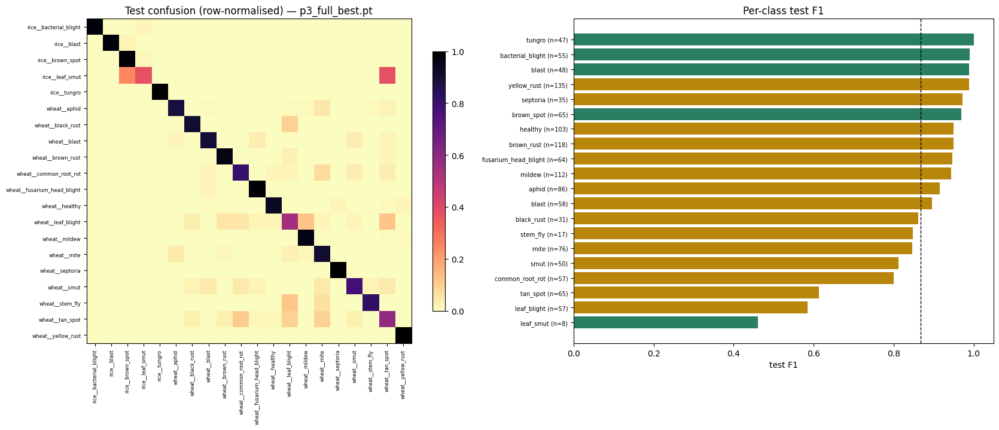


wrote test_results.json + test_results.png


In [27]:
# ============================================================
# CELL E1 — ONE test-set evaluation on the val-selected checkpoint (~3 min)
#            The test split has never influenced any decision. This runs once.
# ============================================================
import sys, json, time, importlib
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix
import timm
sys.path.insert(0, "/kaggle/working")
import pipeline; importlib.reload(pipeline)

DEV = "cuda:0"
L2I = json.load(open("/kaggle/working/label_to_idx.json"))
CLASSES = [k for k, _ in sorted(L2I.items(), key=lambda kv: kv[1])]; NC = len(CLASSES)
WHEAT = [L2I[c] for c in CLASSES if c.startswith("wheat")]
RICE  = [L2I[c] for c in CLASSES if c.startswith("rice")]
MODEL = "vit_small_patch16_224.augreg_in21k_ft_in1k"

# ---------- 1. pick the winner BY VAL, never by test ----------
cands = []
for p in sorted(CKPT.glob("*_best.pt")):
    if p.name.startswith("smoketest"): continue
    st = torch.load(p, map_location="cpu", weights_only=False)
    cands.append((st["metrics"].get("val_wheat15_f1", -1), p.name, st["epoch"], p))
cands.sort(reverse=True)
print("=== candidates (ranked by VAL wheat-15) ===")
for s, n, e, _ in cands: print(f"  {n:<24} ep {e:2d}   val_wheat15 {s:.4f}")
assert cands, "no checkpoints found"
BEST_VAL, BEST_NAME, BEST_EP, BEST_P = cands[0]
print(f"\nselected: {BEST_NAME} (epoch {BEST_EP})")

# ---------- 2. rebuild the exact architecture from the checkpoint ----------
class Net(nn.Module):
    def __init__(self, backbone, head):
        super().__init__(); self.backbone, self.head = backbone, head
    def forward(self, x): return self.head(self.backbone(x))

st = torch.load(BEST_P, map_location=DEV, weights_only=False)
sd = st["model"]
backbone = timm.create_model(MODEL, pretrained=True, num_classes=0).to(DEV)
head = nn.Linear(backbone.num_features, NC).to(DEV)
net = Net(backbone, head).to(DEV)
if any(k.startswith("backbone.") for k in sd):
    net.load_state_dict(sd); print("loaded full backbone+head")
else:
    head.load_state_dict(sd); print("loaded head only (frozen backbone)")
net.eval()

# ---------- 3. the single test pass ----------
_, te_dl = pipeline.make_loader("test", pipeline.build_transforms()[1], bs=128, workers=2)
P, Y = [], []
with torch.no_grad():
    for x, y in te_dl:
        with torch.autocast("cuda", dtype=torch.float16):
            P.append(net(x.to(DEV, non_blocking=True)).float().argmax(1).cpu())
        Y.append(y)
p, y = torch.cat(P).numpy(), torch.cat(Y).numpy()
print(f"test images: {len(y)}")

def mf1(yy, pp, labs=None):
    labs = list(range(NC)) if labs is None else labs
    m = np.isin(yy, labs)
    return f1_score(yy[m], pp[m], average="macro", zero_division=0, labels=labs)

# cluster bootstrap — v3 test is ~1 image/scene, so this is near image-level
idx = pd.read_csv("/kaggle/working/clean_index_v3.csv")
te_rows = idx[idx.split == "test"].reset_index(drop=True)
assert len(te_rows) == len(y), "index/loader order mismatch"
groups = te_rows["comp_0.95"].values
def cboot(labs=None, n=400):
    r = np.random.default_rng(42); uq = np.unique(groups)
    by = {g: np.where(groups == g)[0] for g in uq}
    v = [mf1(y[i], p[i], labs) for i in
         (np.concatenate([by[g] for g in r.choice(uq, len(uq), replace=True)])
          for _ in range(n))]
    return np.percentile(v, 2.5), np.percentile(v, 97.5)

print(f"\n{'='*62}\n=== TEST SET RESULTS — {BEST_NAME} ===\n{'='*62}")
res = {}
for nm, labs in [("20-way", None), ("wheat-15", WHEAT), ("rice-5", RICE)]:
    f = mf1(y, p, labs); lo, hi = cboot(labs)
    res[nm] = dict(f1=round(float(f), 4), ci=[round(lo, 4), round(hi, 4)])
    print(f"  {nm:<10} macro-F1 {f:.4f}   cluster 95% CI [{lo:.4f}, {hi:.4f}]")
acc = accuracy_score(y, p); res["accuracy"] = round(float(acc), 4)
print(f"  {'accuracy':<10} {acc:.4f}")

per = pd.Series(f1_score(y, p, average=None, zero_division=0, labels=range(NC)),
                index=CLASSES).round(4)
cnt = te_rows.label.value_counts().reindex(CLASSES)
pc = pd.DataFrame({"test_f1": per, "n_test": cnt}).sort_values("test_f1")
print("\n--- per-class test F1 (ascending) ---"); print(pc.to_string())

cm = confusion_matrix(y, p, labels=range(NC))
off = [(CLASSES[i], CLASSES[j], int(cm[i, j]), round(cm[i, j]/max(cm[i].sum(), 1), 3))
       for i in range(NC) for j in range(NC) if i != j and cm[i, j] > 0]
off = pd.DataFrame(off, columns=["true", "pred", "n", "frac_of_true"]).nlargest(12, "n")
print("\n--- top-12 test confusions ---"); print(off.to_string(index=False))

# ---------- 4. figures for the report ----------
fig, ax = plt.subplots(1, 2, figsize=(17, 7))
cmn = cm / np.maximum(cm.sum(1, keepdims=True), 1)
im = ax[0].imshow(cmn, cmap="magma_r", vmin=0, vmax=1)
ax[0].set_xticks(range(NC)); ax[0].set_xticklabels(CLASSES, rotation=90, fontsize=6)
ax[0].set_yticks(range(NC)); ax[0].set_yticklabels(CLASSES, fontsize=6)
ax[0].set_title(f"Test confusion (row-normalised) — {BEST_NAME}")
fig.colorbar(im, ax=ax[0], shrink=0.8)
o = pc.sort_values("test_f1")
c = ["#2a7f62" if i.startswith("rice") else "#b8860b" for i in o.index]
ax[1].barh(range(NC), o.test_f1.values, color=c)
ax[1].set_yticks(range(NC))
ax[1].set_yticklabels([f"{i.split('__')[1]} (n={int(n)})"
                       for i, n in zip(o.index, o.n_test)], fontsize=7)
ax[1].axvline(res["20-way"]["f1"], ls="--", c="k", lw=1)
ax[1].set_xlim(0, 1.05); ax[1].set_xlabel("test F1"); ax[1].set_title("Per-class test F1")
plt.tight_layout(); plt.savefig("/kaggle/working/test_results.png", dpi=130); plt.show()

json.dump({"checkpoint": BEST_NAME, "epoch": int(BEST_EP), "val_wheat15": float(BEST_VAL),
           "test": res, "per_class": per.to_dict(), "n_test": int(len(y)),
           "top_confusions": off.to_dict("records")},
          open("/kaggle/working/test_results.json", "w"), indent=2)
print("\nwrote test_results.json + test_results.png")